# User params

# Utility functions

In [1]:
import os
import pandas as pd

# Outlier detection with PyOD


In [2]:
from sklearn.model_selection import train_test_split
# Load the data (the parquet file) into a dataframe
combined_df = pd.read_parquet(os.path.join('..', 'data', 'processed', 'combined_dataset_1000.parquet'))

# Split the data into train and test sets
train_df, test_df = train_test_split(combined_df, test_size=0.2, random_state=42)

c:\Users\alexi\AppData\Local\pypoetry\Cache\virtualenvs\reviewoutliers-SwZO3ms--py3.12\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but IsolationForest was fitted without feature names
  warnings.warn(
c:\Users\alexi\AppData\Local\pypoetry\Cache\virtualenvs\reviewoutliers-SwZO3ms--py3.12\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but IsolationForest was fitted without feature names
  warnings.warn(
c:\Users\alexi\AppData\Local\pypoetry\Cache\virtualenvs\reviewoutliers-SwZO3ms--py3.12\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but IsolationForest was fitted without feature names
  warnings.warn(
c:\Users\alexi\AppData\Local\pypoetry\Cache\virtualenvs\reviewoutliers-SwZO3ms--py3.12\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but IsolationForest was fitted without feature names
  warnings.warn(


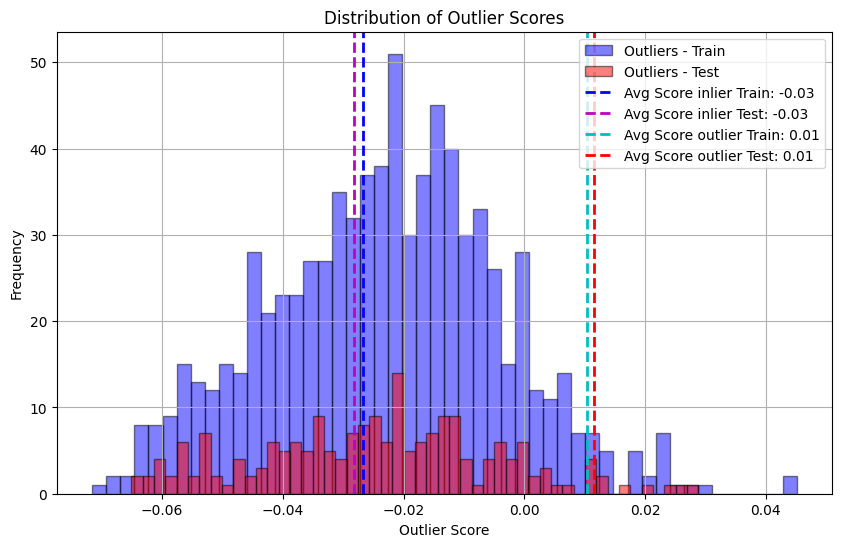

KS Score - Train: 1.00, Test: 1.00
PSI Score - Train: 1.50, Test: 8.87, (higher is more different)


In [6]:
from pyod.models.iforest import IForest
import numpy as np
import matplotlib.pyplot as plt

# Train the Isolation Forest model on the training set
model = IForest(contamination=0.1, random_state=42)  # 0.1 -> expect 10% of outliers 
model.fit(train_df)

# Predict on both the training and testing sets
outliers_train = model.predict(train_df)  # array of 0 (inliner) and 1 (outlier)
outliers_test = model.predict(test_df)

scores_train = model.decision_function(train_df)   # scores. > 0 -> outlier
scores_test = model.decision_function(test_df)

# categorize samples
train_scores_inliers = scores_train[outliers_train==0]
train_scores_outliers = scores_train[outliers_train==1]

test_scores_inliers = scores_test[outliers_test==0]
test_scores_outliers = scores_test[outliers_test==1]

# Calculate average outlier scores for train and test sets
average_score_inlier_train = np.mean(train_scores_inliers)
average_score_outlier_train = np.mean(train_scores_outliers)

average_score_inlier_test = np.mean(test_scores_inliers)
average_score_outlier_test = np.mean(test_scores_outliers)



# Plotting the histogram of outlier scores for train and test sets
plt.figure(figsize=(10, 6))
plt.hist(scores_train, bins=50, alpha=0.5, color='blue', edgecolor='black', label='Outliers - Train')
plt.hist(scores_test, bins=50, alpha=0.5, color='red', edgecolor='black', label='Outliers - Test')

plt.axvline(average_score_inlier_train, color='b', linestyle='dashed', linewidth=2, label=f'Avg Score inlier Train: {average_score_inlier_train:.2f}')
plt.axvline(average_score_inlier_test, color='m', linestyle='dashed', linewidth=2, label=f'Avg Score inlier Test: {average_score_inlier_test:.2f}')

plt.axvline(average_score_outlier_train, color='c', linestyle='dashed', linewidth=2, label=f'Avg Score outlier Train: {average_score_outlier_train:.2f}')
plt.axvline(average_score_outlier_test, color='r', linestyle='dashed', linewidth=2, label=f'Avg Score outlier Test: {average_score_outlier_test:.2f}')

plt.title('Distribution of Outlier Scores')
plt.xlabel('Outlier Score')
plt.ylabel('Frequency')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

from src.utils.distribution_shift import ks_test_score, psi
ks_score_train = ks_test_score(train_scores_inliers, train_scores_outliers)
ks_score_test = ks_test_score(test_scores_inliers, test_scores_outliers)

psi_score_train = psi(scores_train, train_scores_outliers)
psi_score_test = psi(scores_train, test_scores_outliers)

print(f'KS Score - Train: {ks_score_train:.2f}, Test: {ks_score_test:.2f}')
print(f'PSI Score - Train: {psi_score_train:.2f}, Test: {psi_score_test:.2f}, (higher is more different)')

# Distribution shift scores

In [ ]:
# Separate outliers and normal samples
normal_samples = combined_df[outliers == 0]
outlier_samples = combined_df[outliers == 1]

In [ ]:
from src.utils.distribution_shift import ks_test_score

ks_scores = {}
for column in combined_df.columns:
    ks_scores[column] = ks_test_score(normal_samples[column], outlier_samples[column])


In [ ]:
from src.utils.distribution_shift import psi

psi_scores = {}
for column in combined_df.columns:
    psi_scores[column] = psi(normal_samples[column], outlier_samples[column])


C:\Users\alexi\WORKSPACE\interview_abwaab\ReviewOutliers\src\utils\distribution_shift.py:56: RuntimeWarning: invalid value encountered in divide
  psi_value = np.sum((expected_percents - actual_percents) * np.log(expected_percents / actual_percents))
C:\Users\alexi\WORKSPACE\interview_abwaab\ReviewOutliers\src\utils\distribution_shift.py:56: RuntimeWarning: divide by zero encountered in divide
  psi_value = np.sum((expected_percents - actual_percents) * np.log(expected_percents / actual_percents))


In [ ]:
import matplotlib.pyplot as plt

def plot_histograms(normal_samples, outlier_samples, columns):
    for column in columns:
        plt.figure(figsize=(10, 6))
        plt.hist(normal_samples[column], bins=30, alpha=0.5, label='Normal Samples')
        plt.hist(outlier_samples[column], bins=30, alpha=0.5, label='Outliers')
        plt.title(f'Histogram of {column}')
        plt.xlabel(column)
        plt.ylabel('Frequency')
        plt.legend(loc='upper right')
        plt.show()

# Usage
plot_histograms(normal_samples, outlier_samples, combined_df.columns)


In [ ]:
def plot_boxplots(normal_samples, outlier_samples, columns):
    for column in columns:
        plt.figure(figsize=(10, 6))
        data = [normal_samples[column], outlier_samples[column]]
        plt.boxplot(data, labels=['Normal Samples', 'Outliers'])
        plt.title(f'Box Plot of {column}')
        plt.ylabel(column)
        plt.show()

# Usage
plot_boxplots(normal_samples, outlier_samples, combined_df.columns)


C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


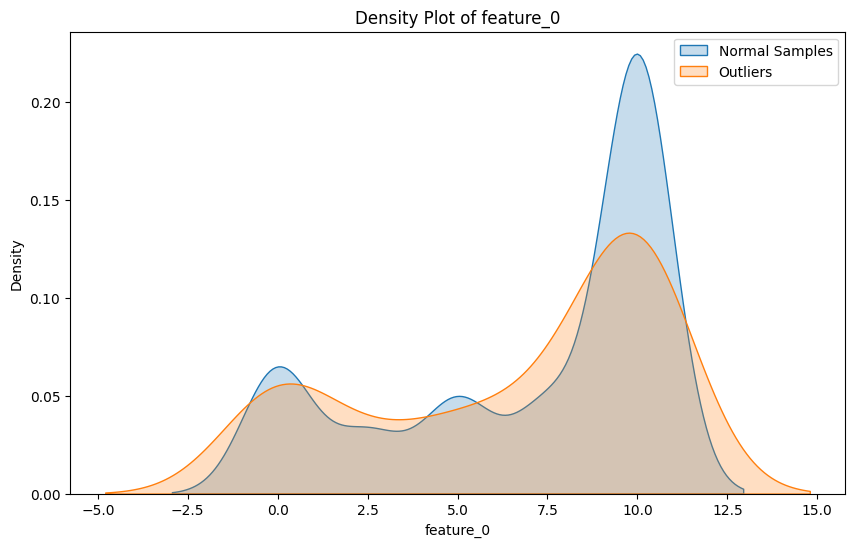

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


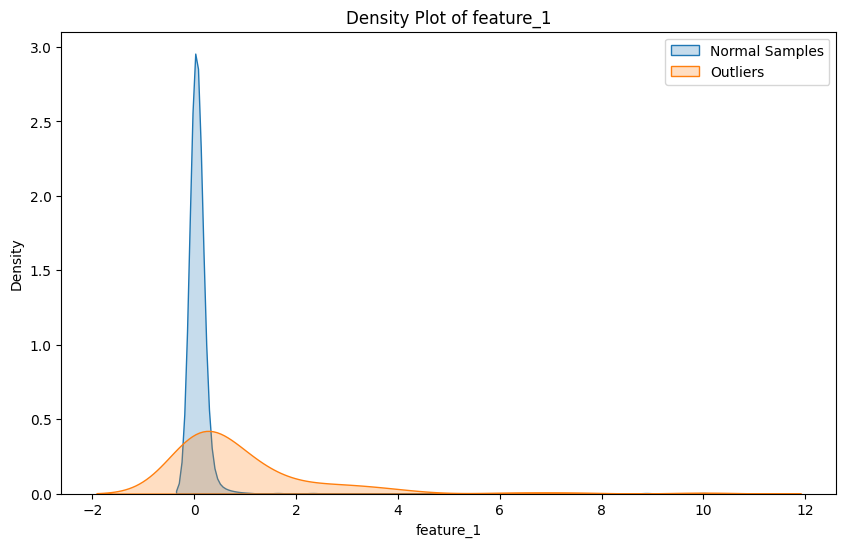

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


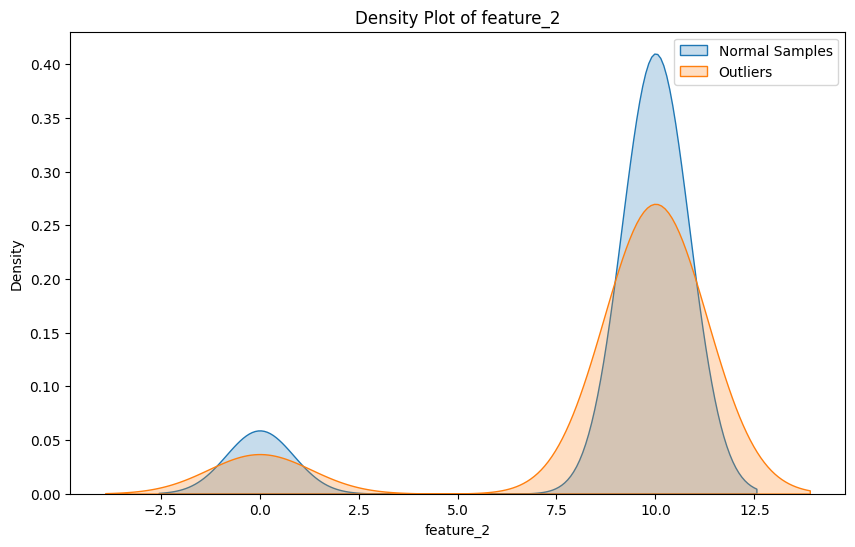

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


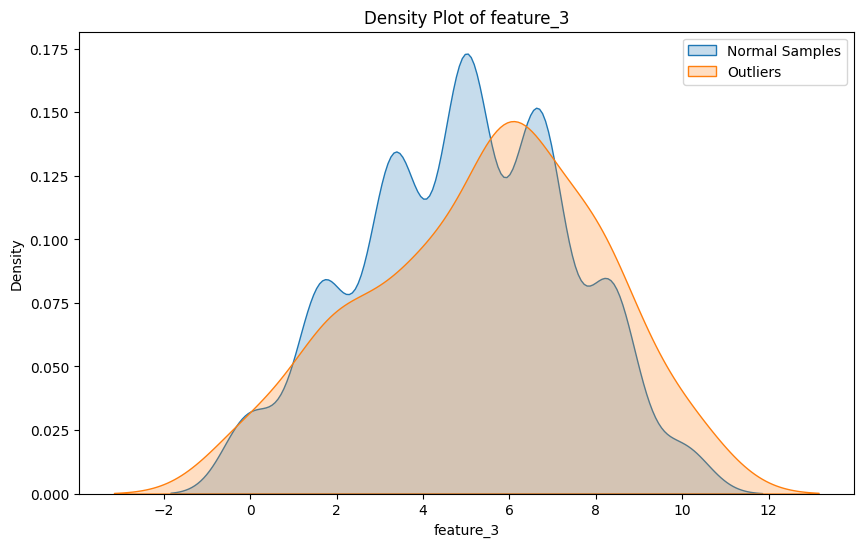

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


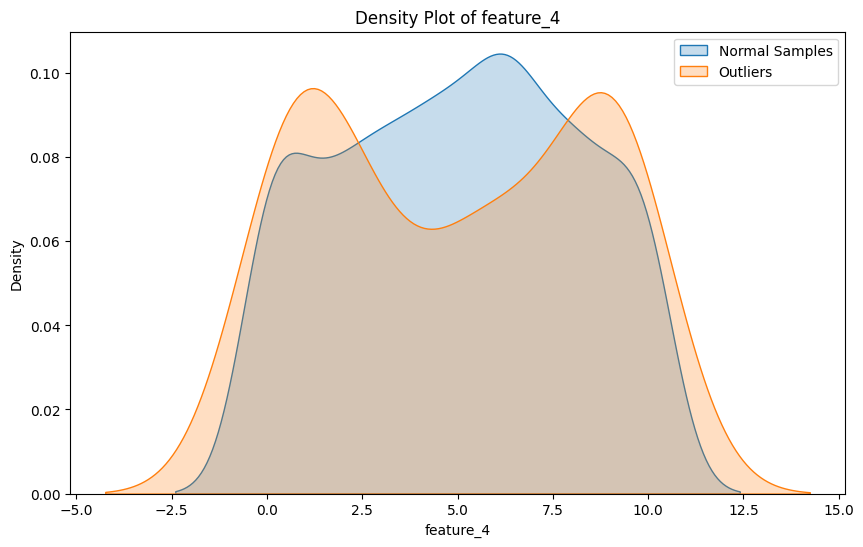

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


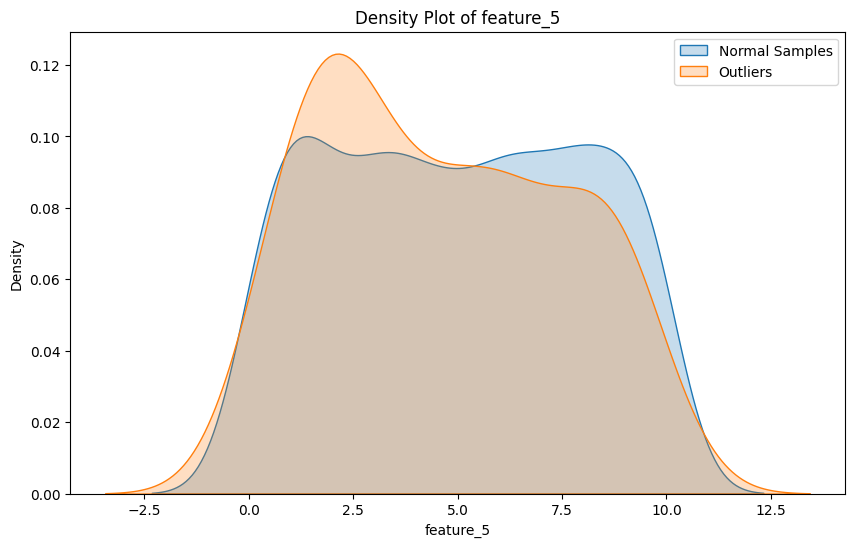

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


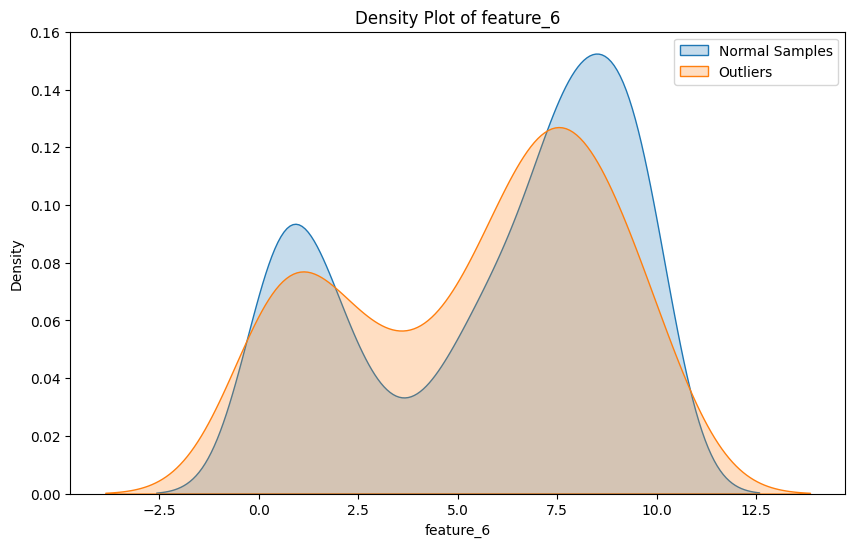

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


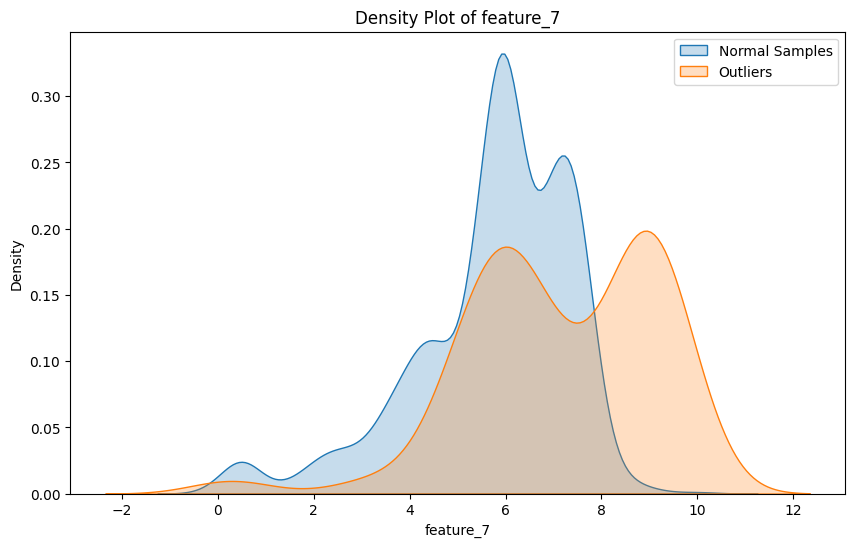

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


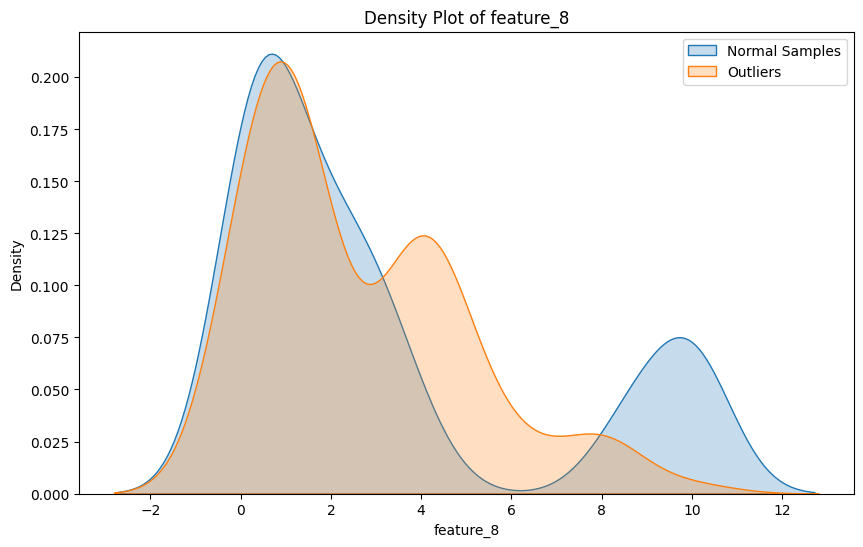

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` 

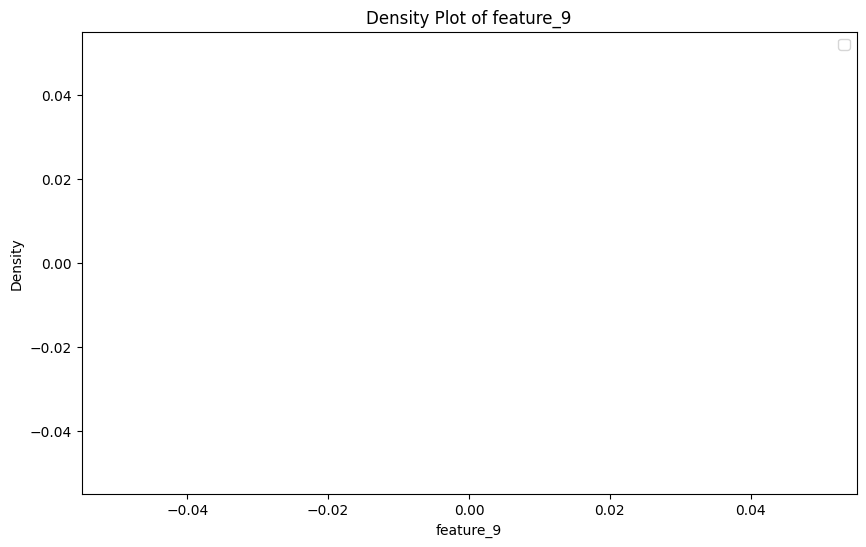

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


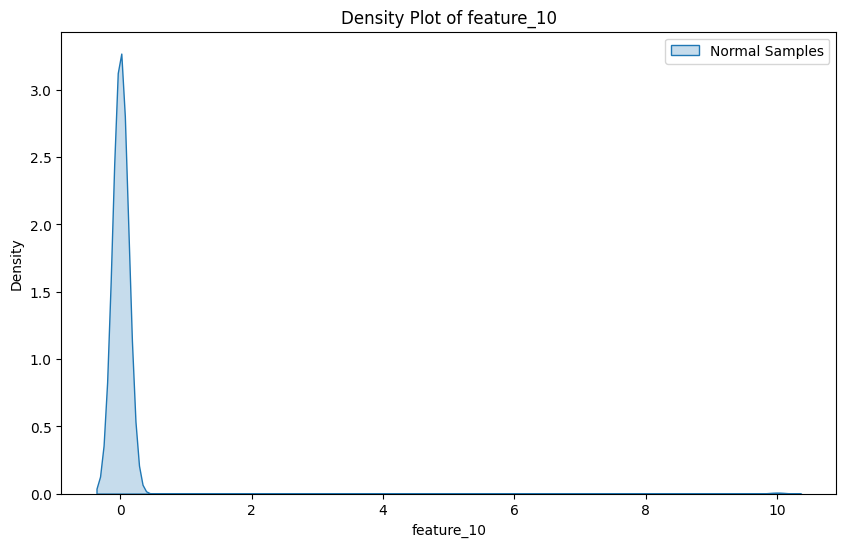

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


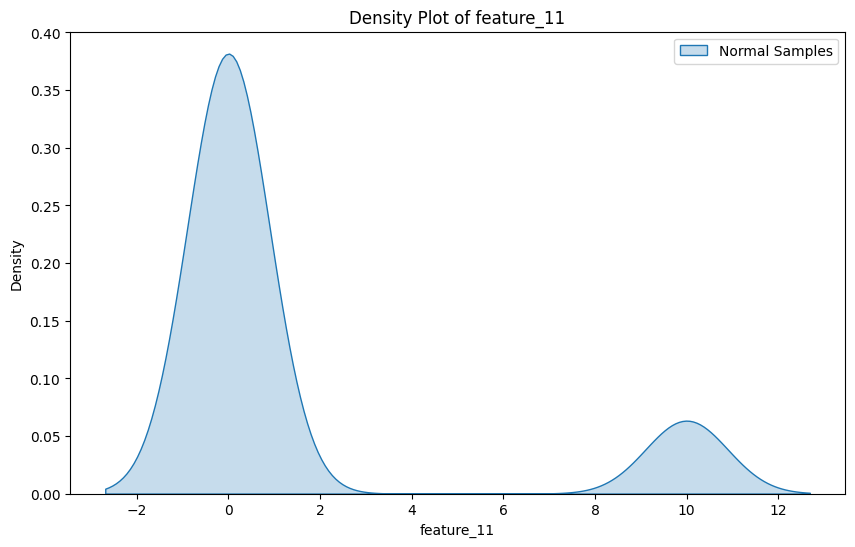

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


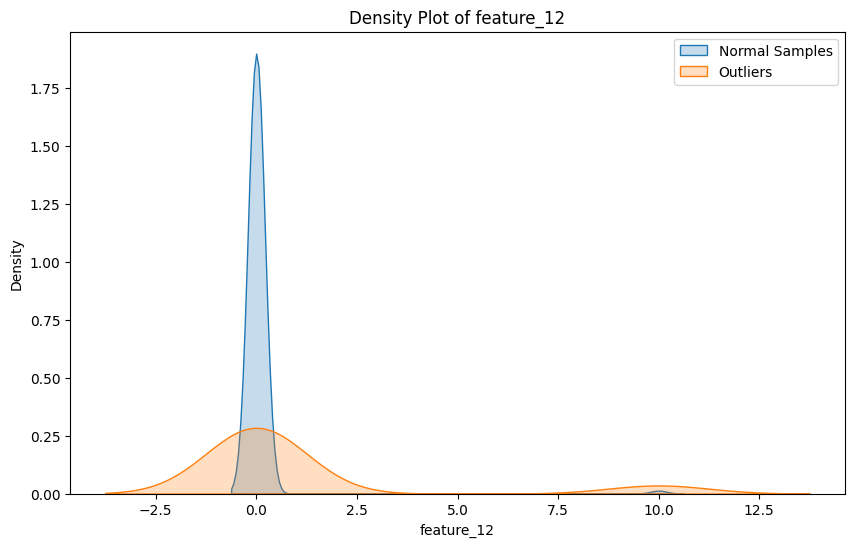

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


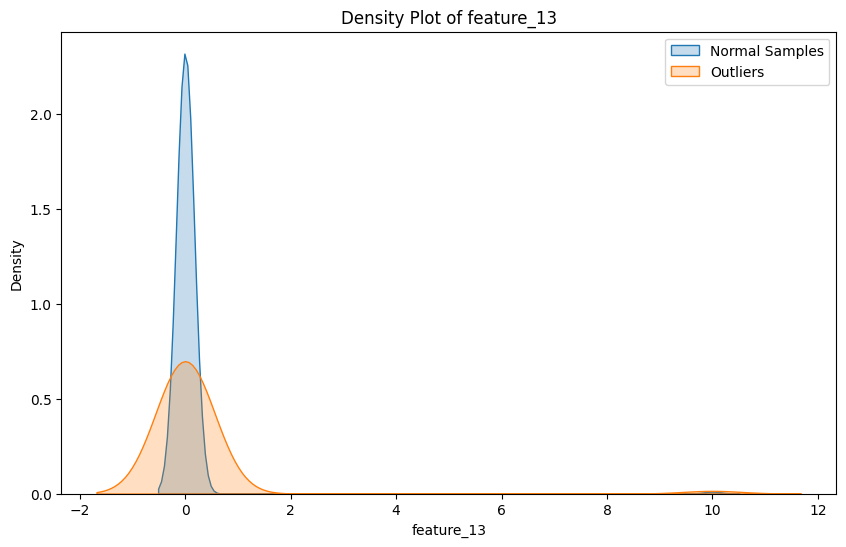

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


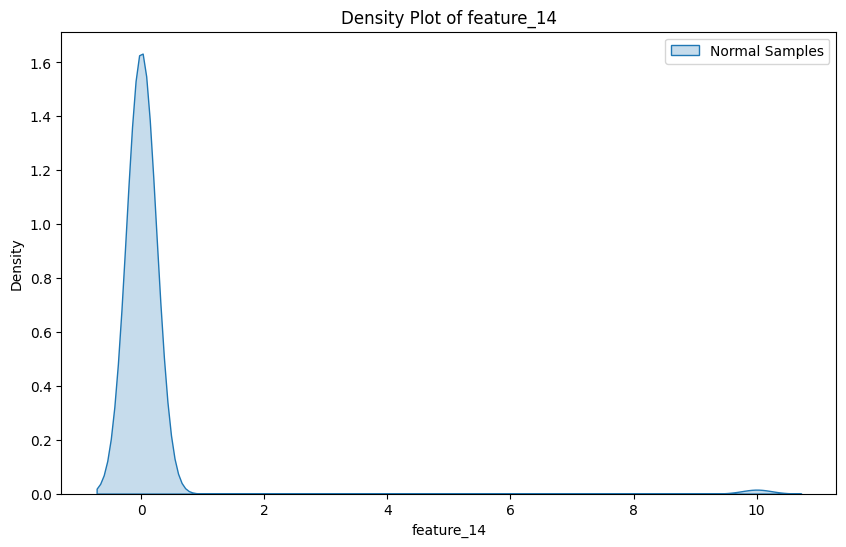

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


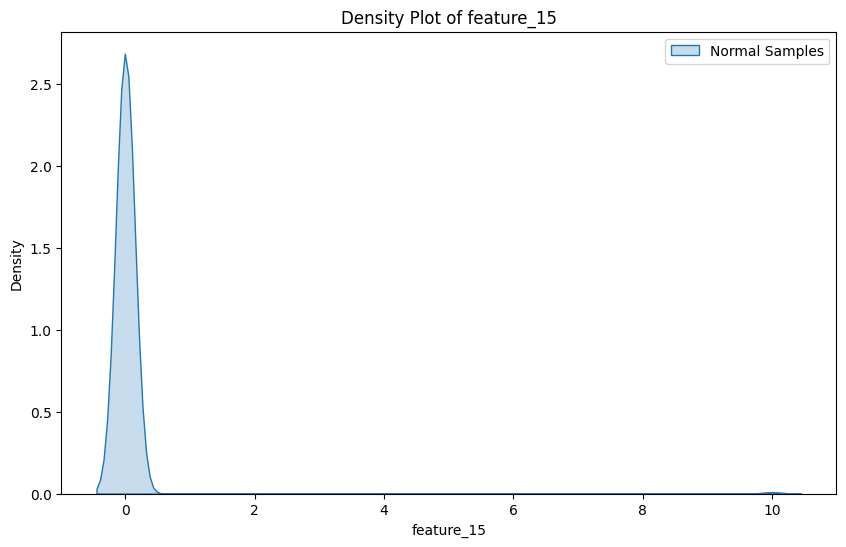

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


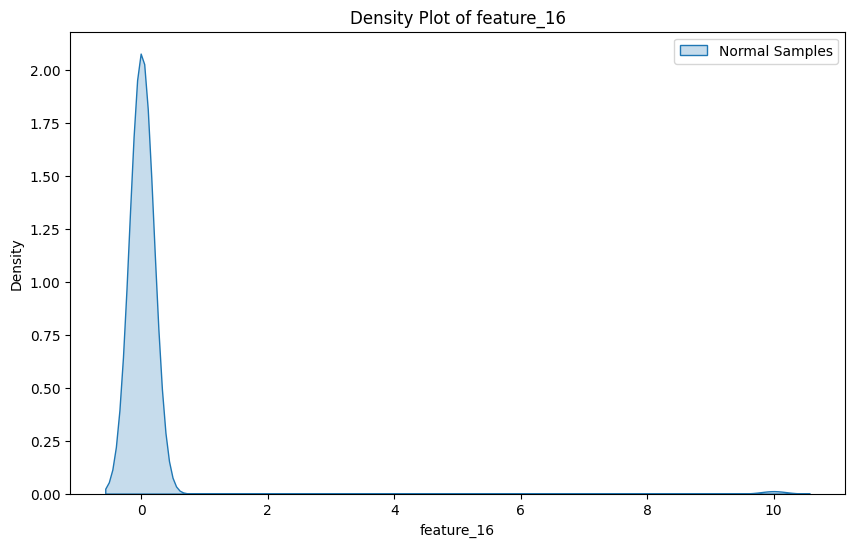

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


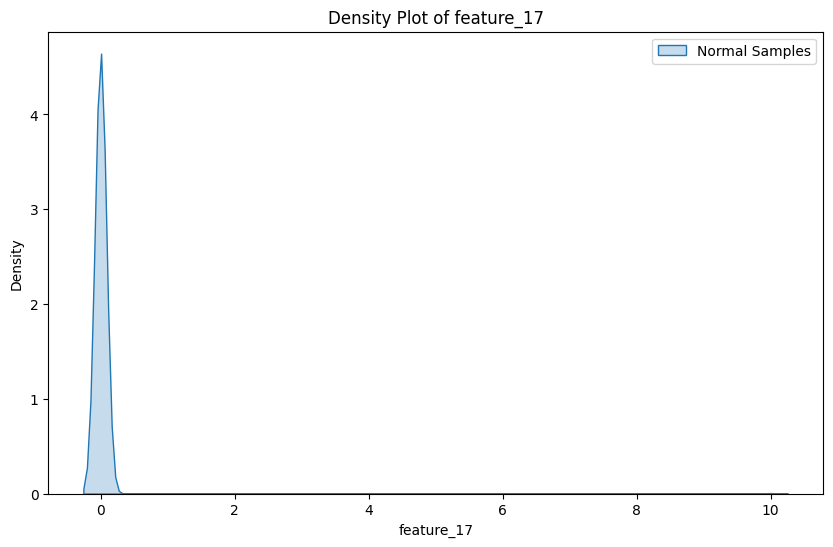

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


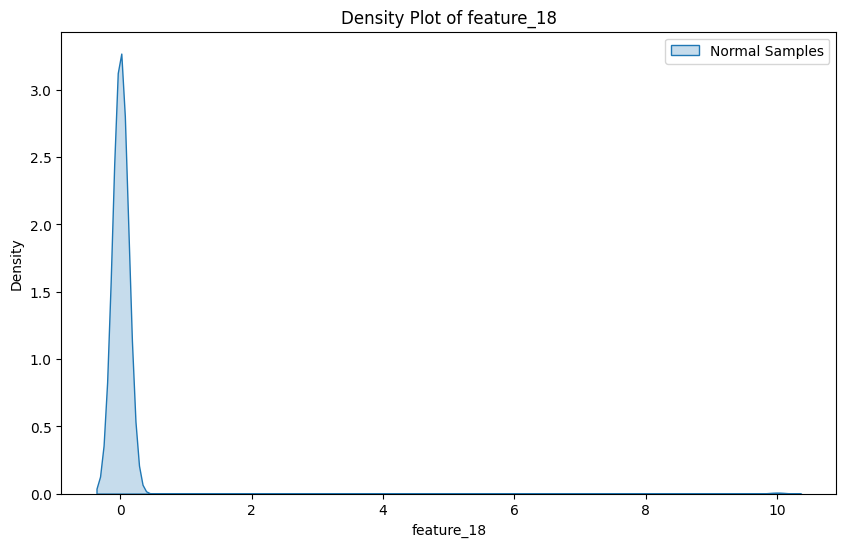

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


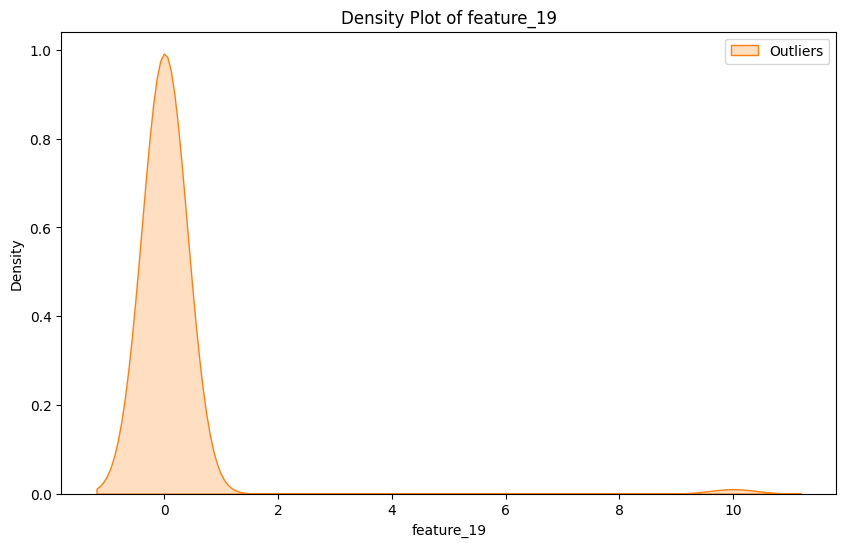

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


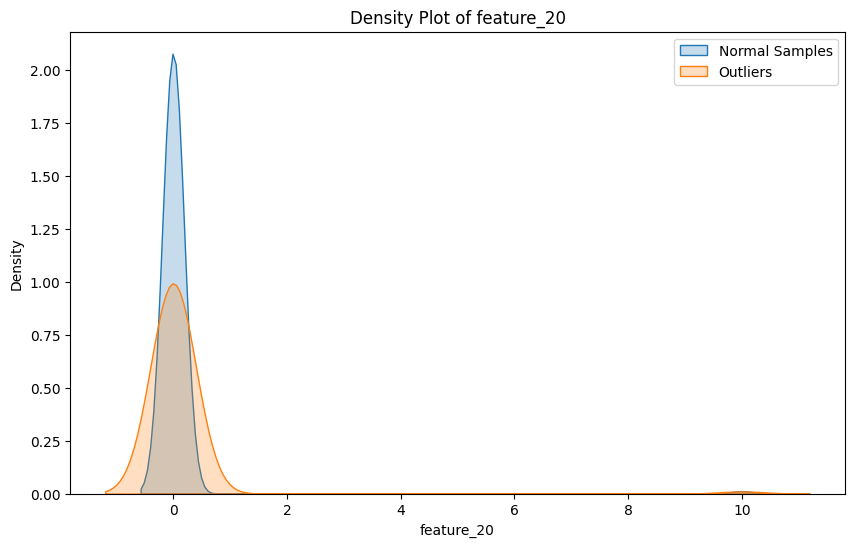

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


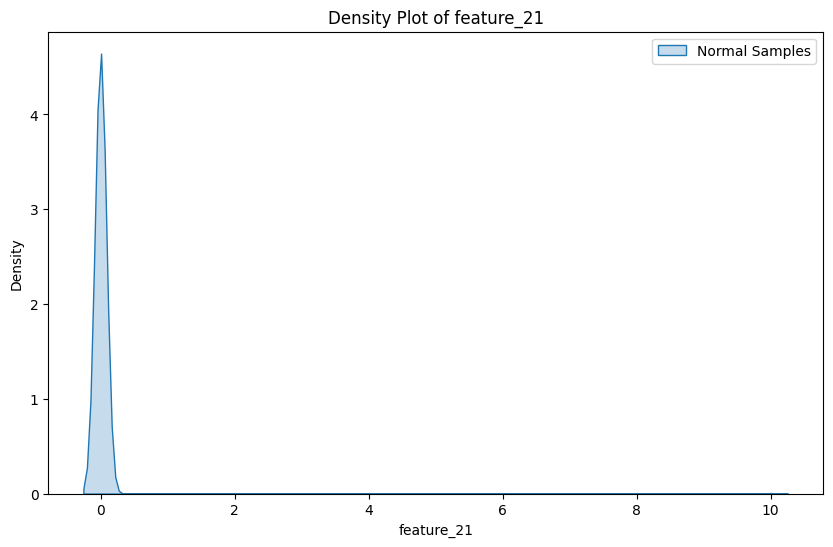

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


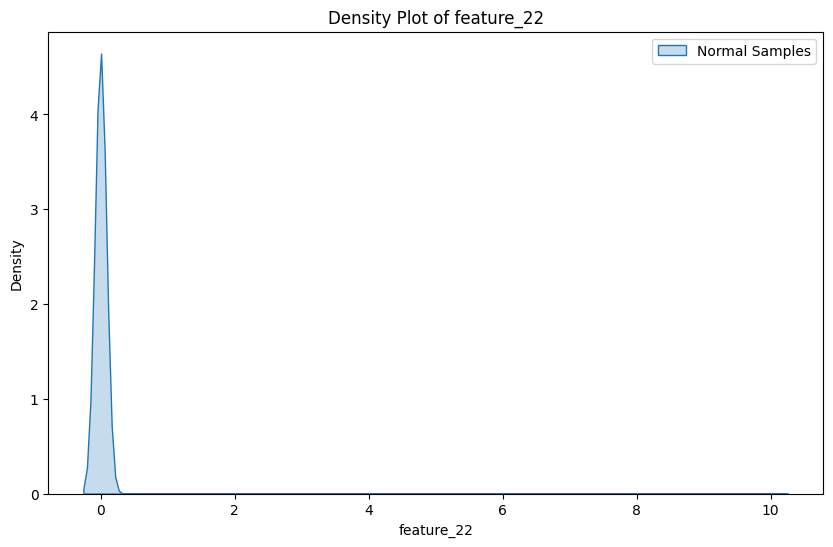

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


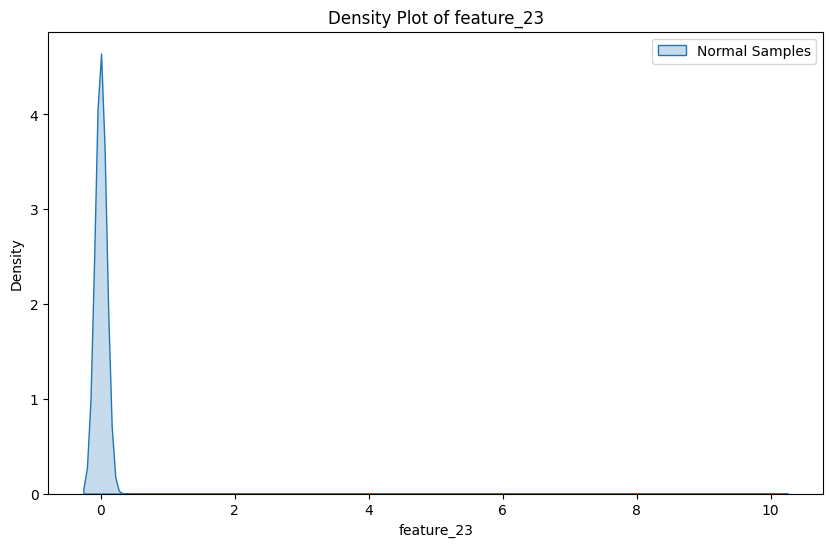

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


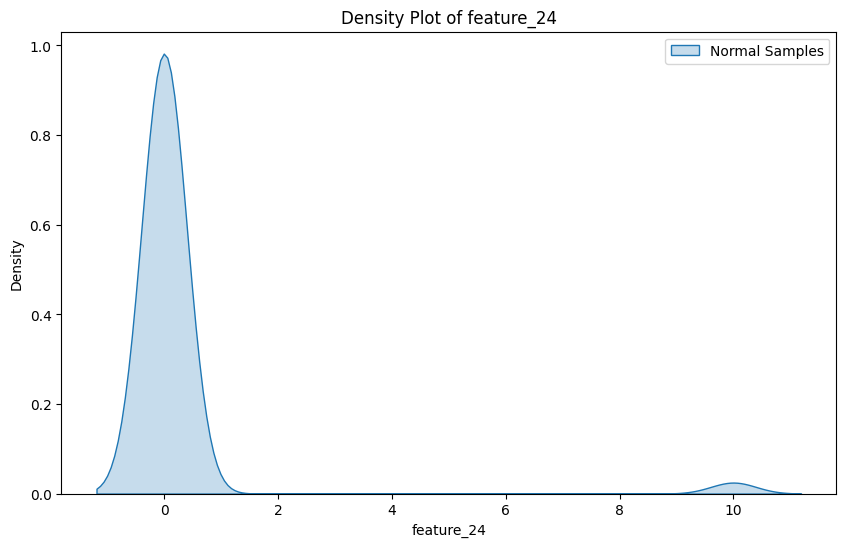

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


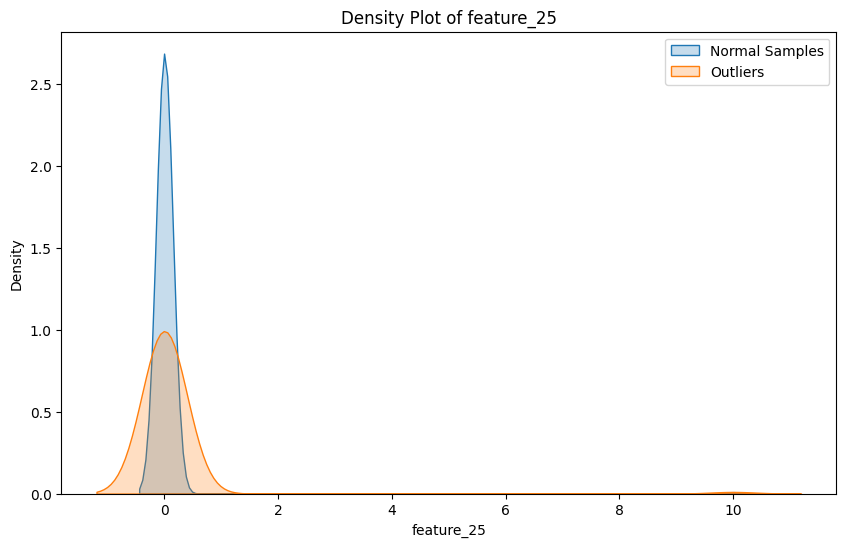

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


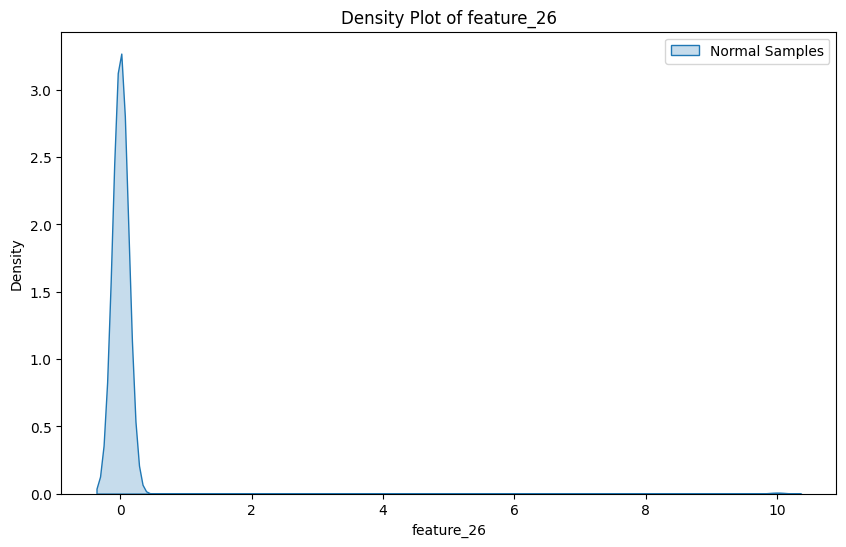

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


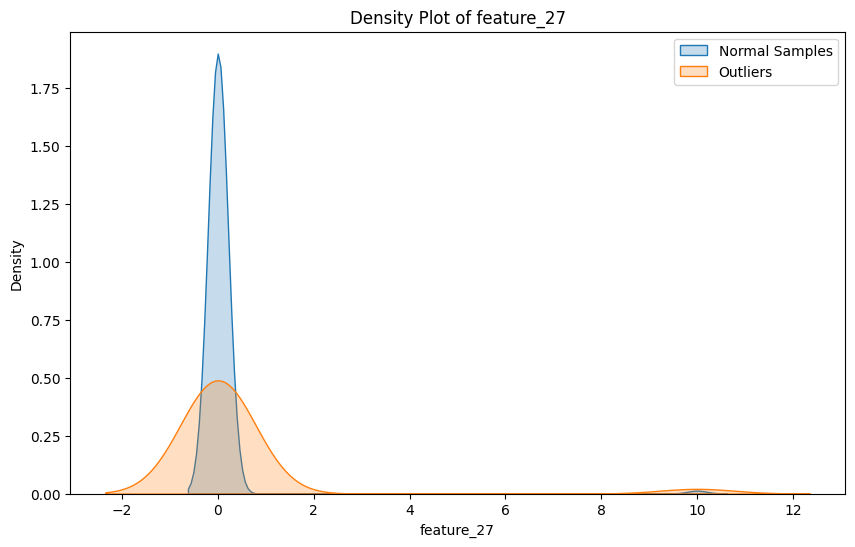

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


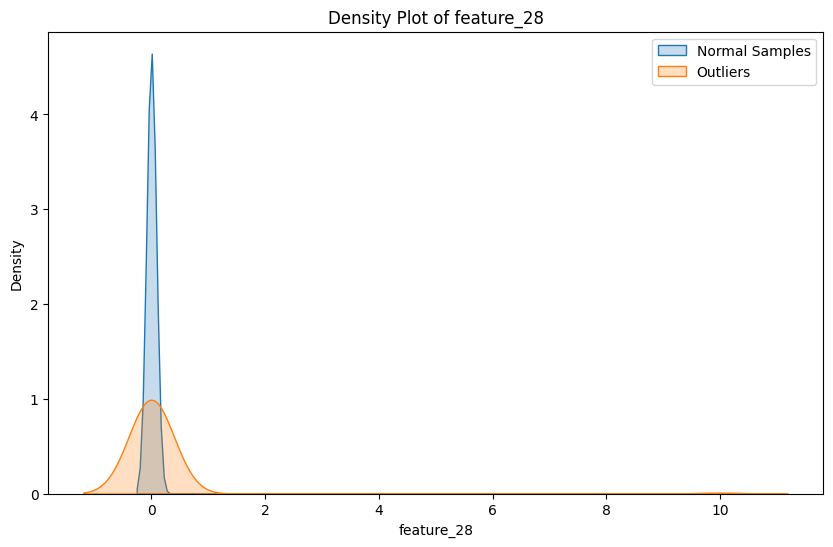

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


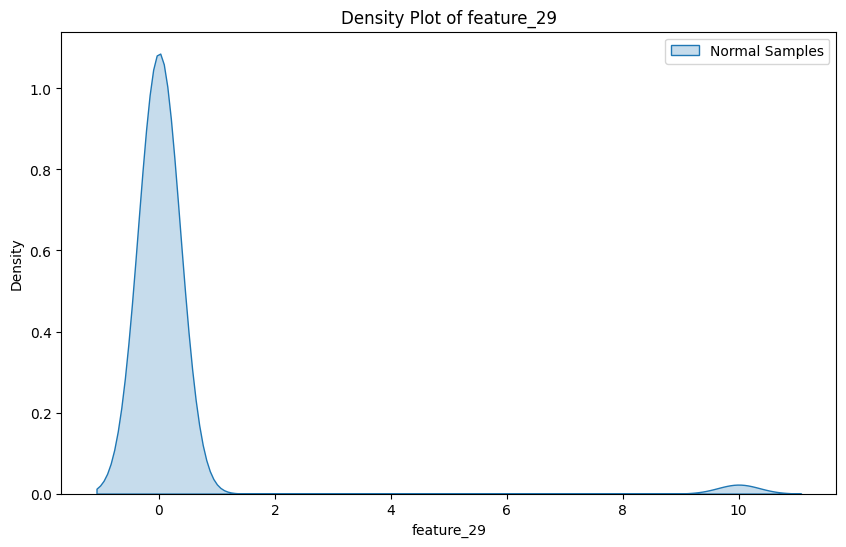

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


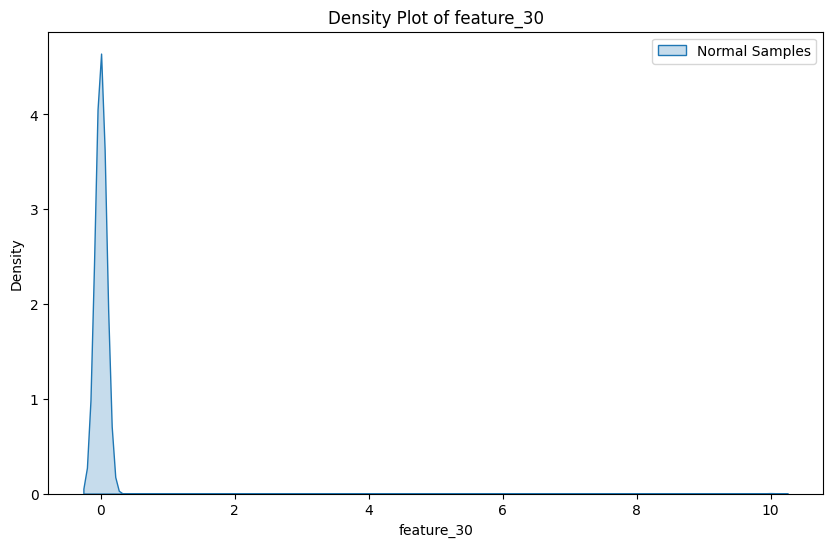

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


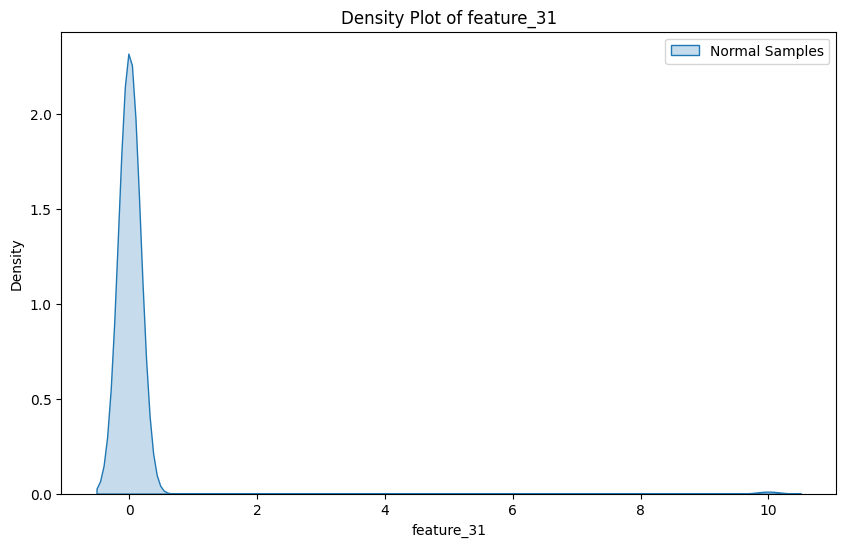

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


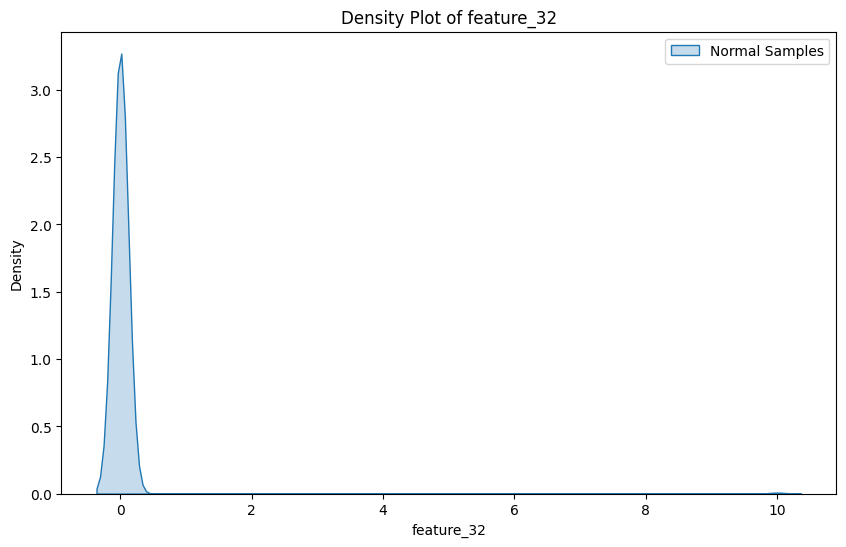

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


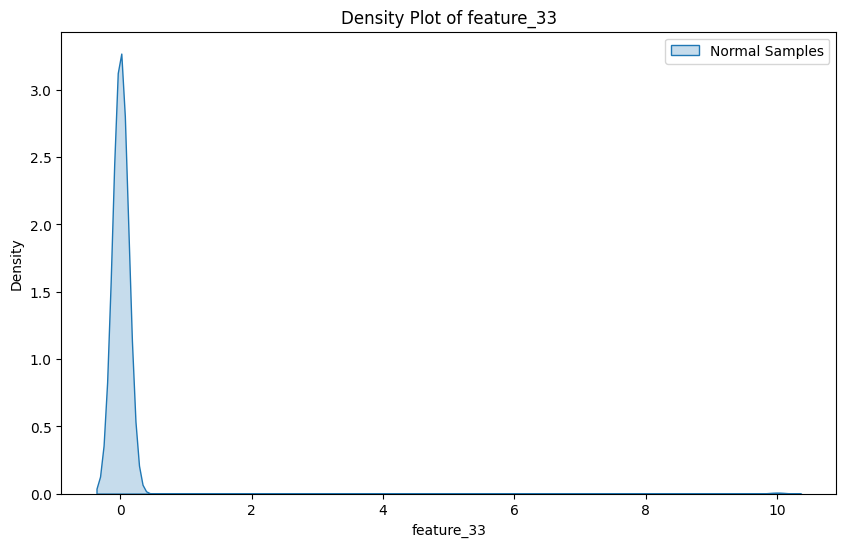

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


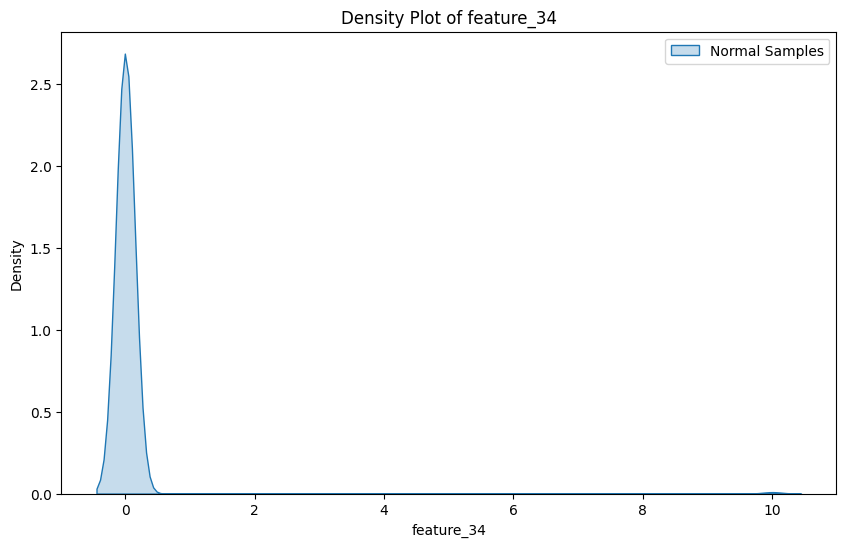

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


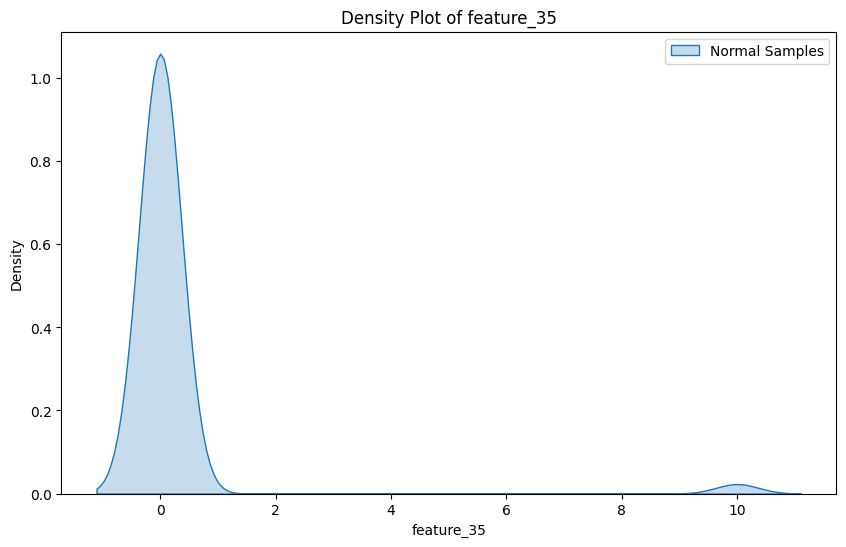

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


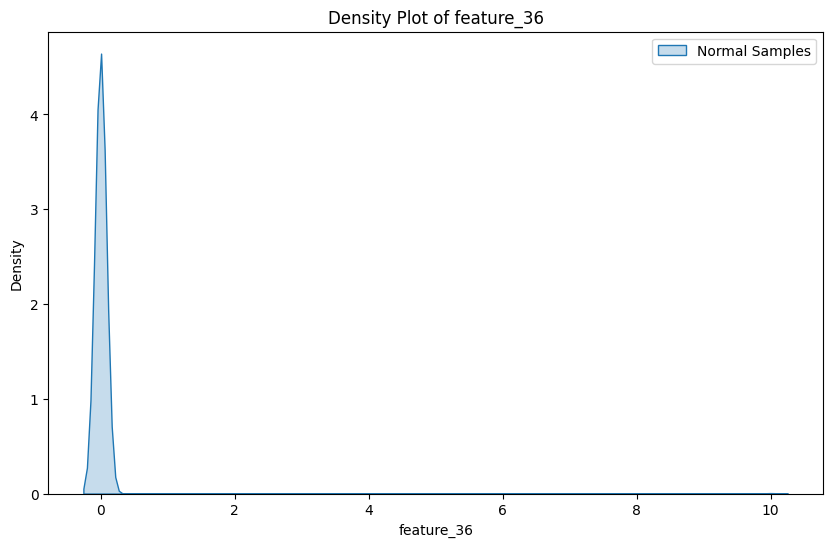

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


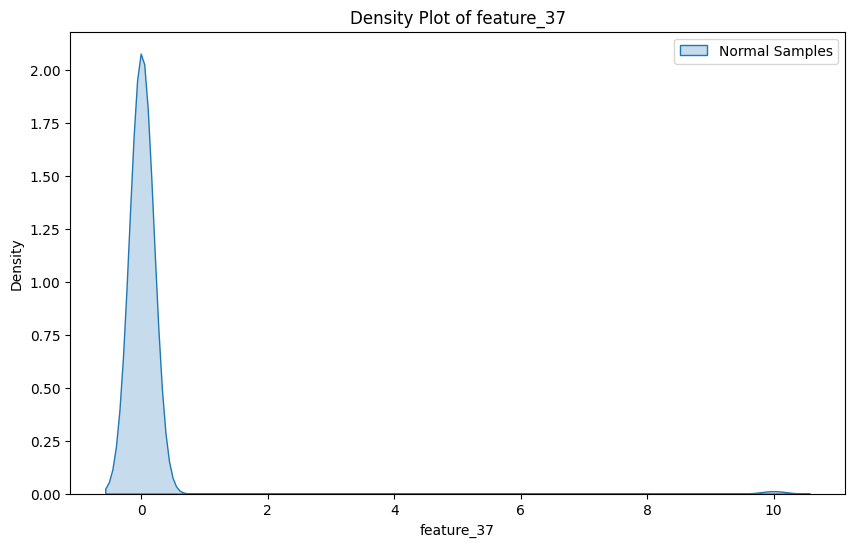

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


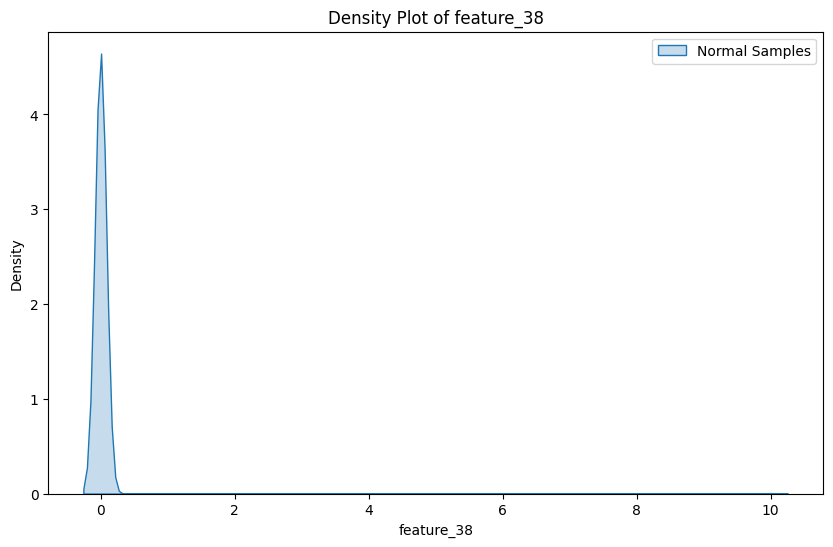

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


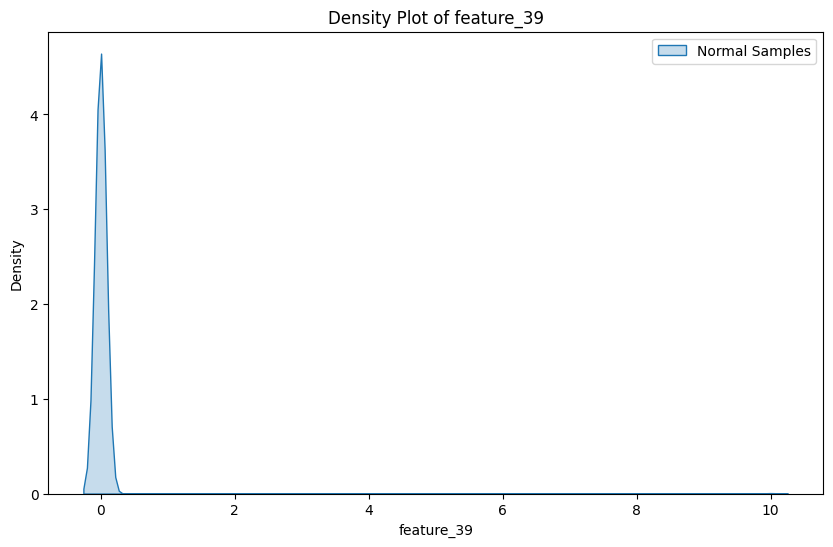

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


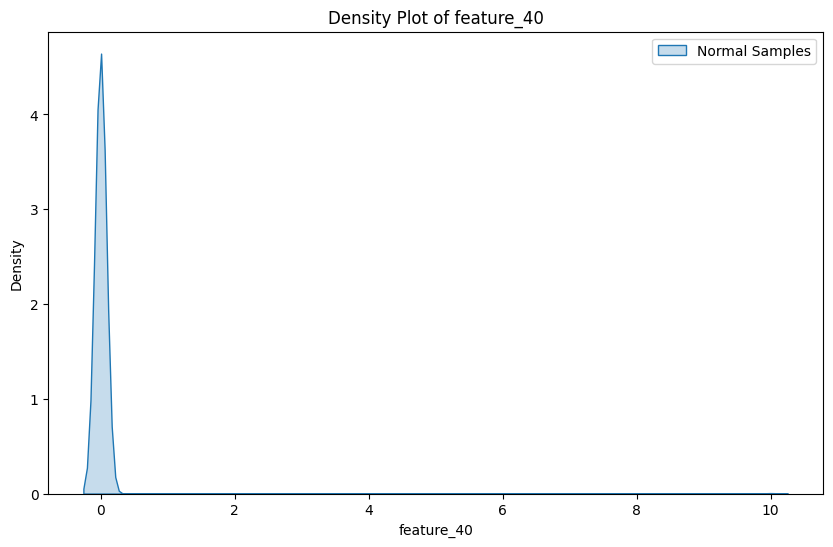

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


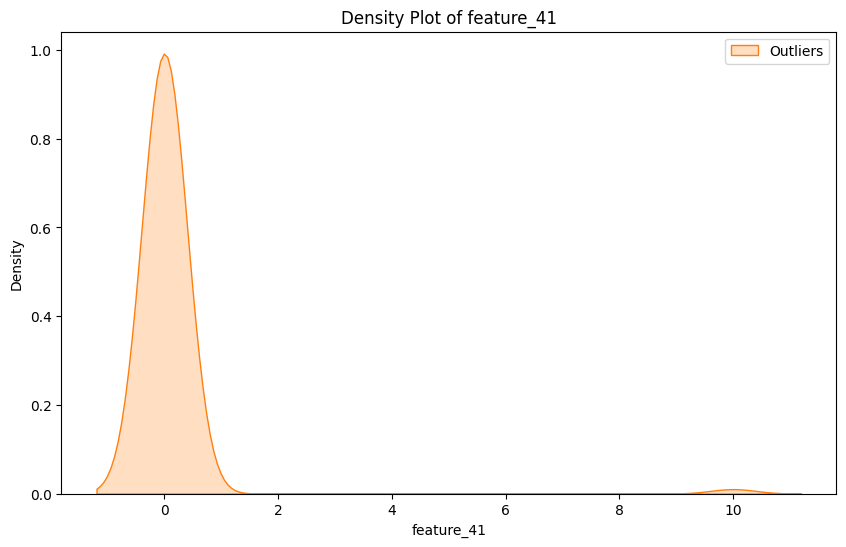

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


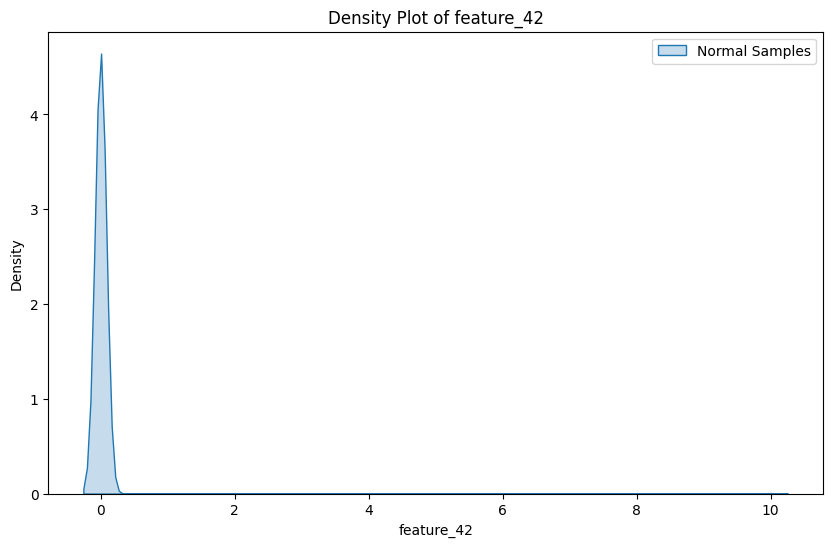

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


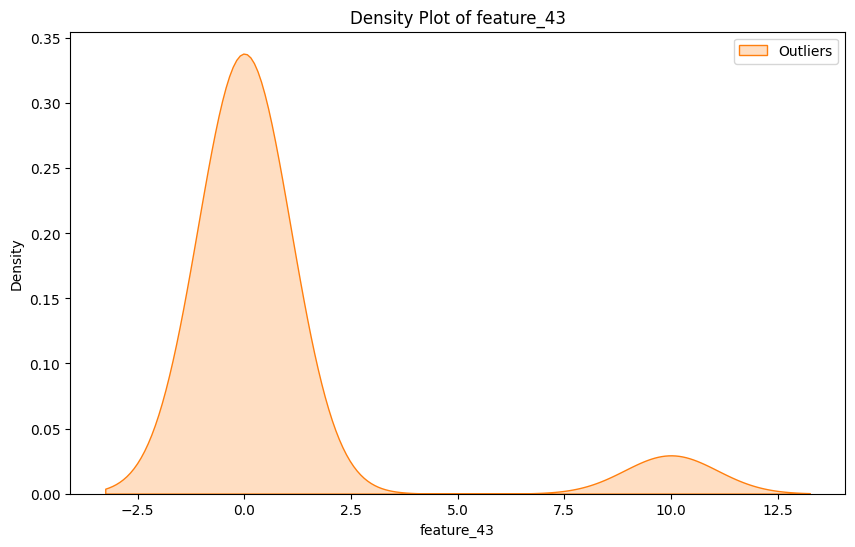

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


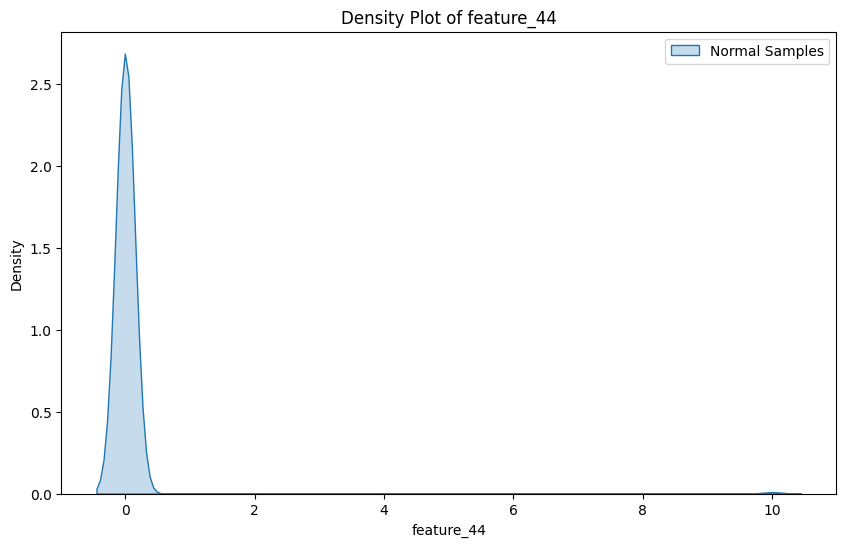

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


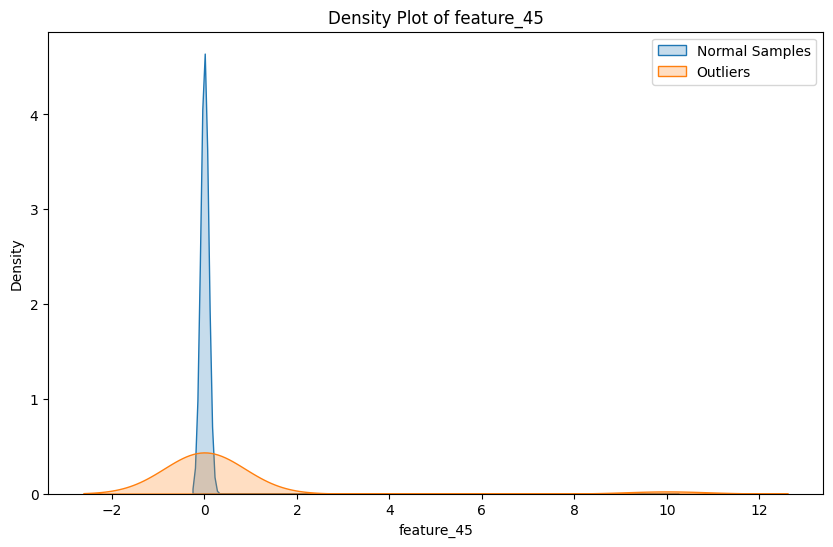

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


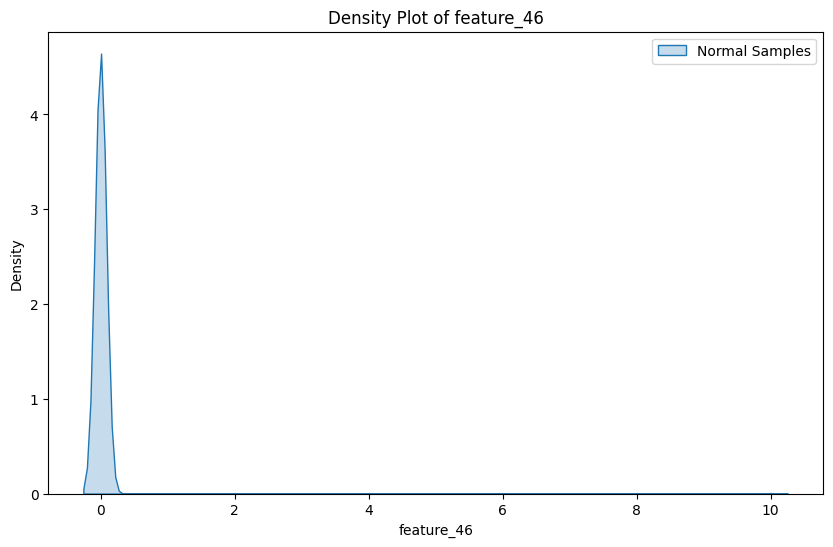

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


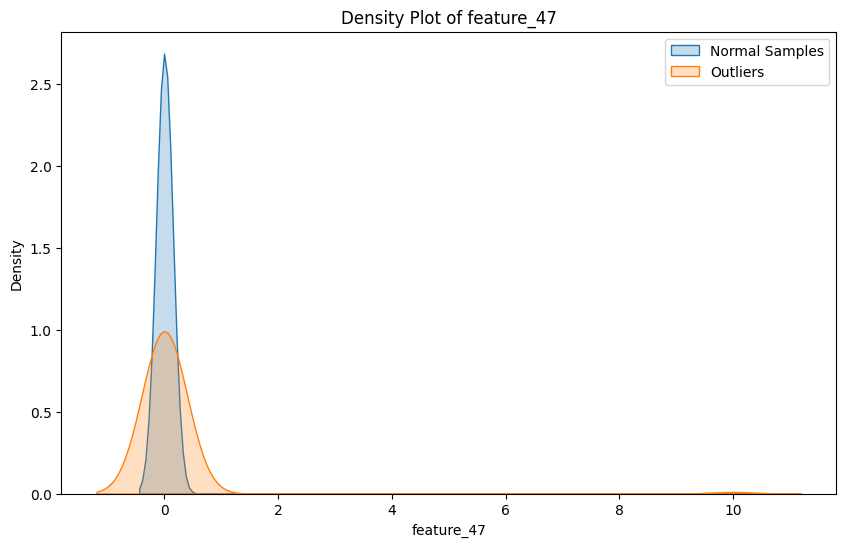

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


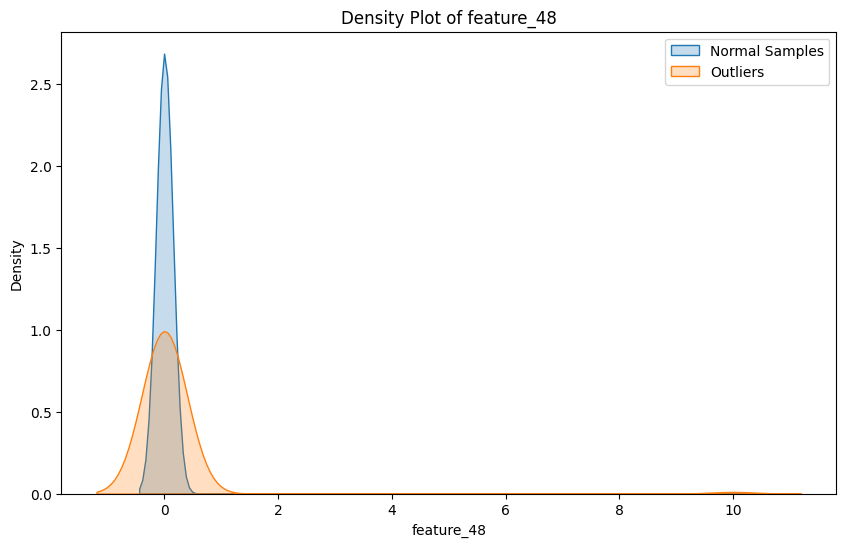

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


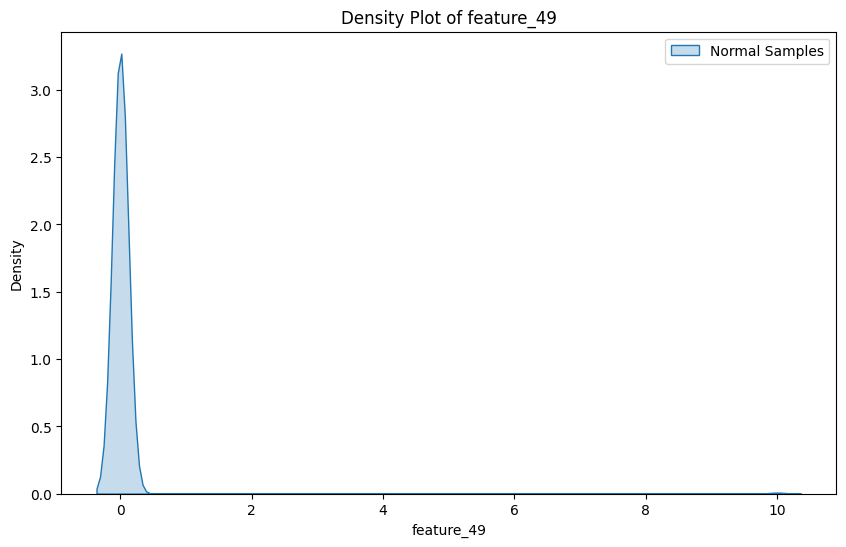

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


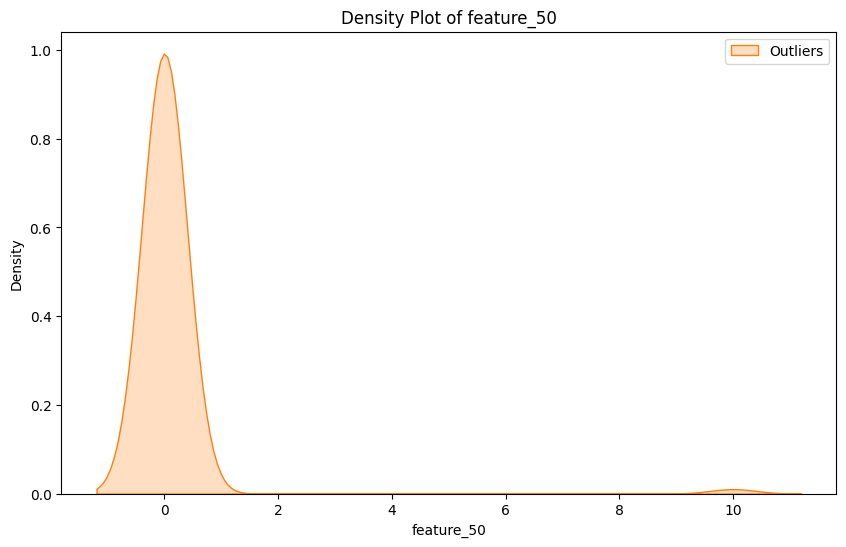

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


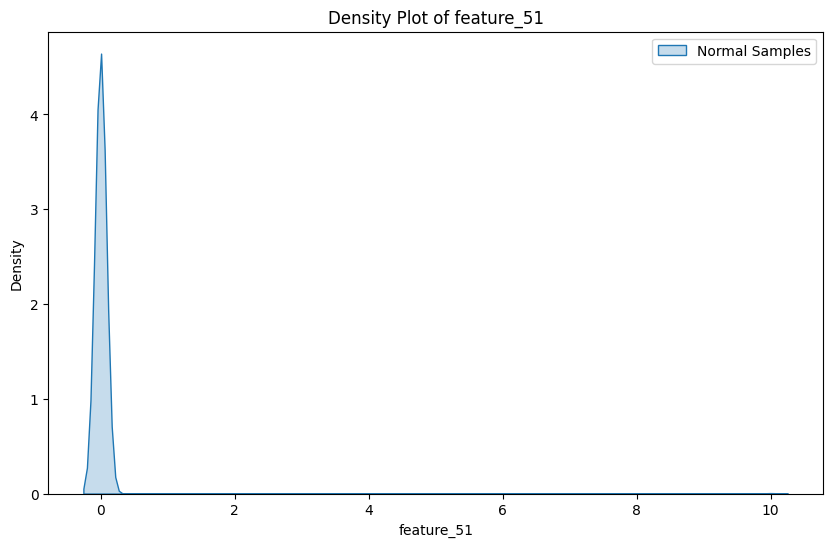

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


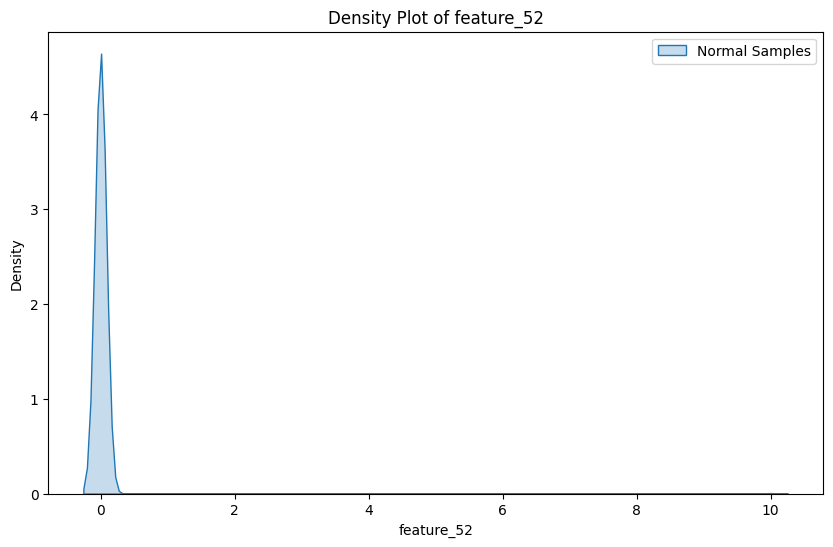

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


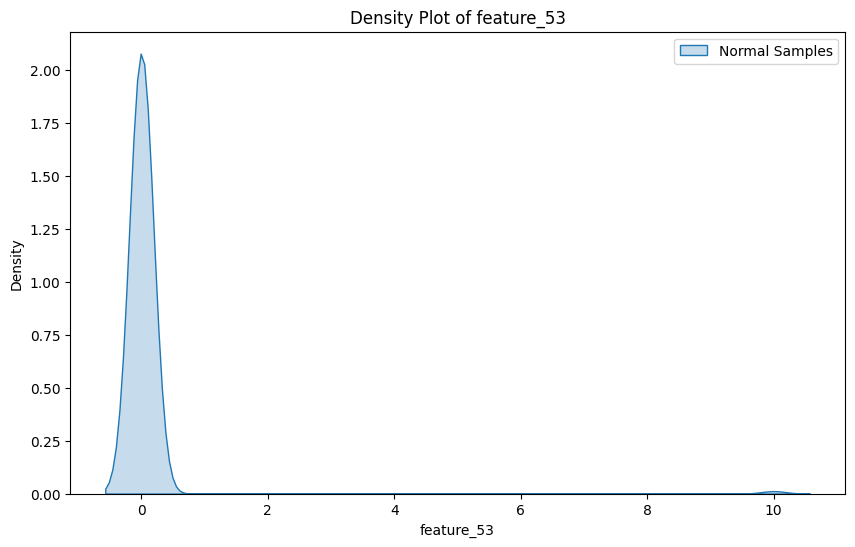

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


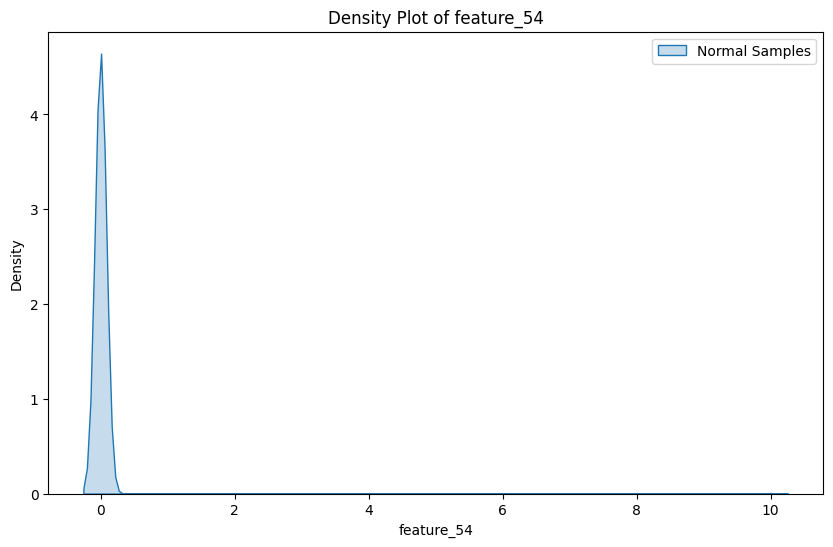

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


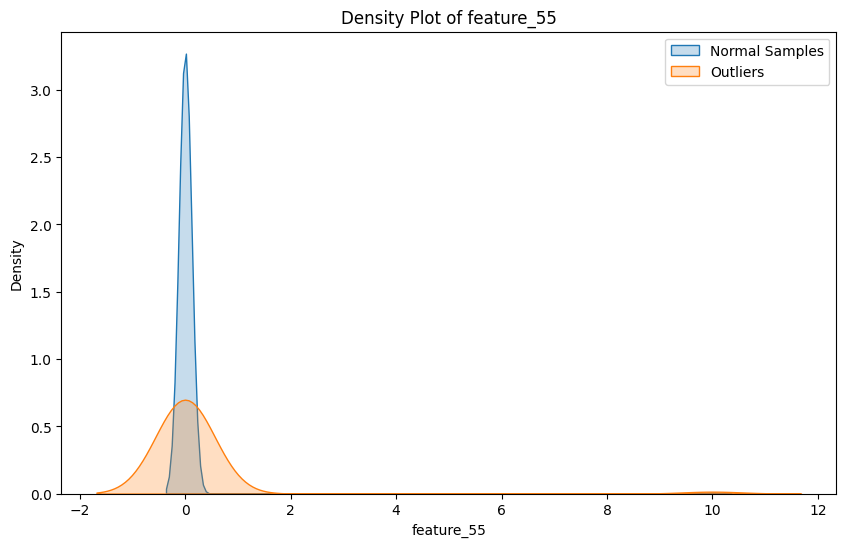

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


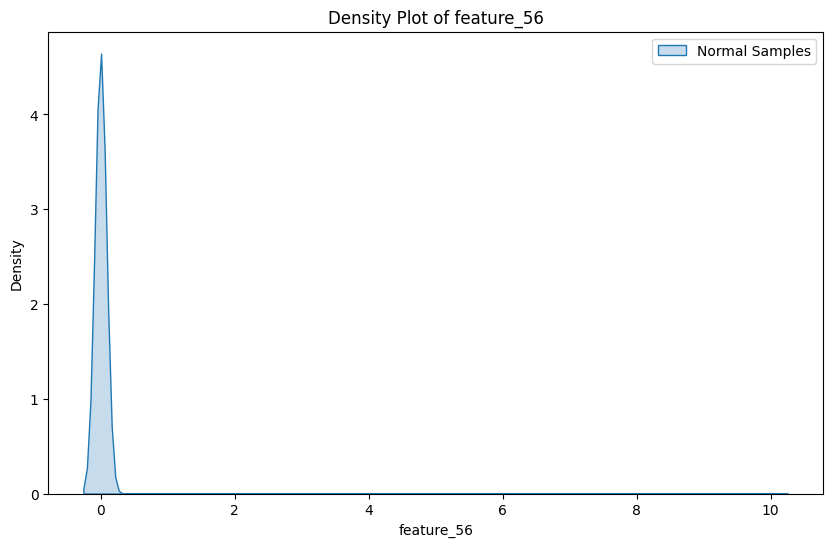

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


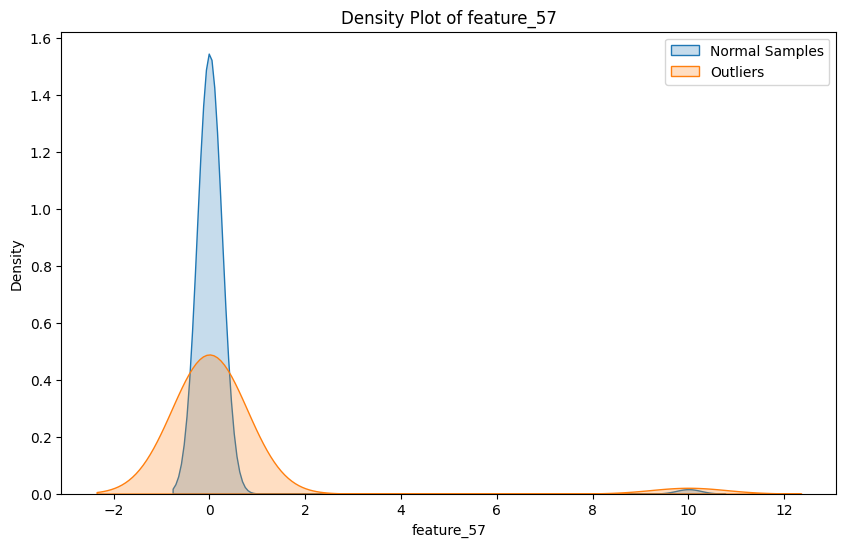

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


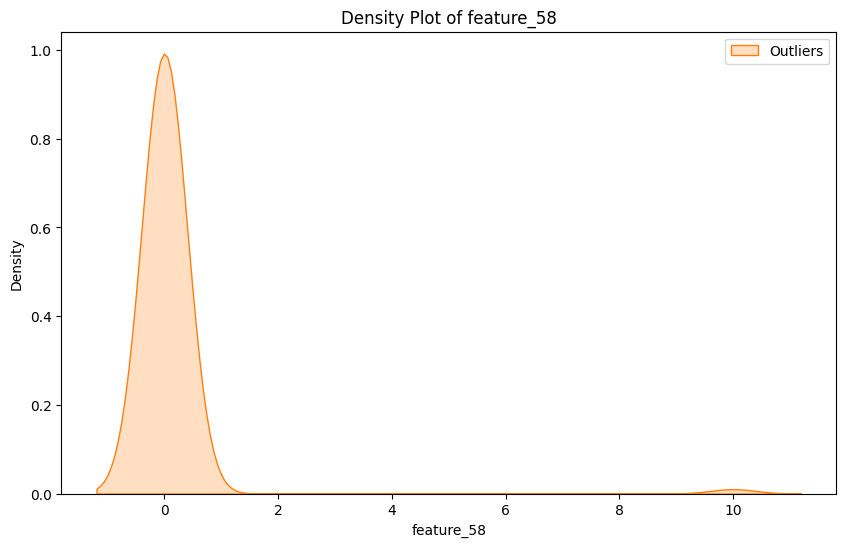

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


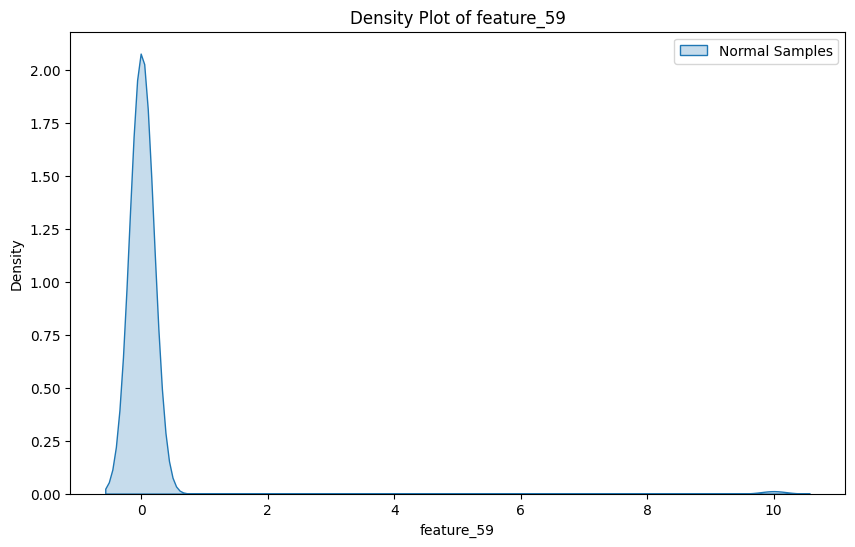

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


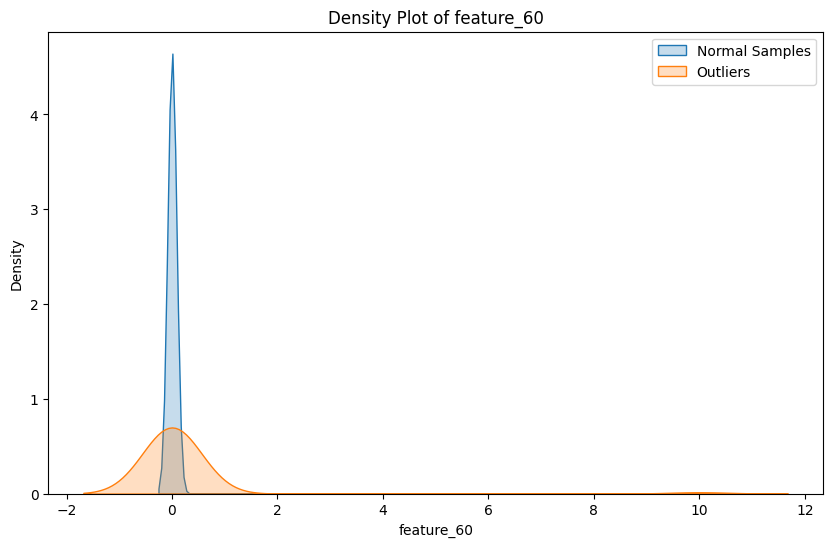

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


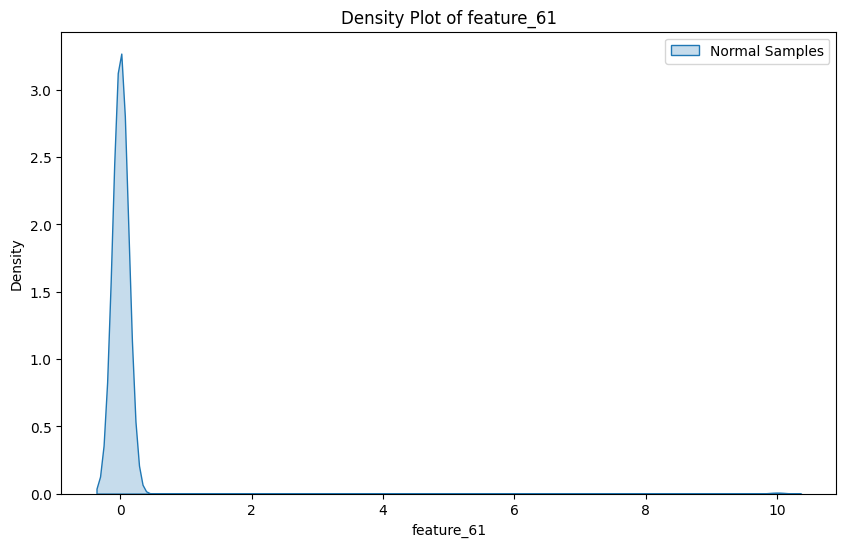

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


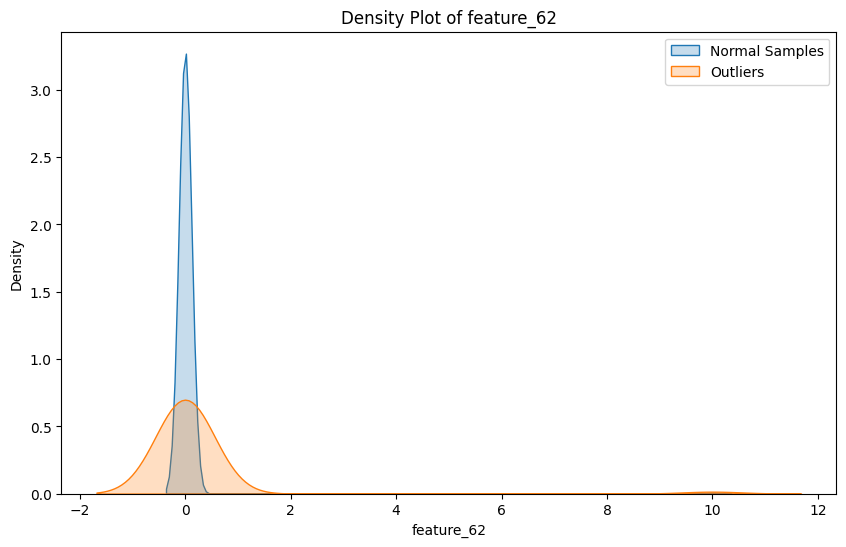

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


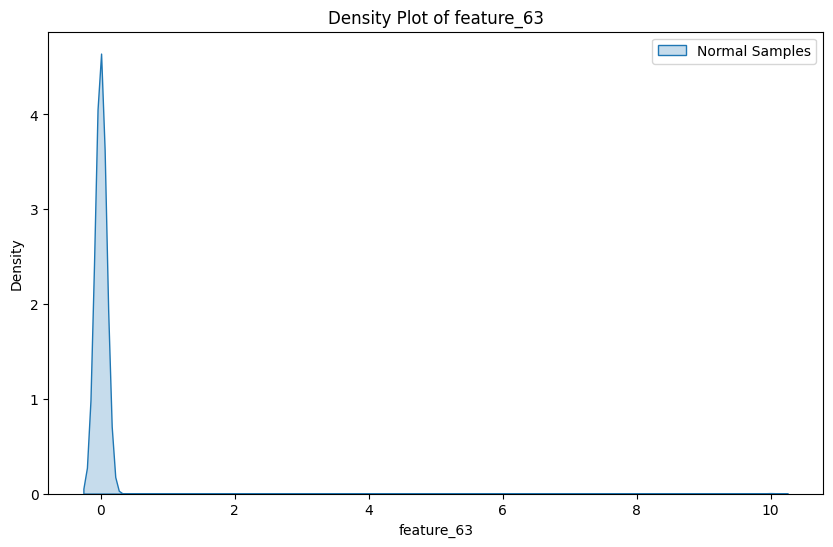

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


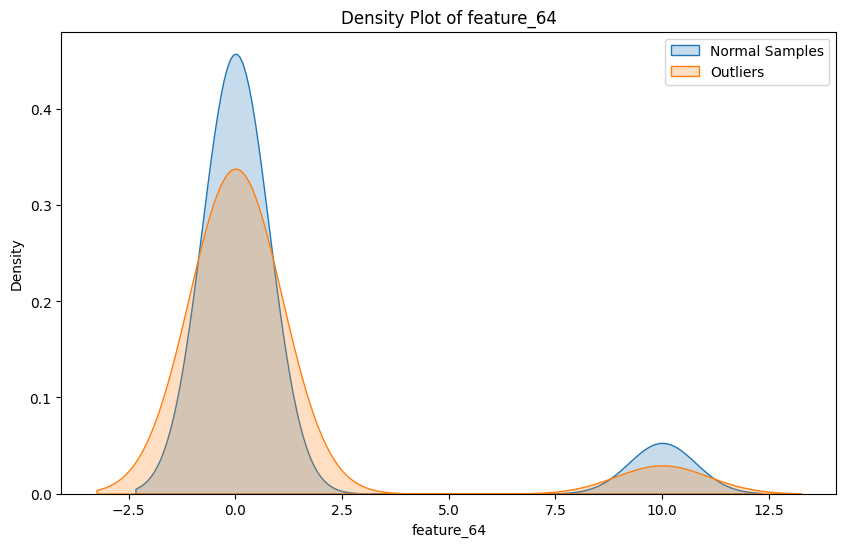

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


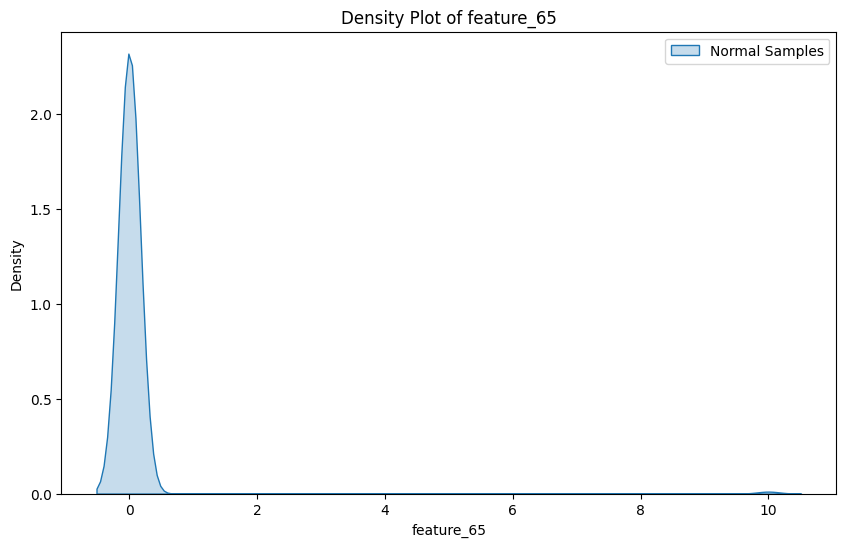

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


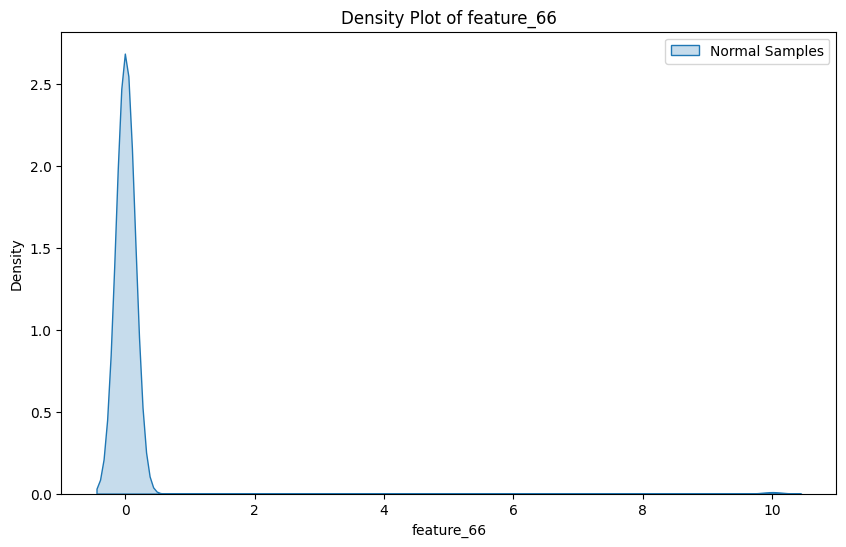

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


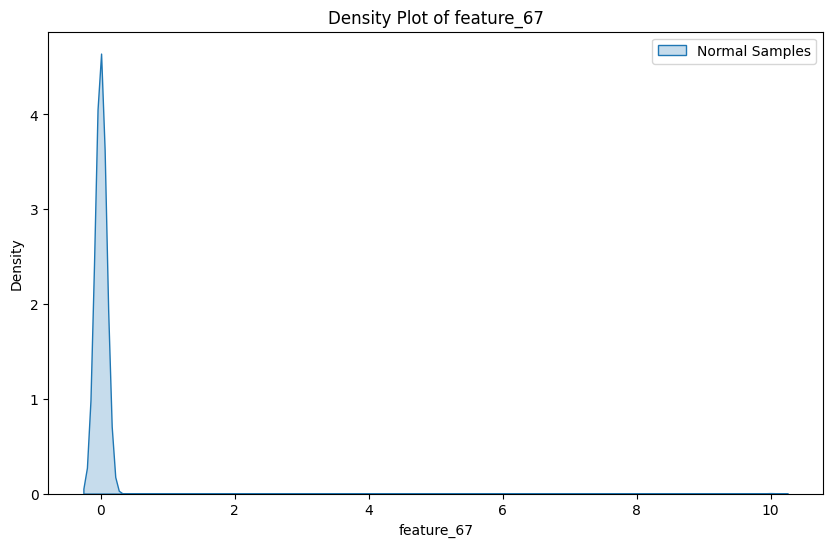

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


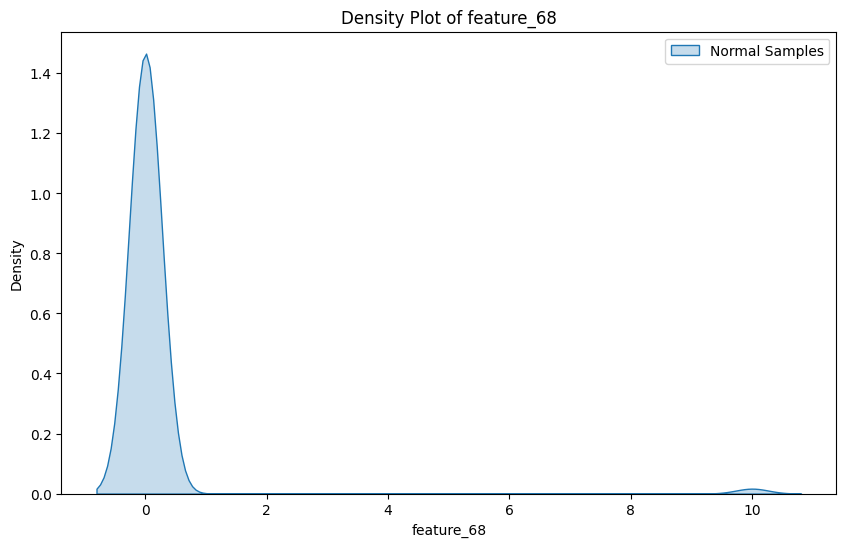

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


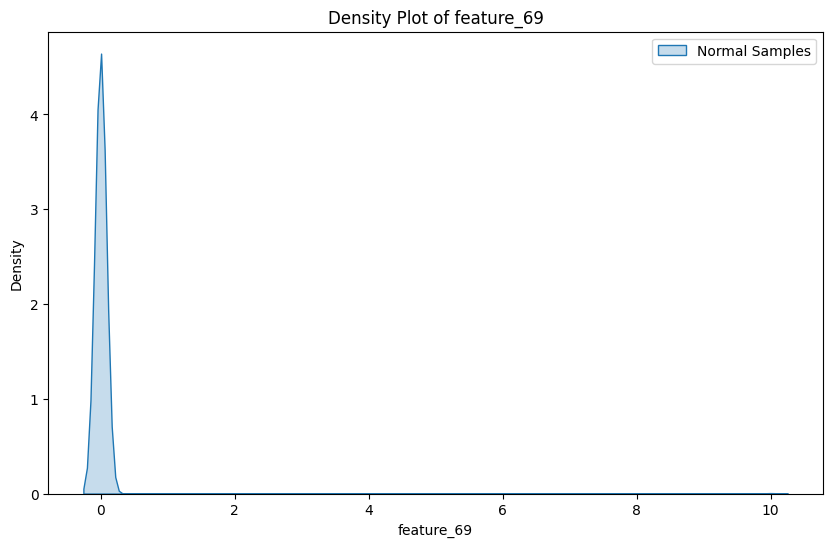

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


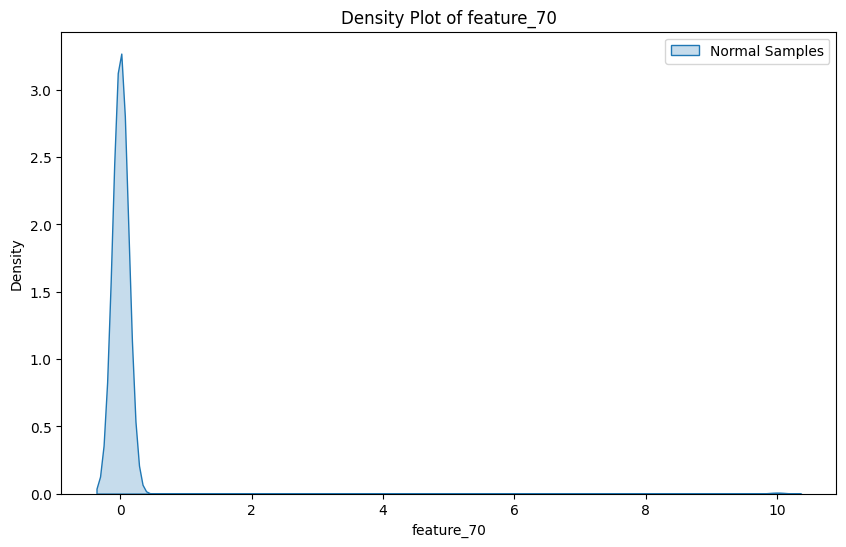

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


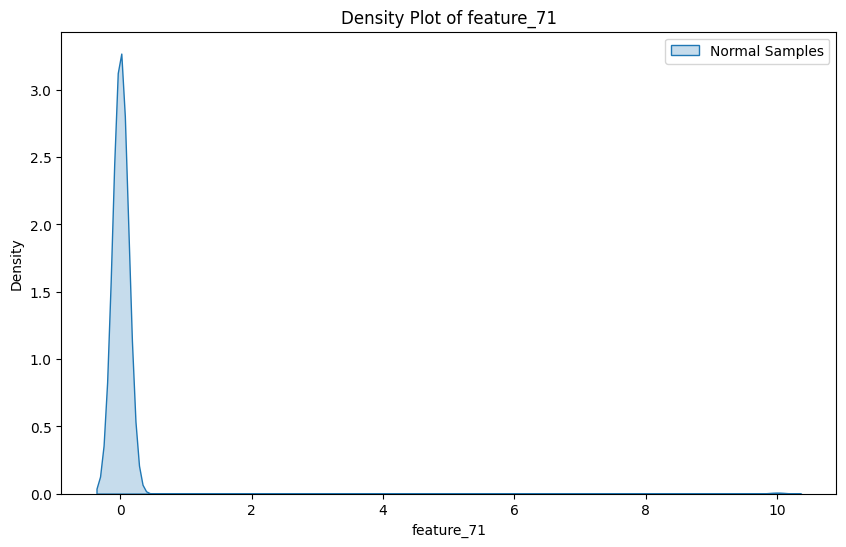

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


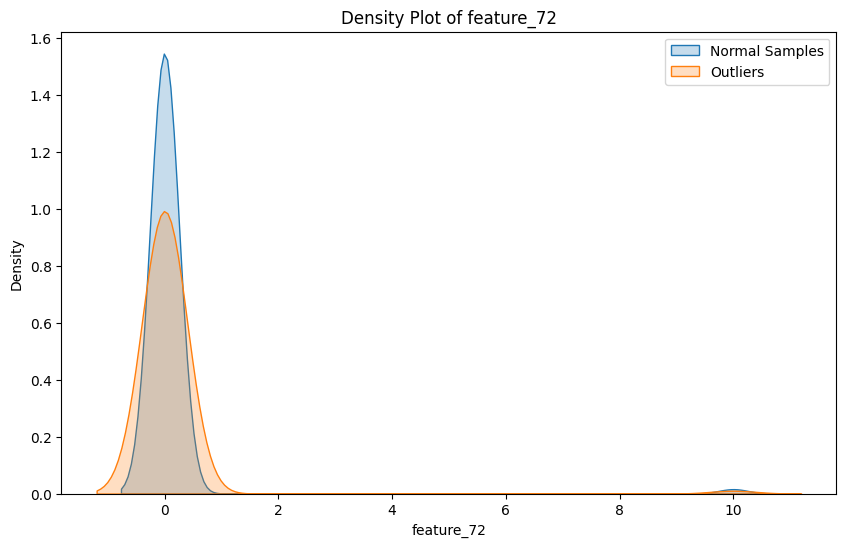

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


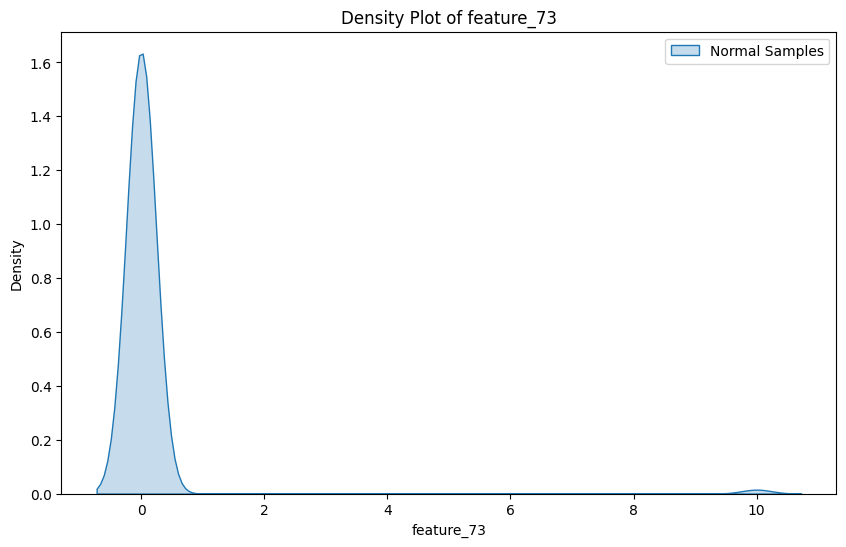

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


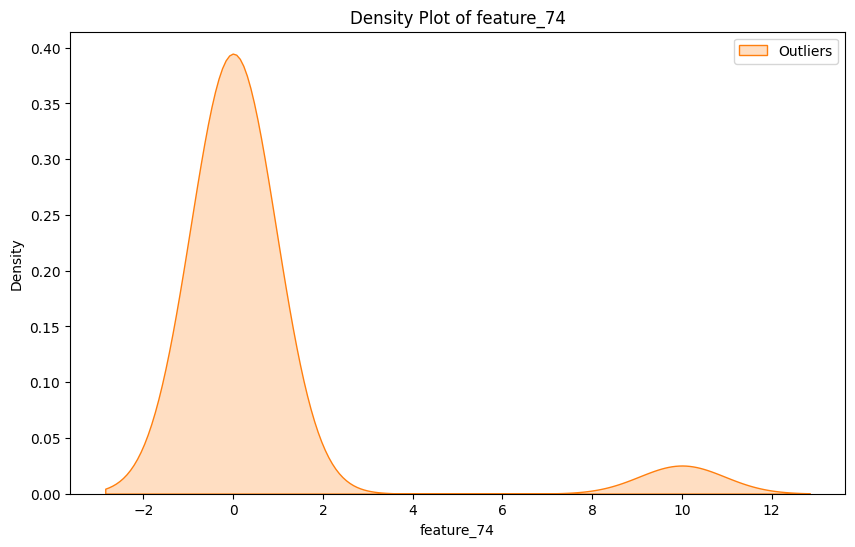

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


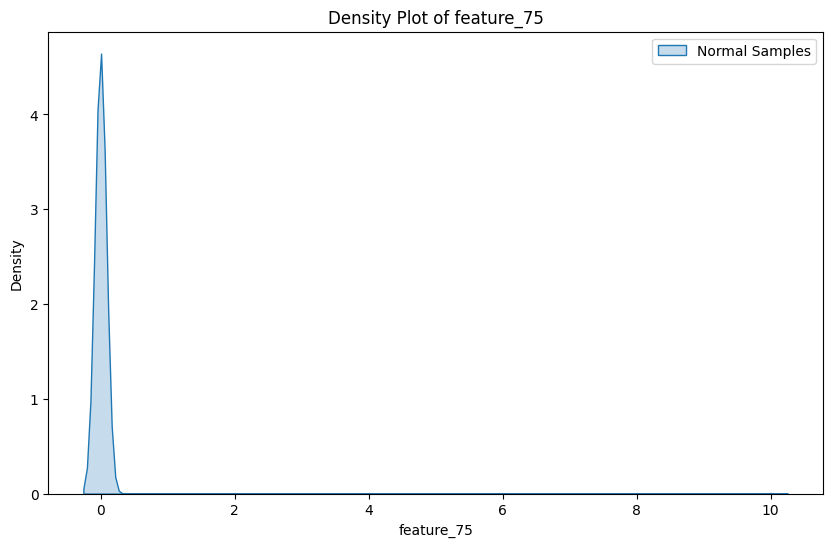

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


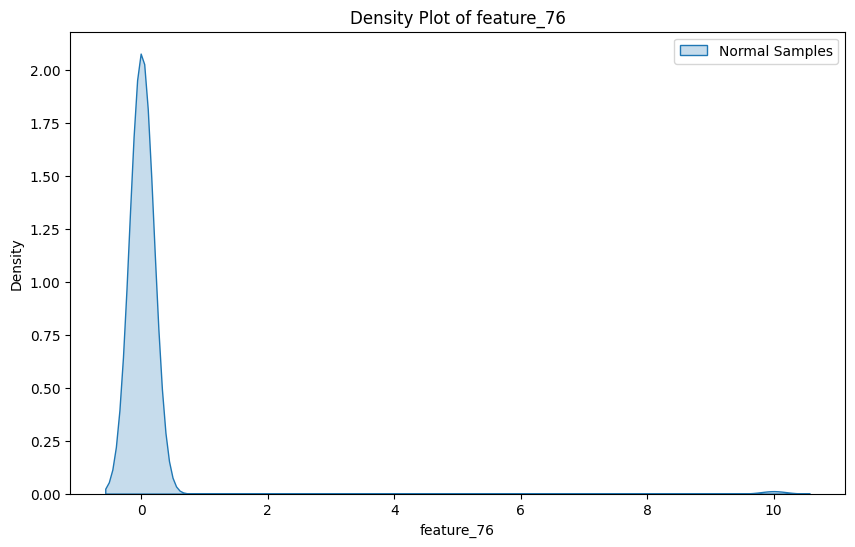

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


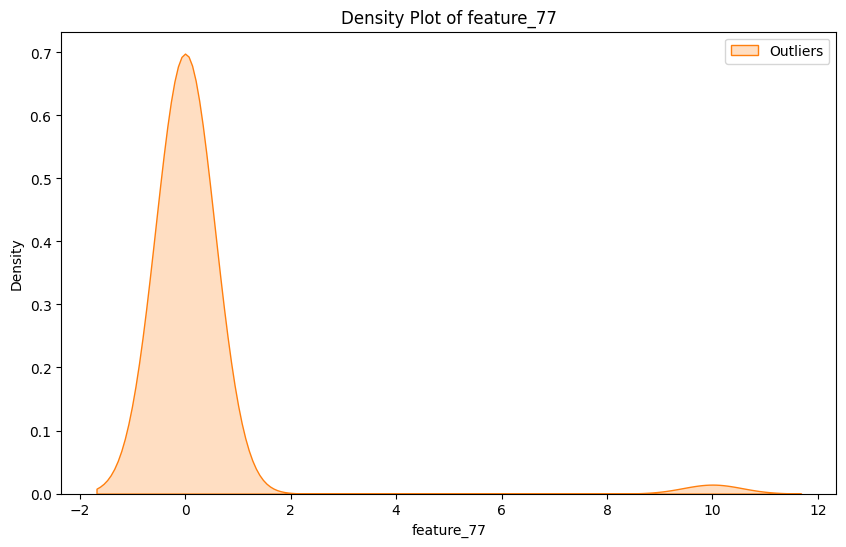

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


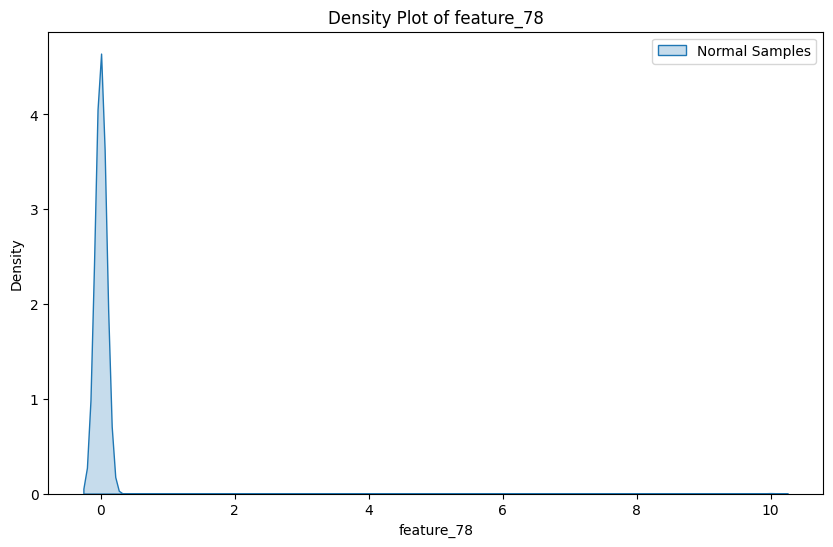

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


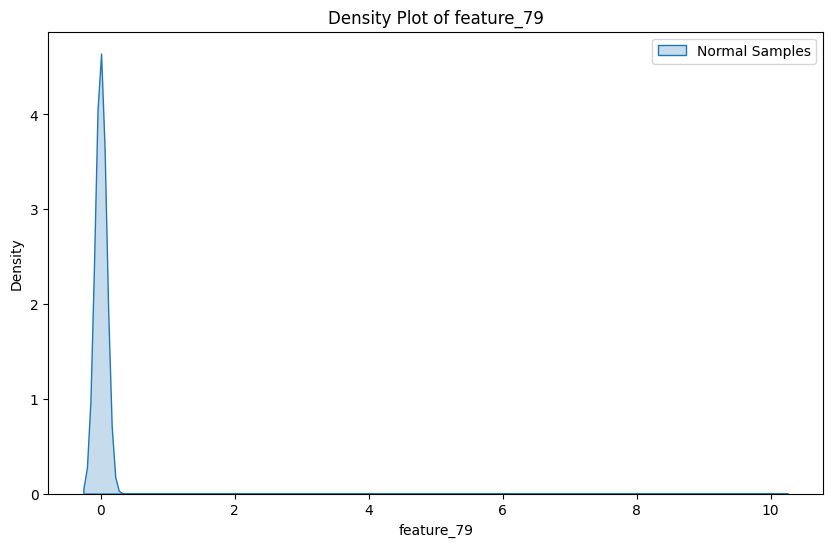

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


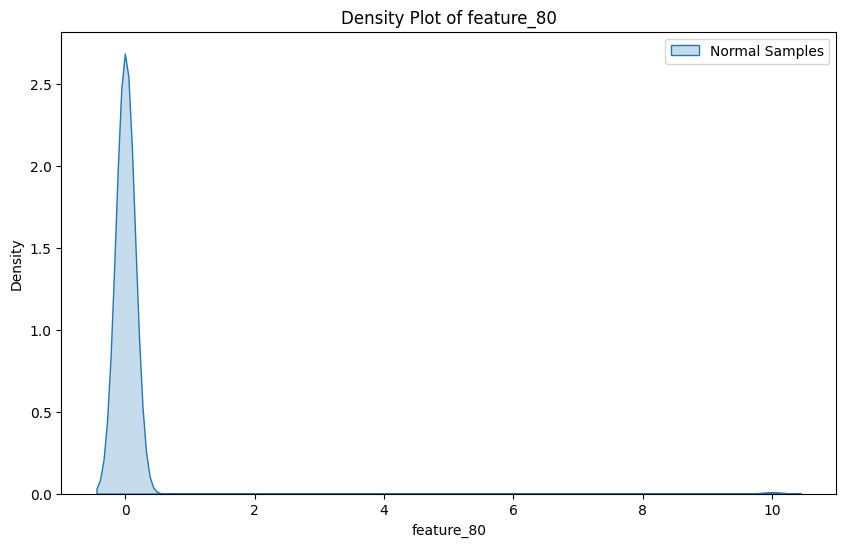

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


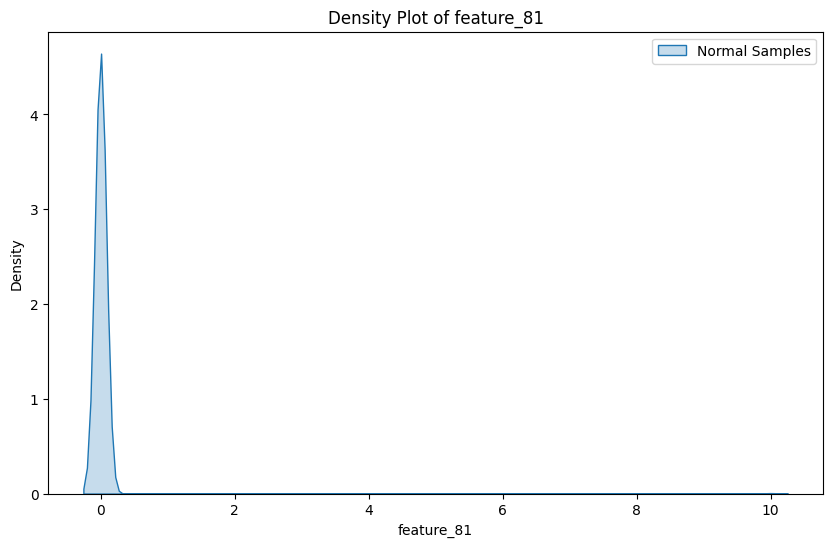

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


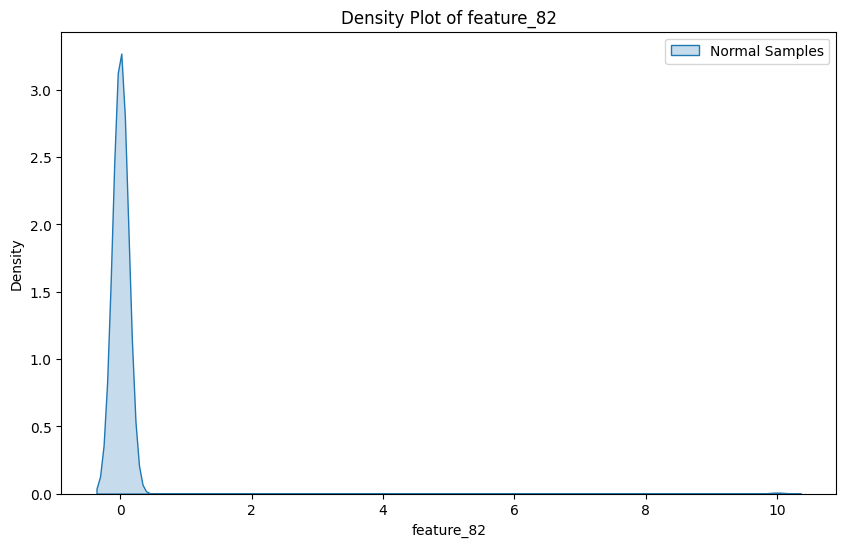

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


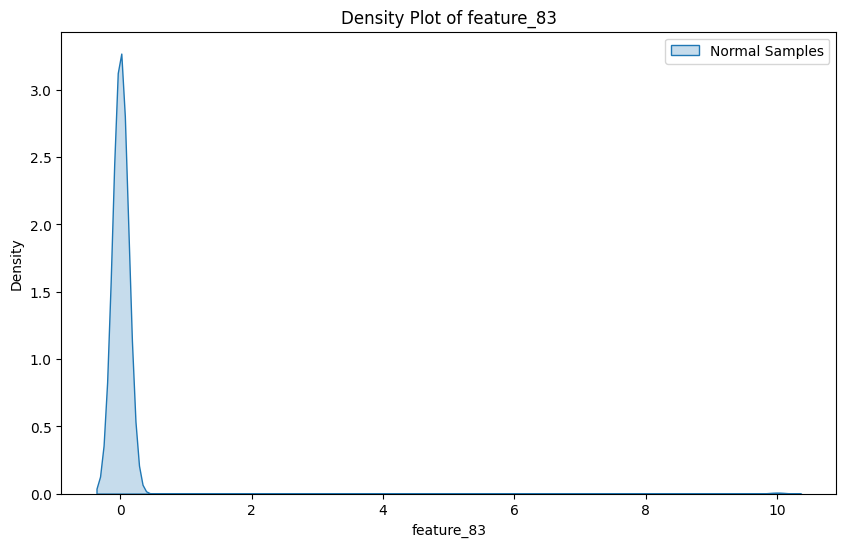

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


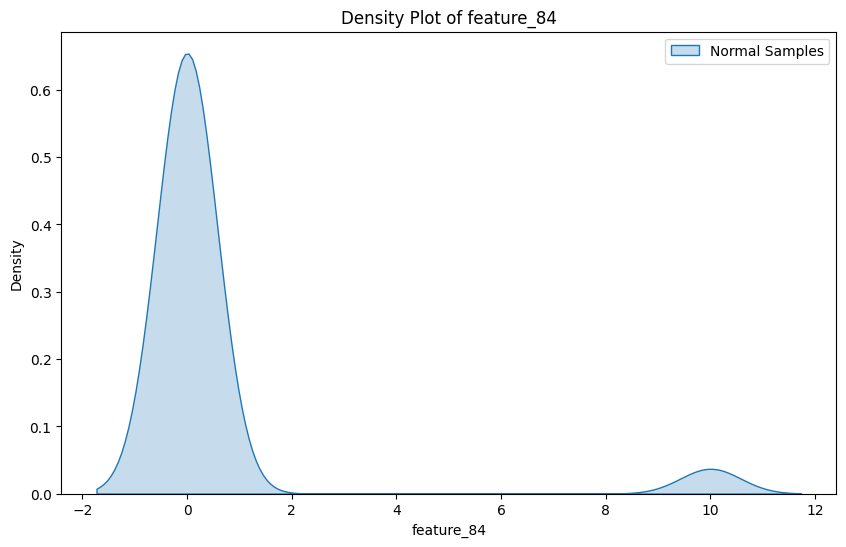

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


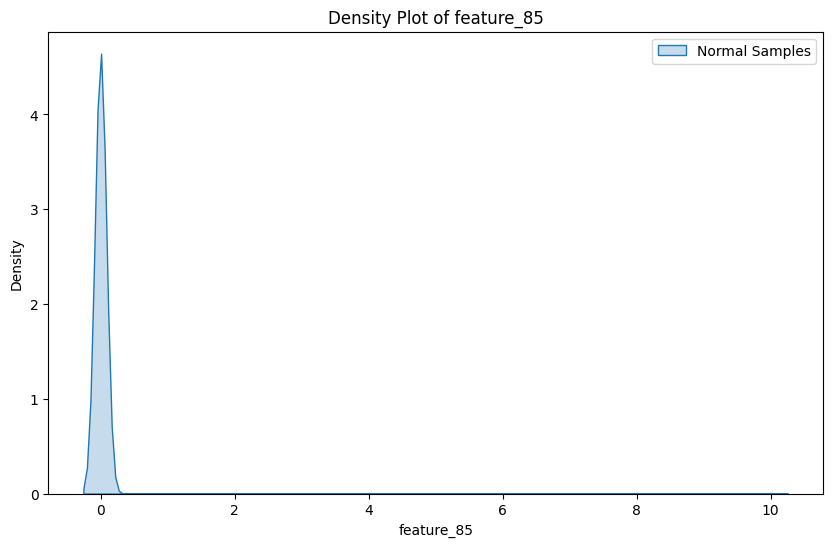

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


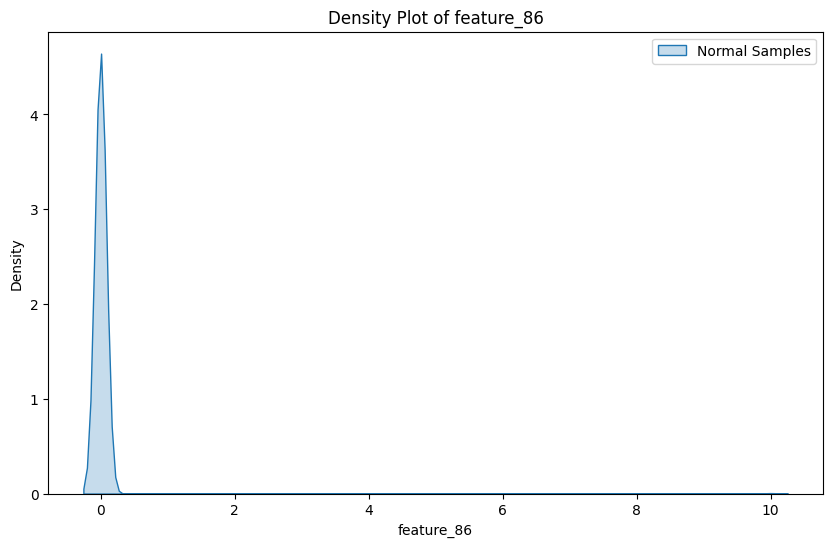

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


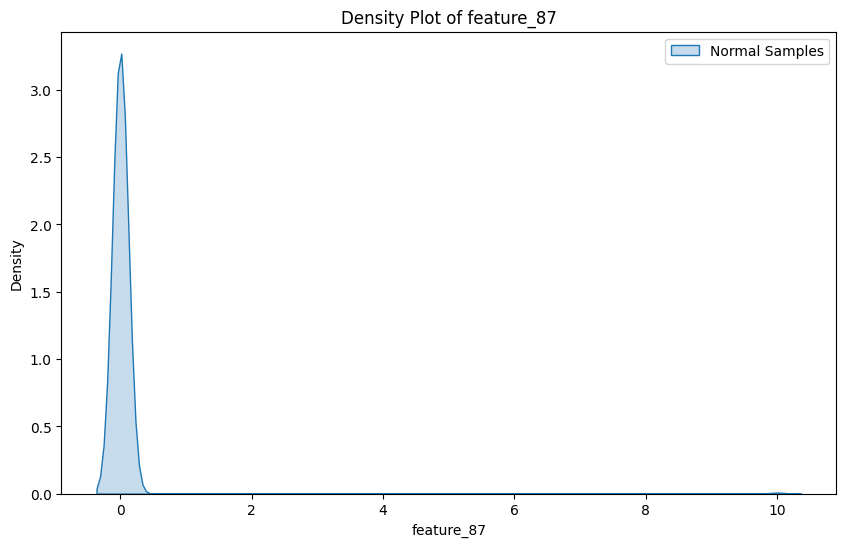

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


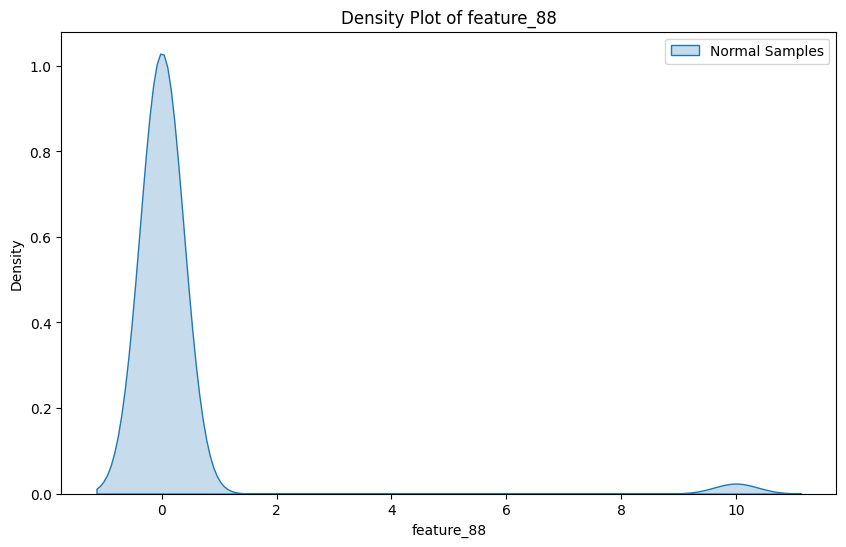

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


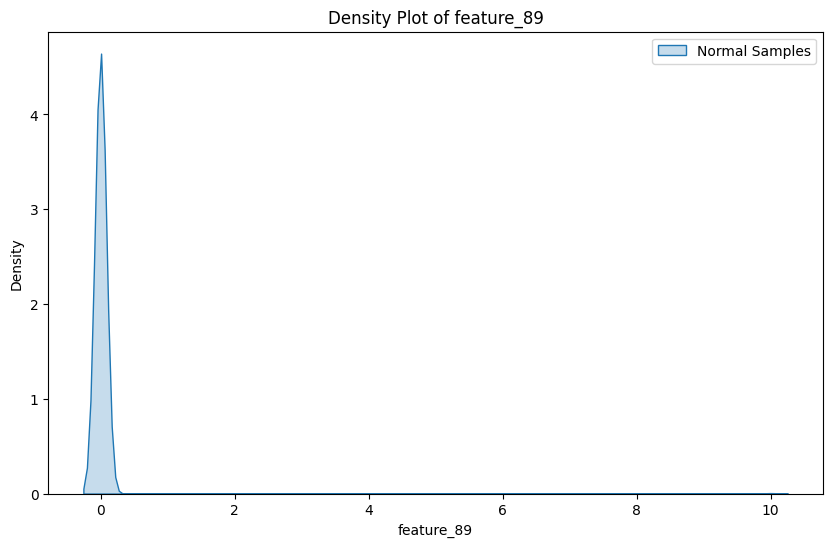

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


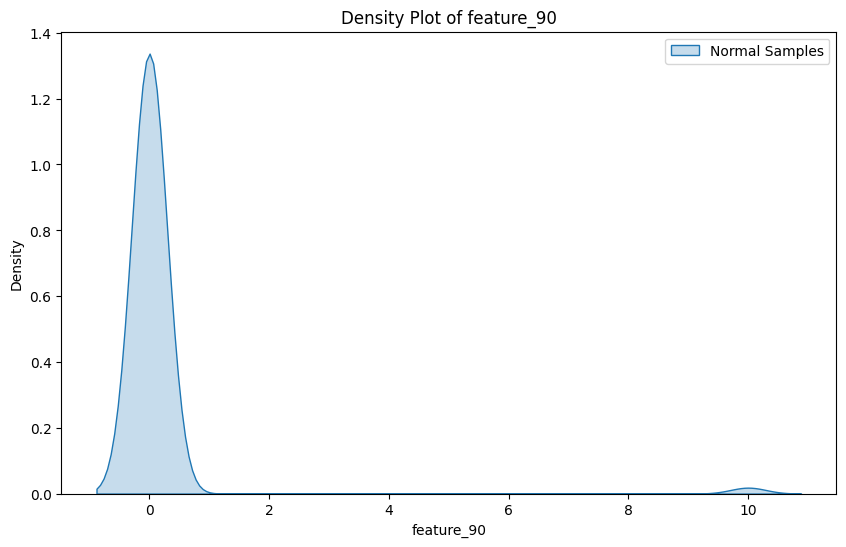

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


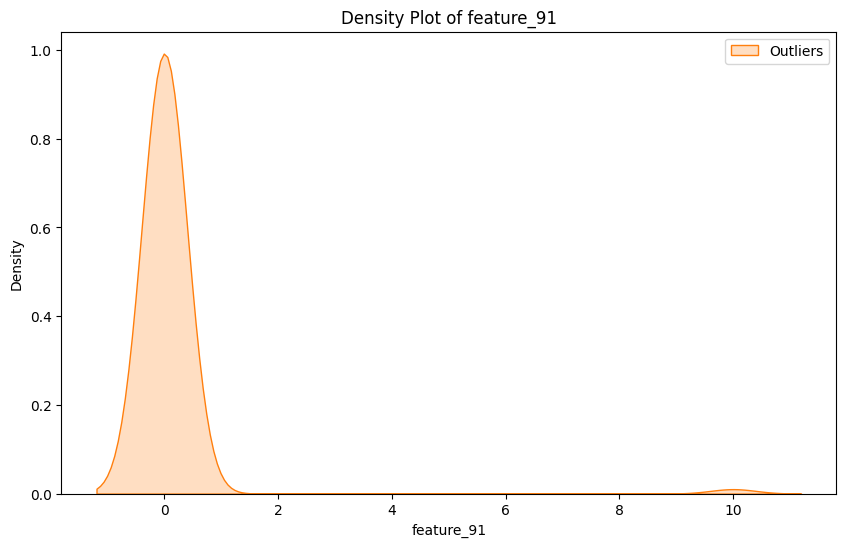

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


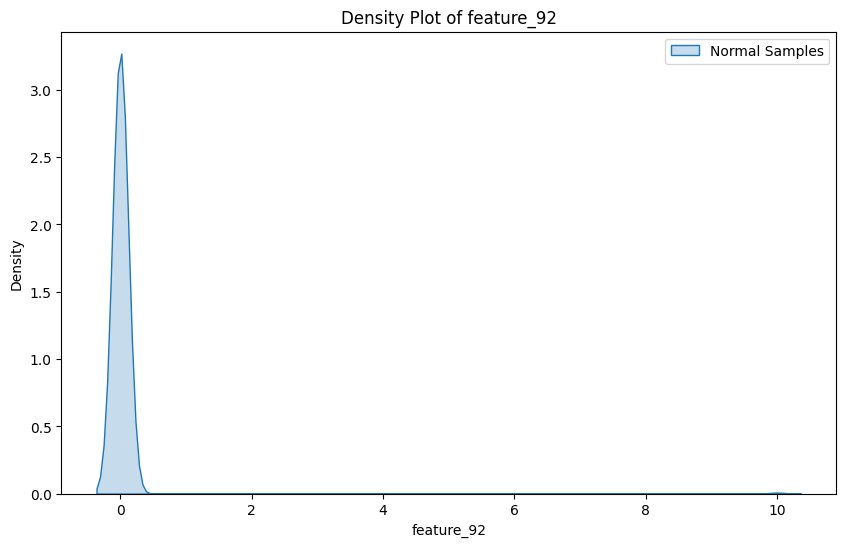

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


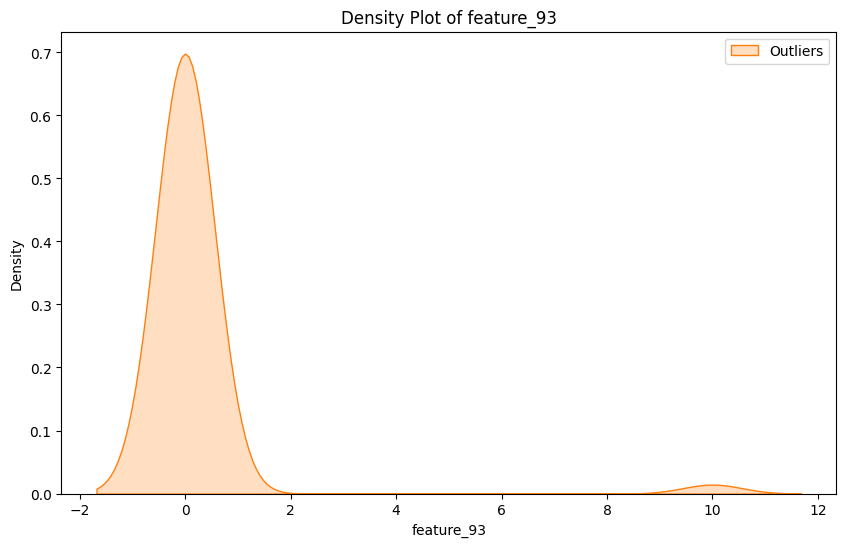

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


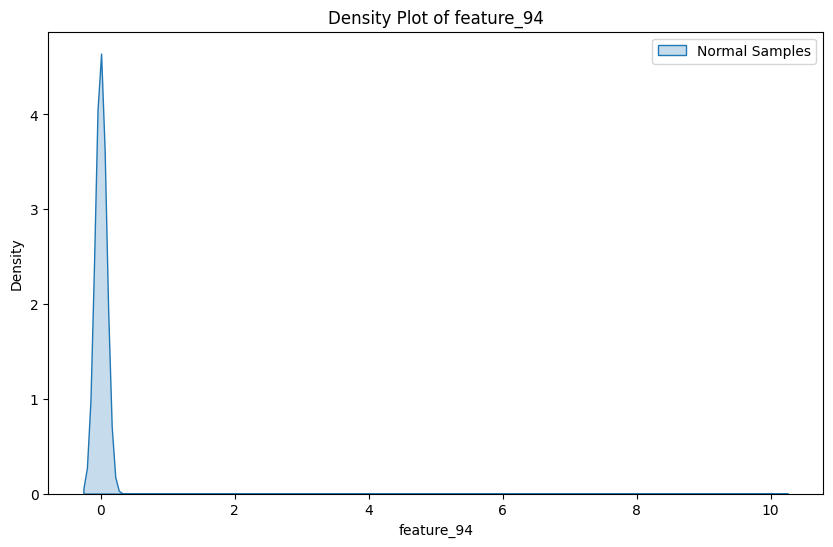

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


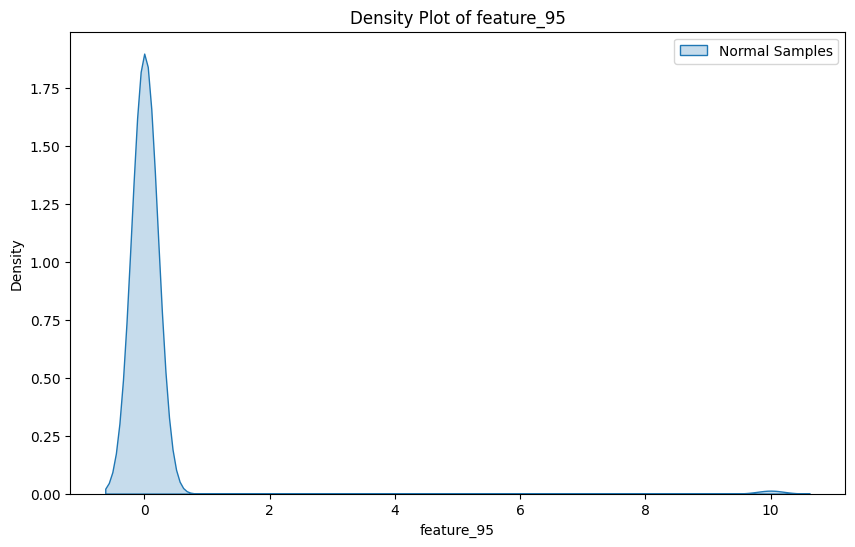

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


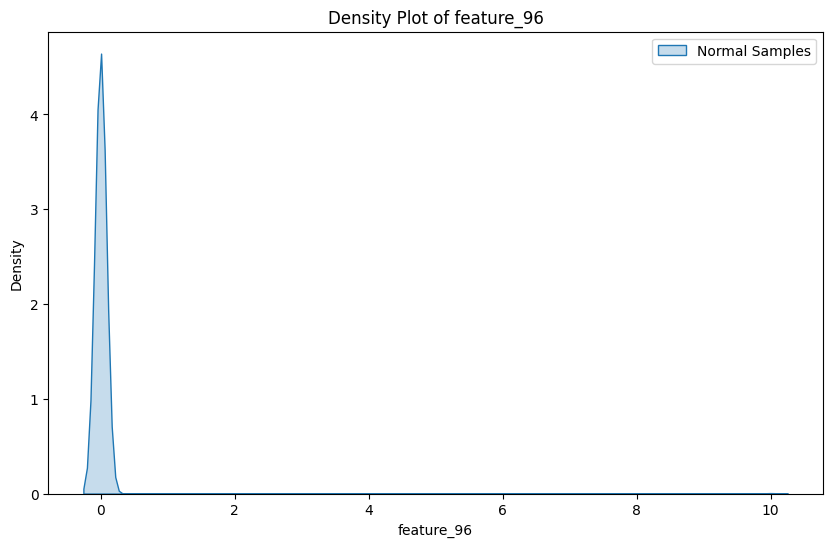

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


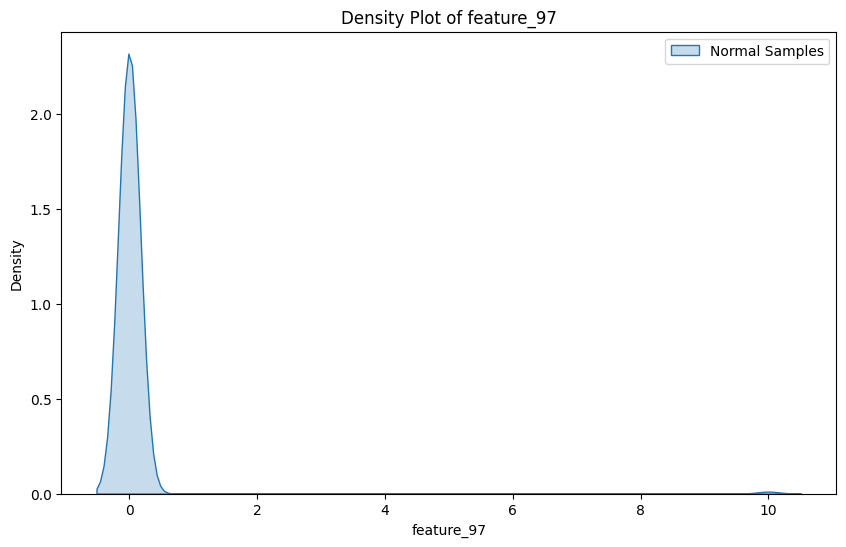

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


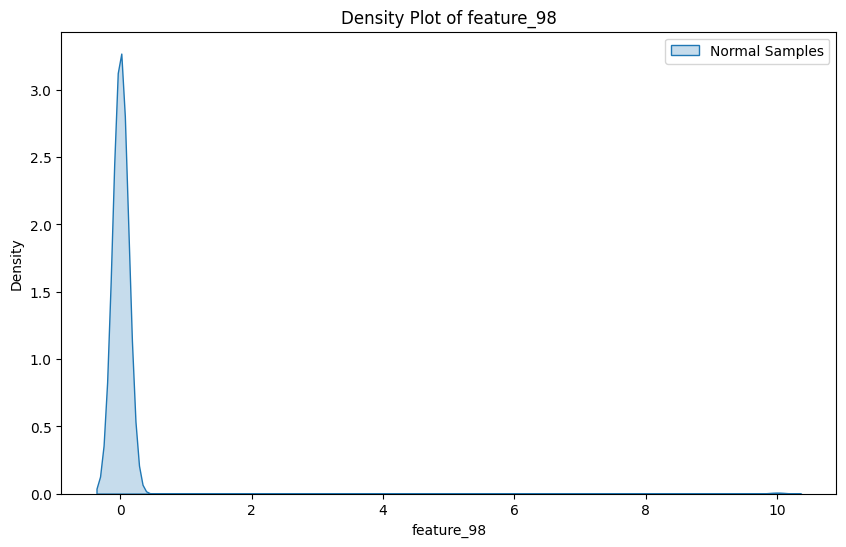

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


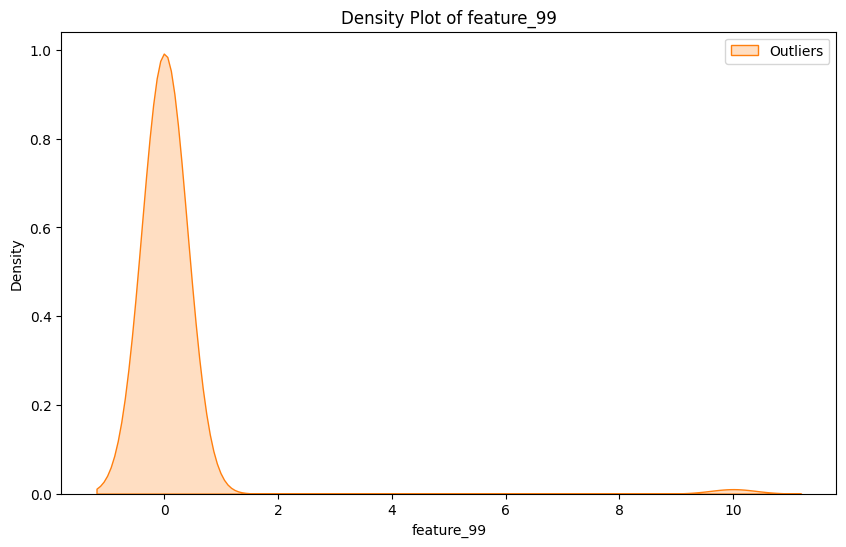

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


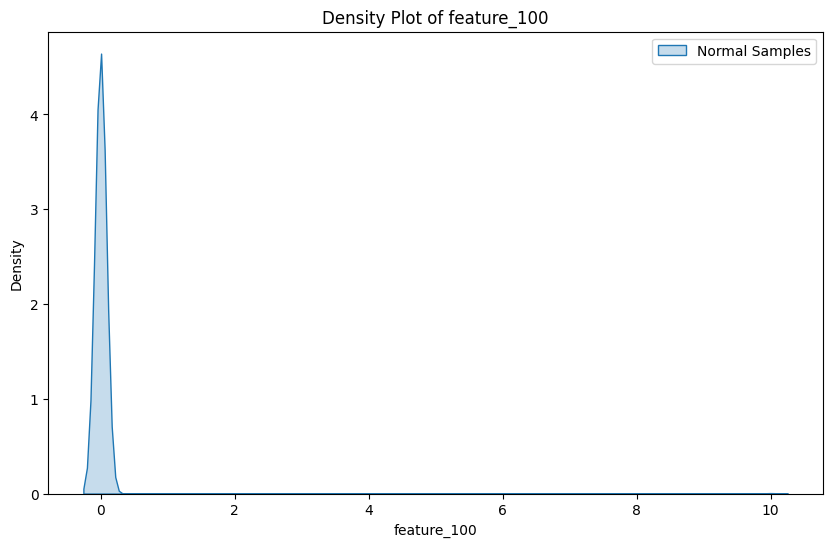

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


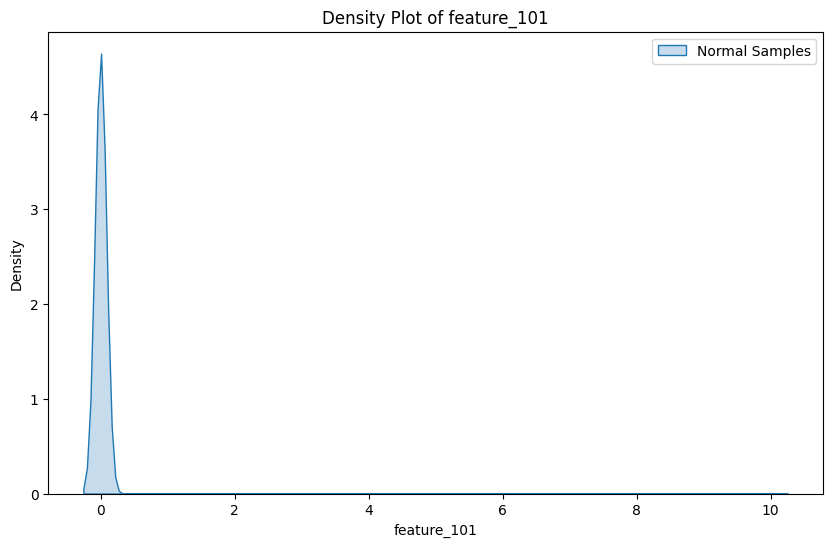

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


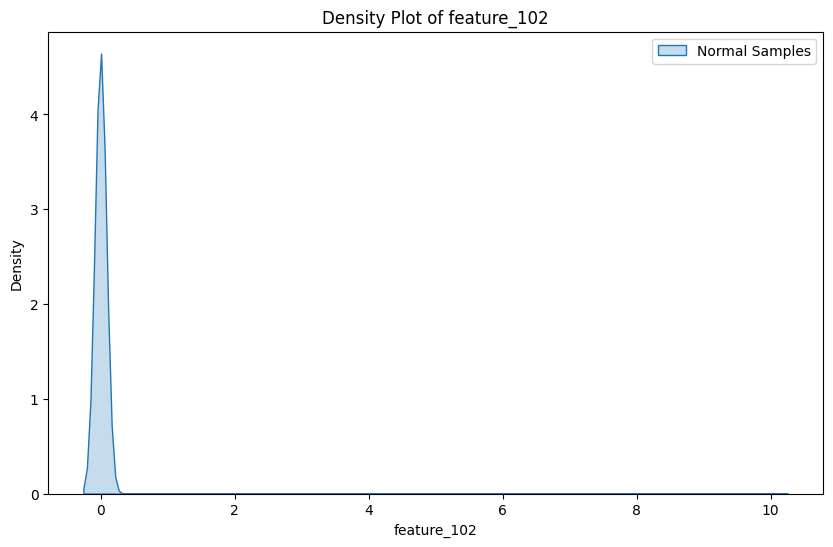

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


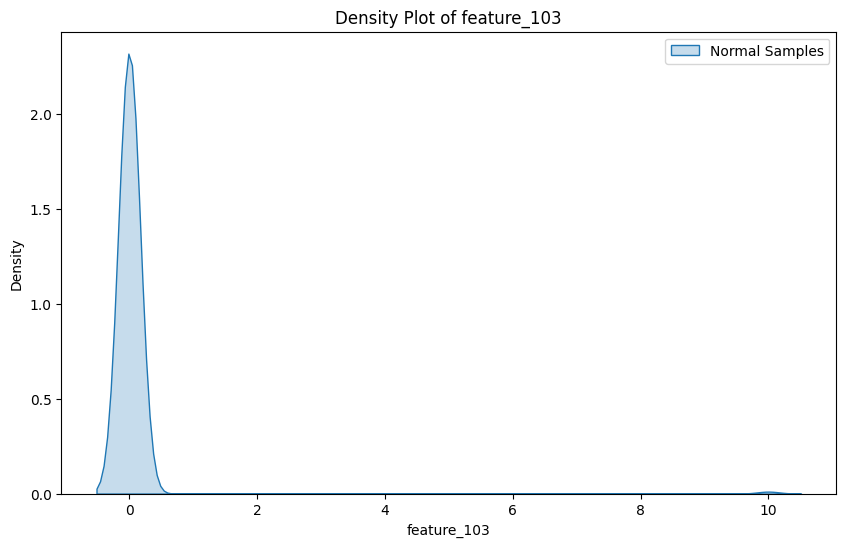

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


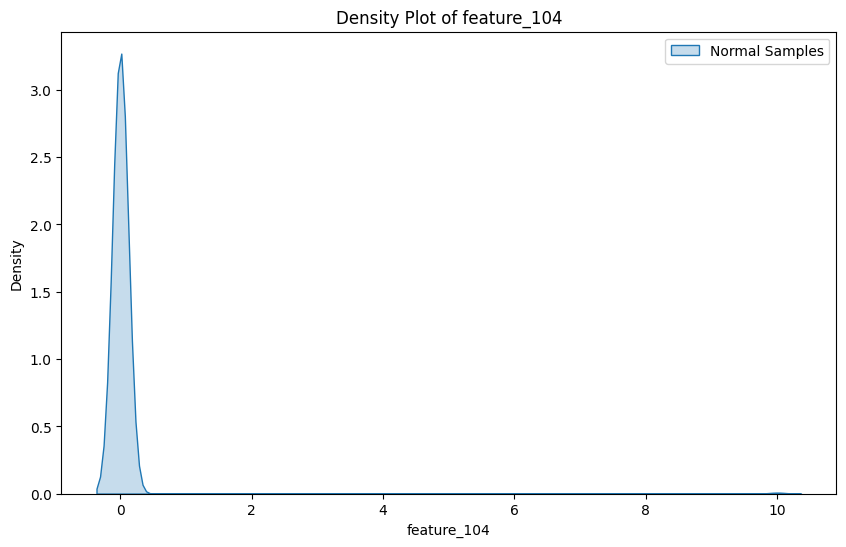

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


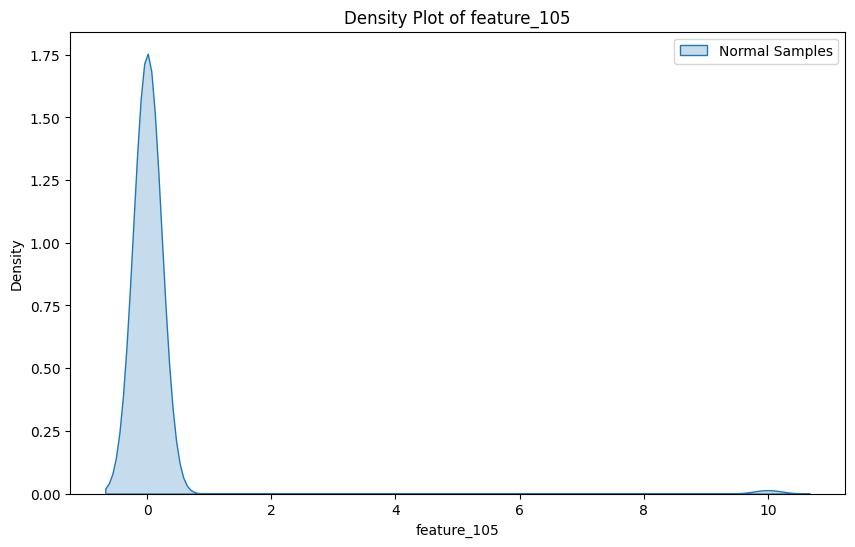

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


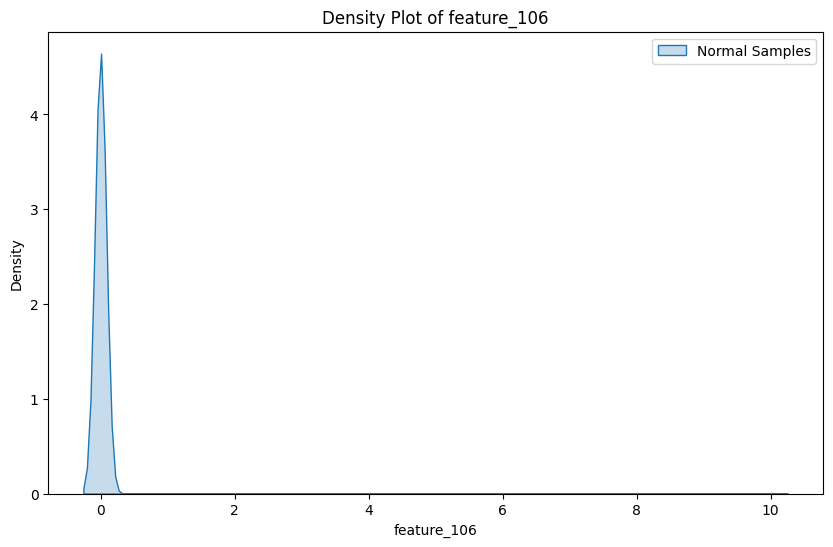

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


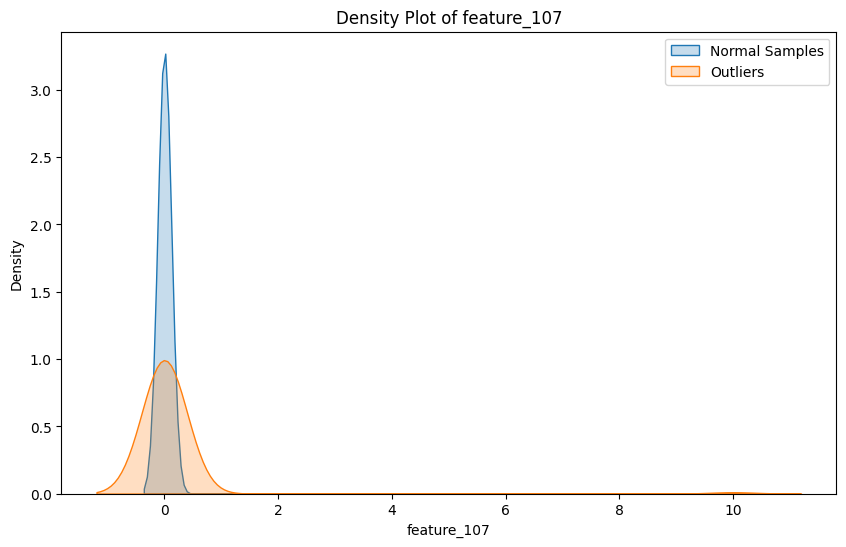

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


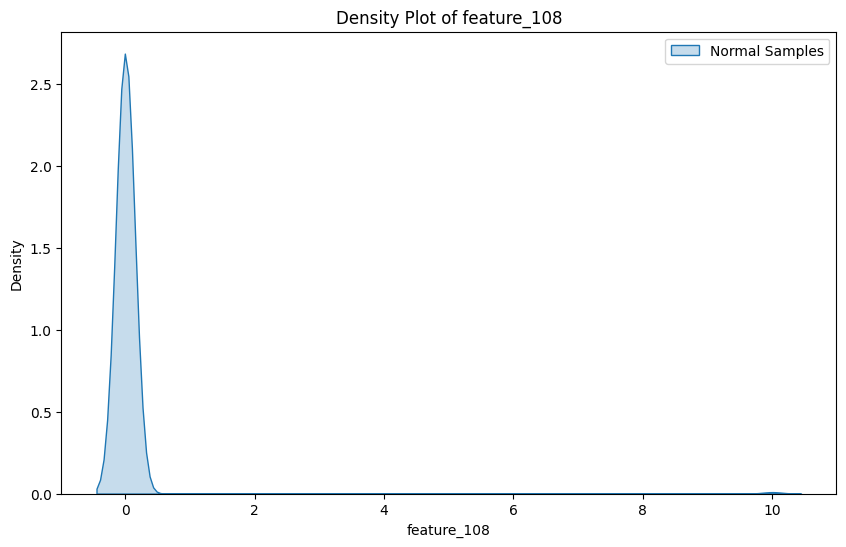

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


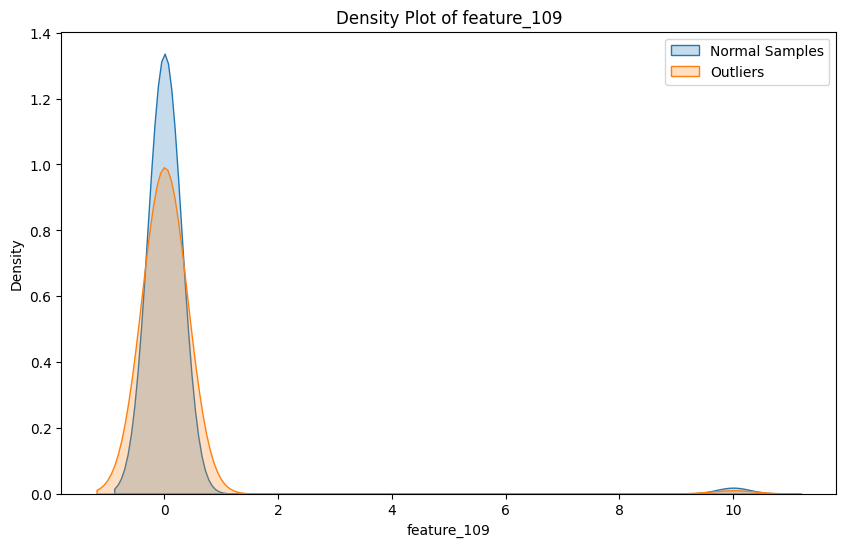

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


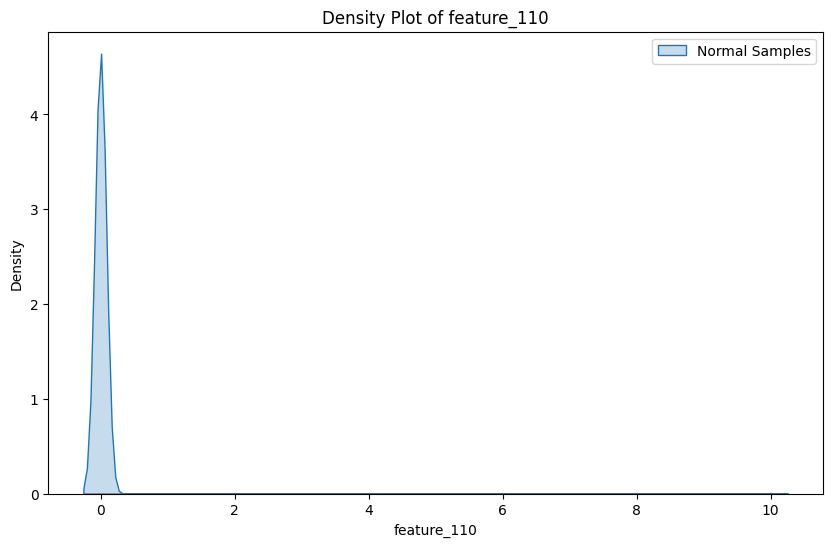

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


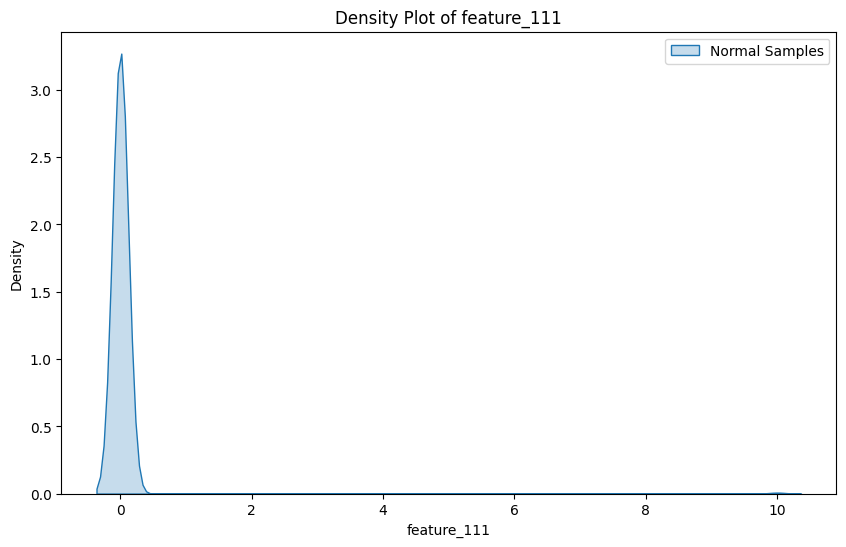

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


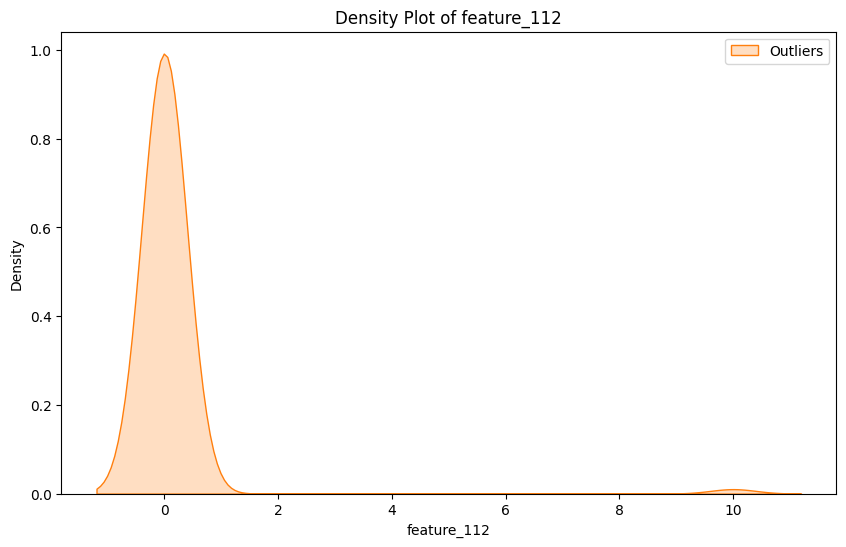

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


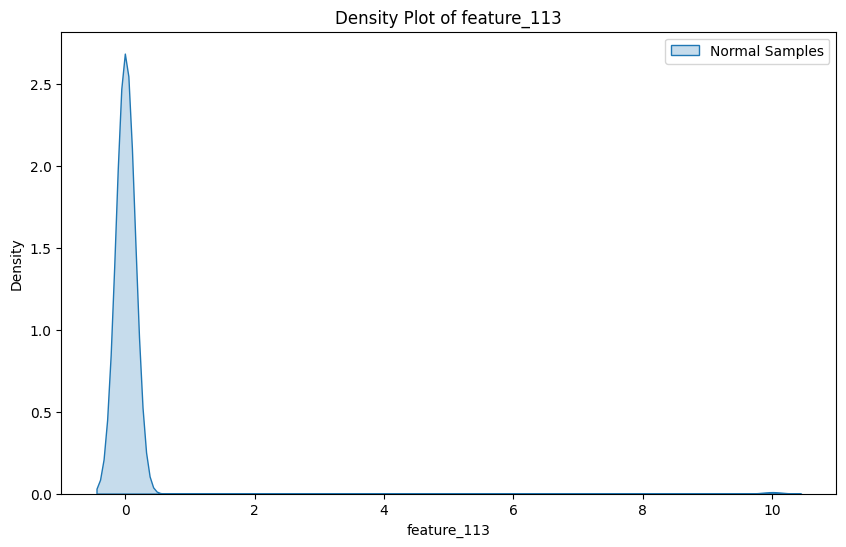

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


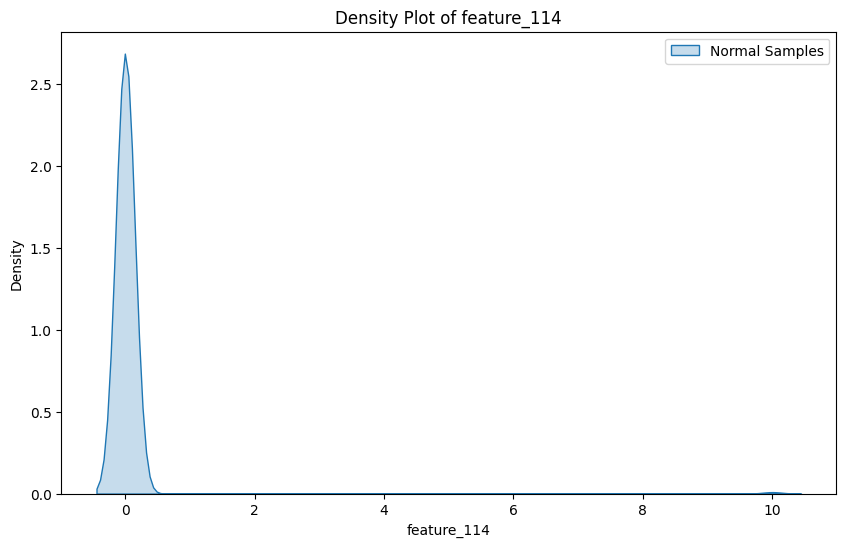

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


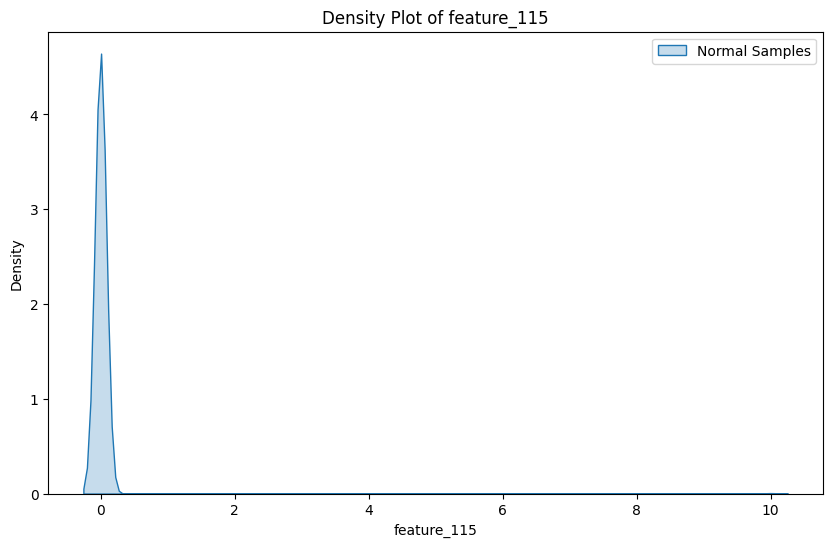

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


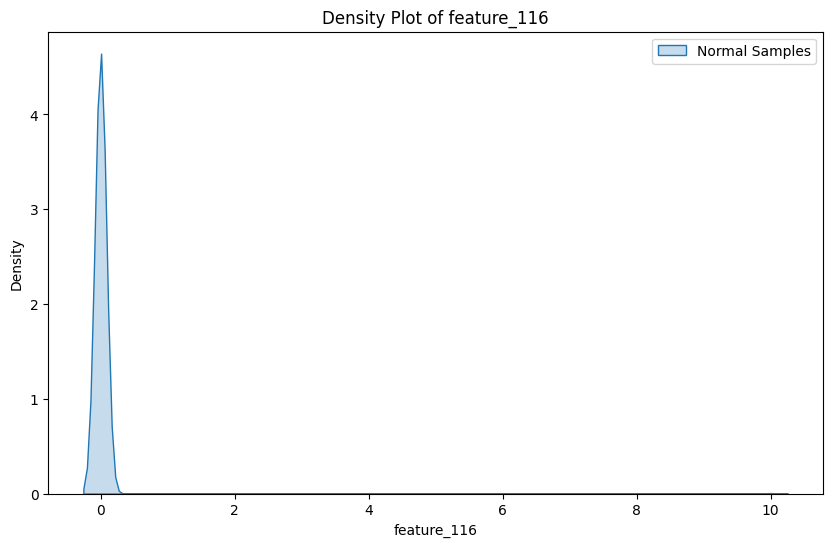

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


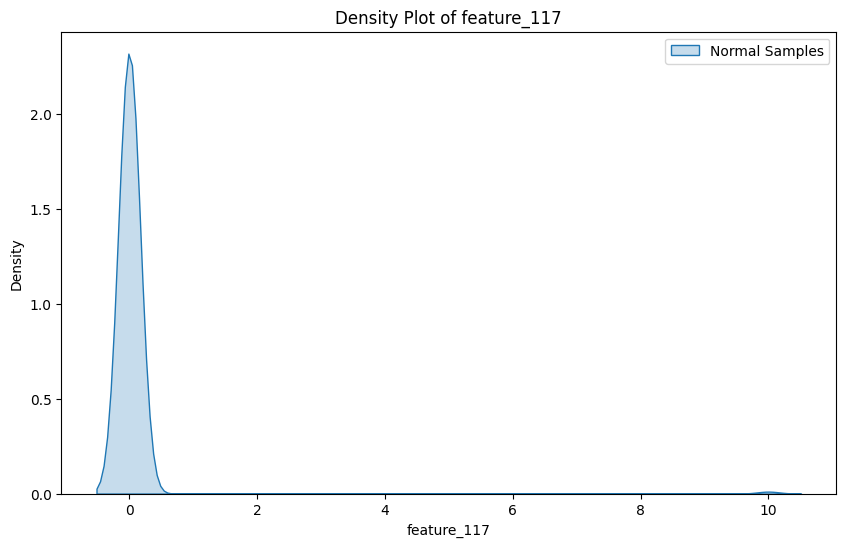

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


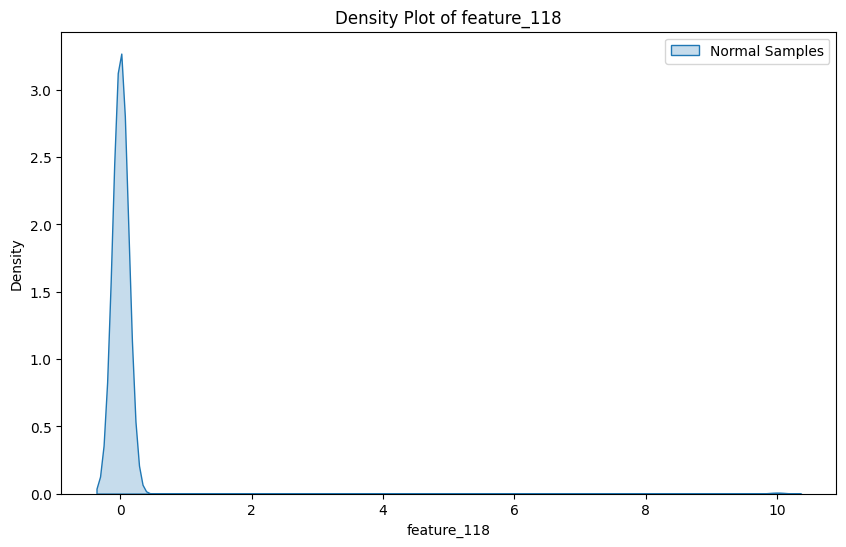

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


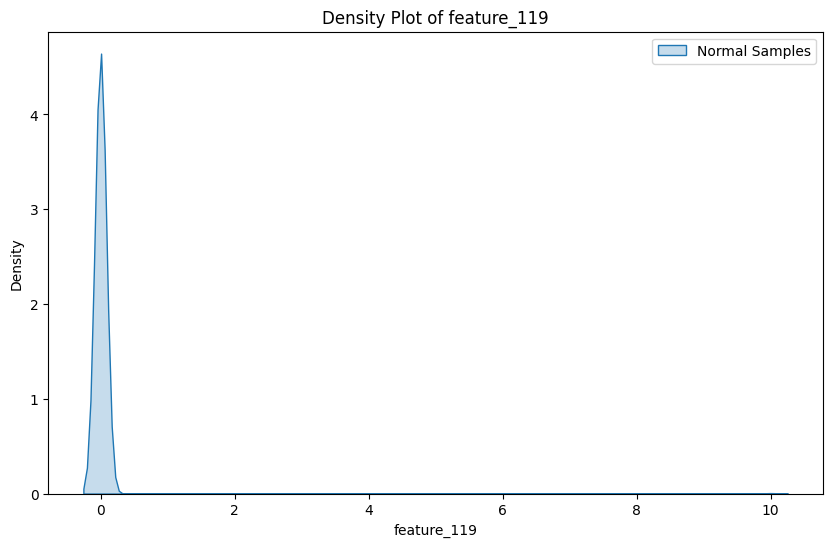

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


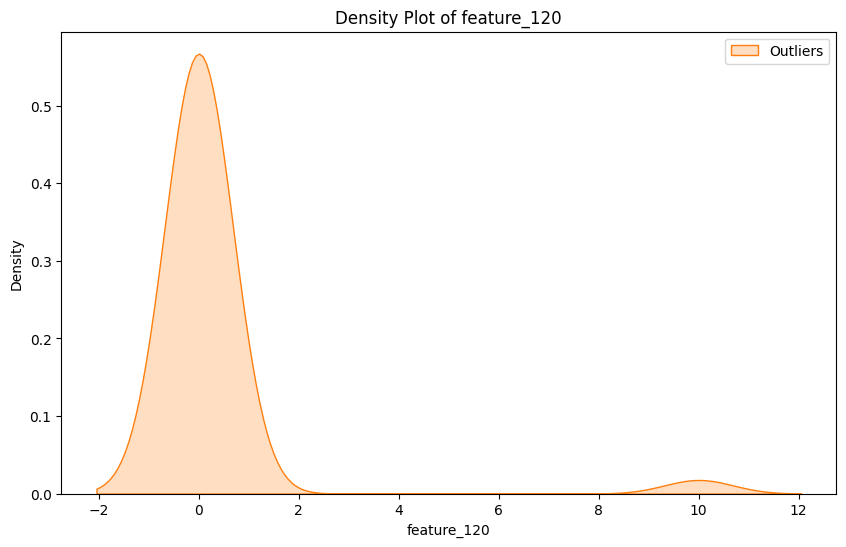

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


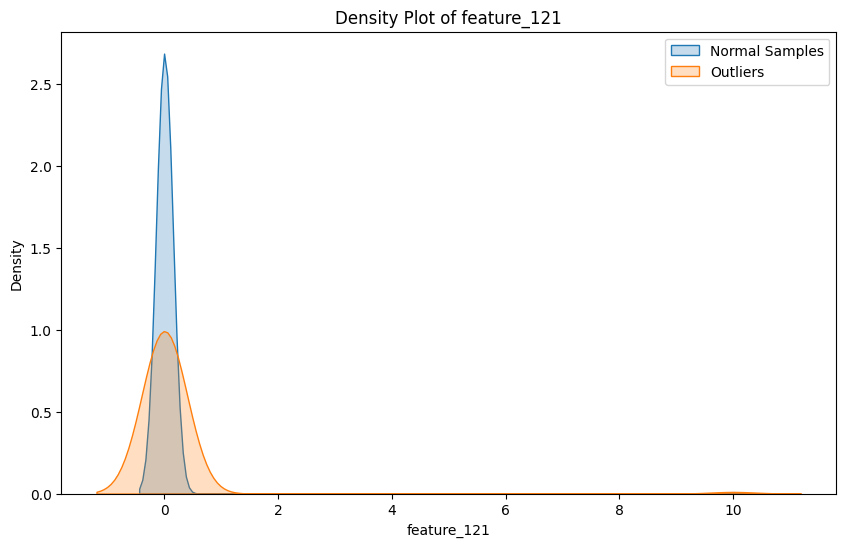

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


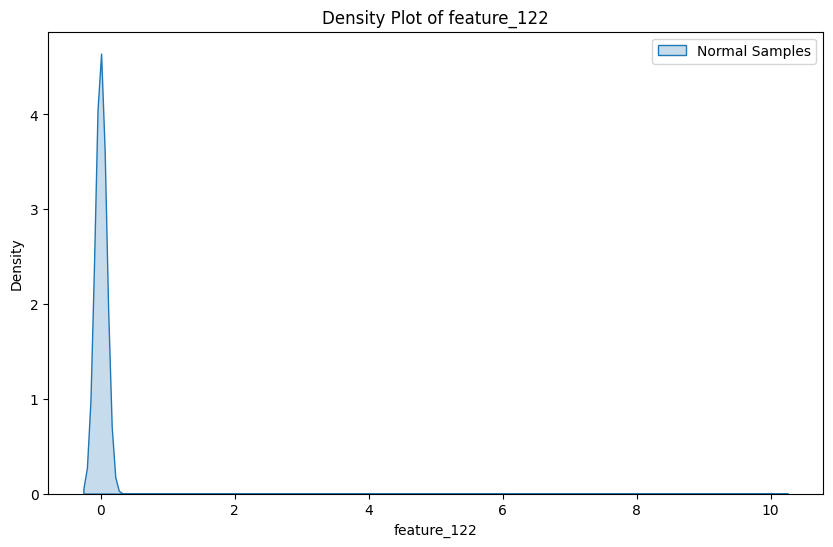

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


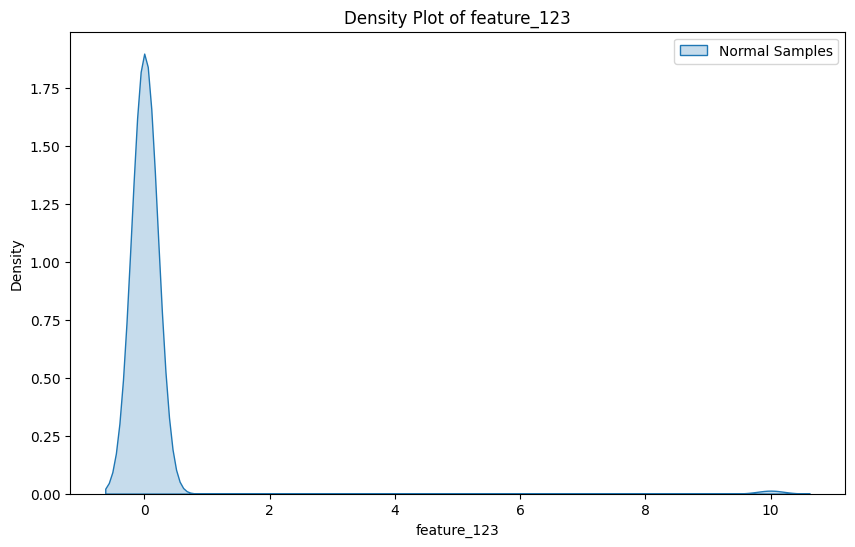

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


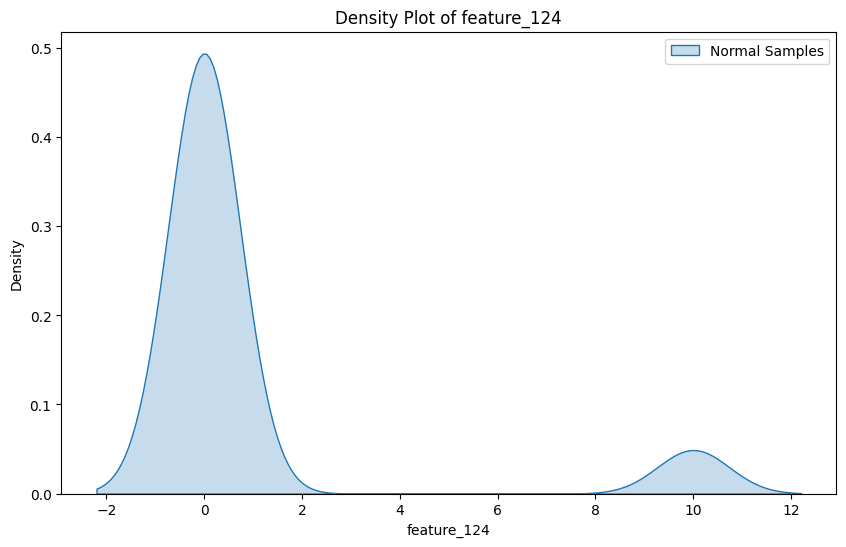

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


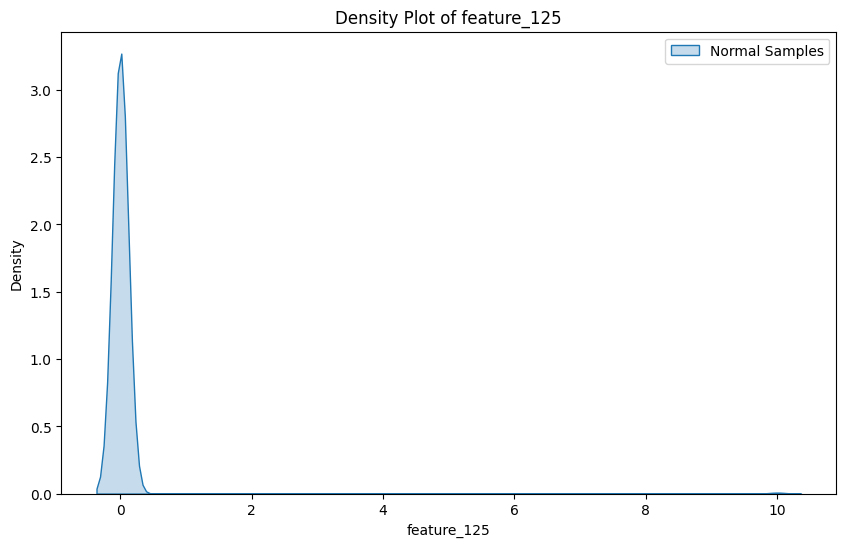

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


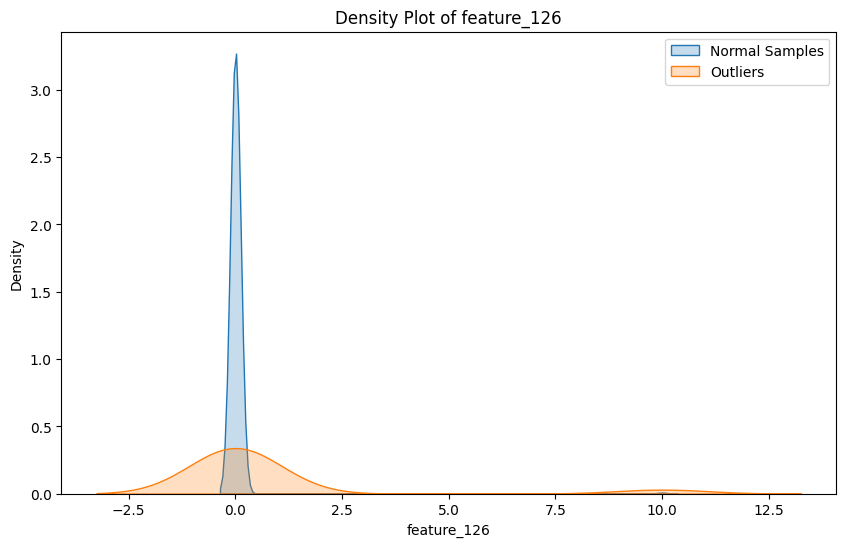

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


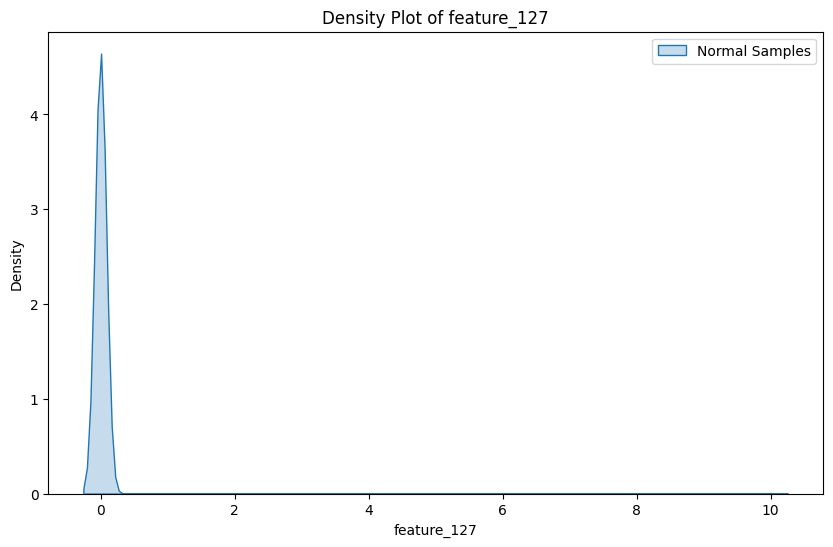

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


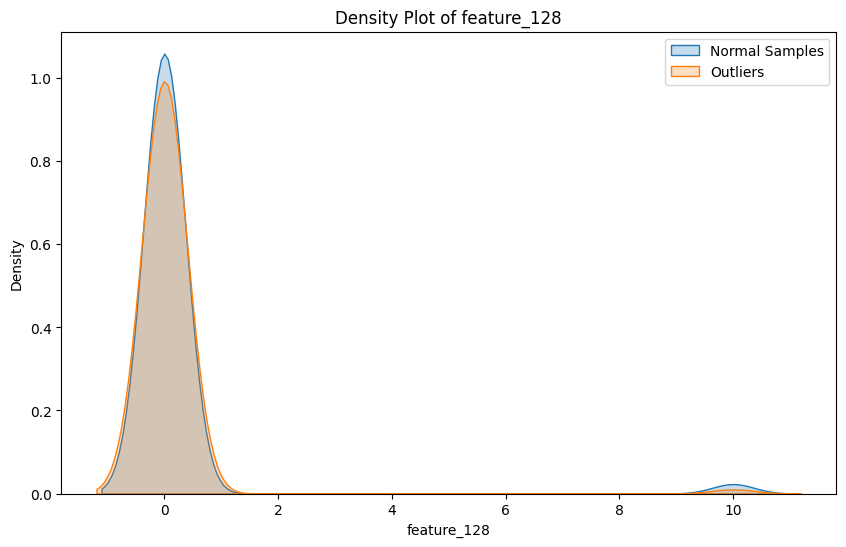

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


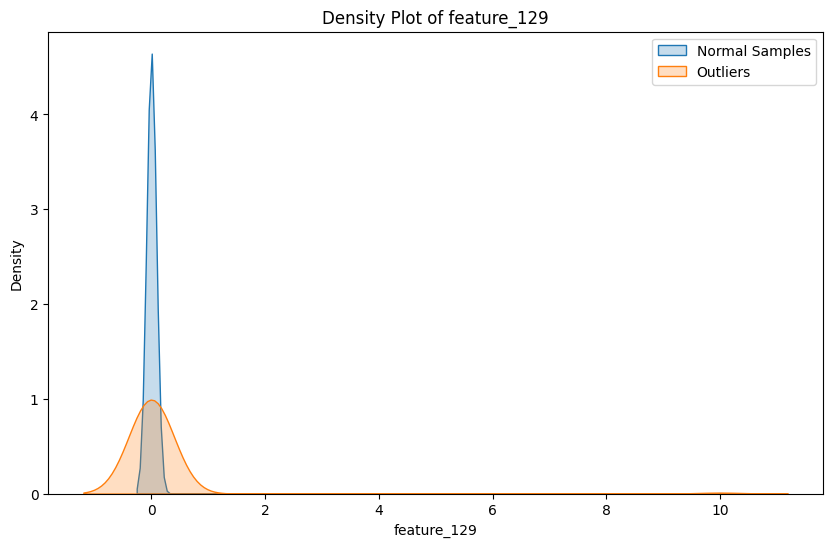

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


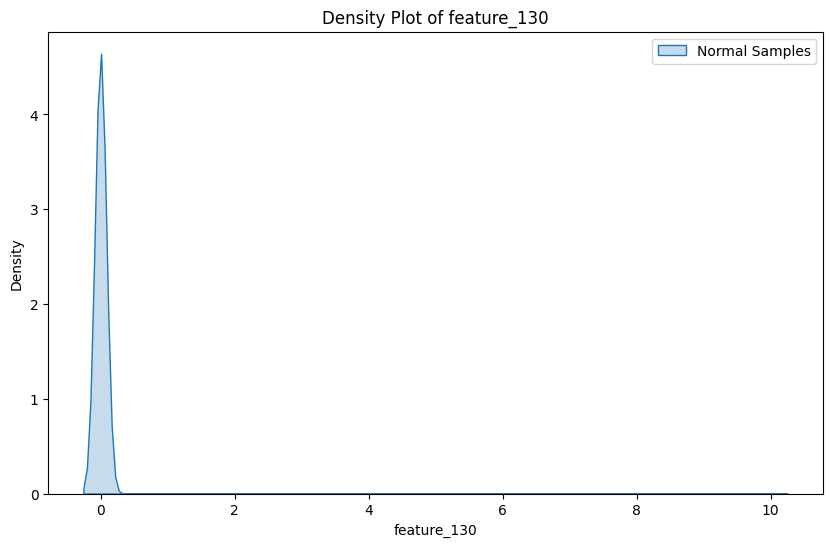

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


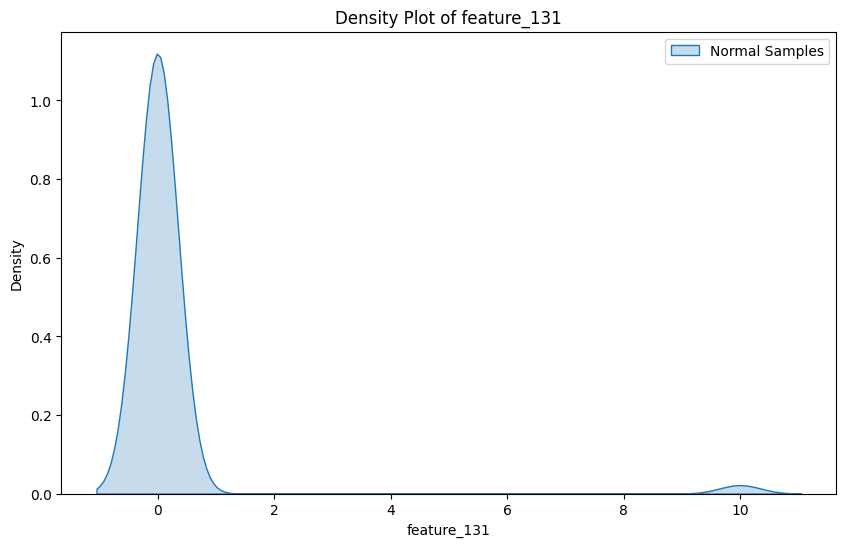

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


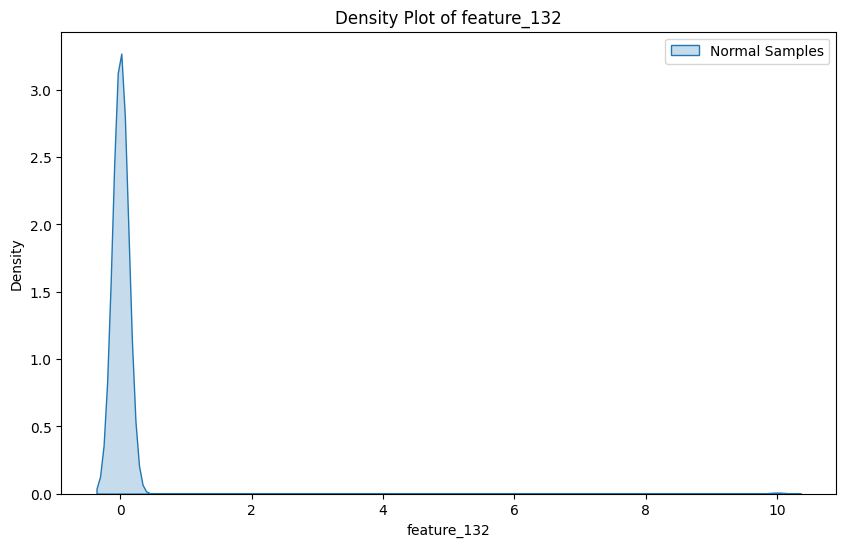

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


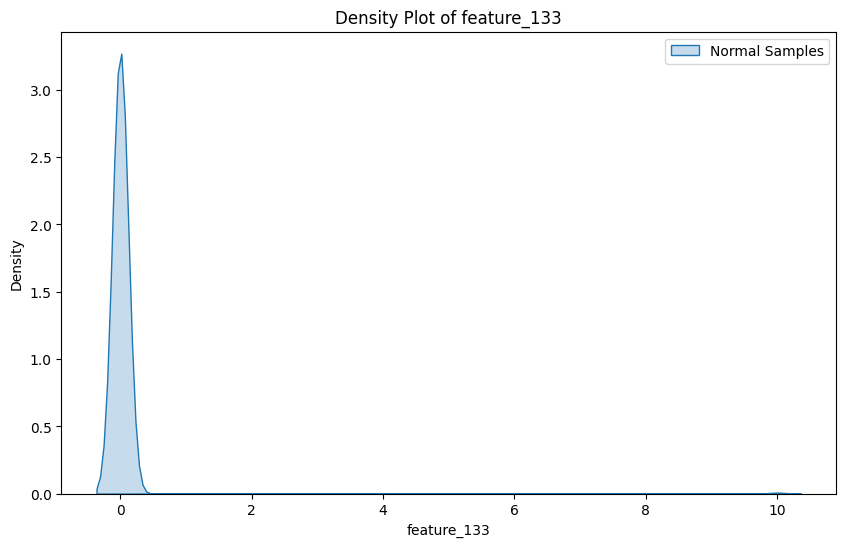

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


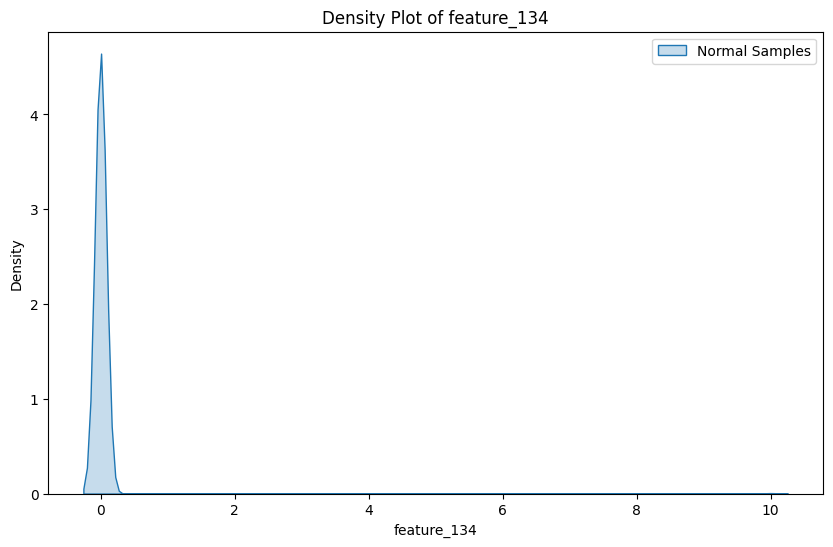

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


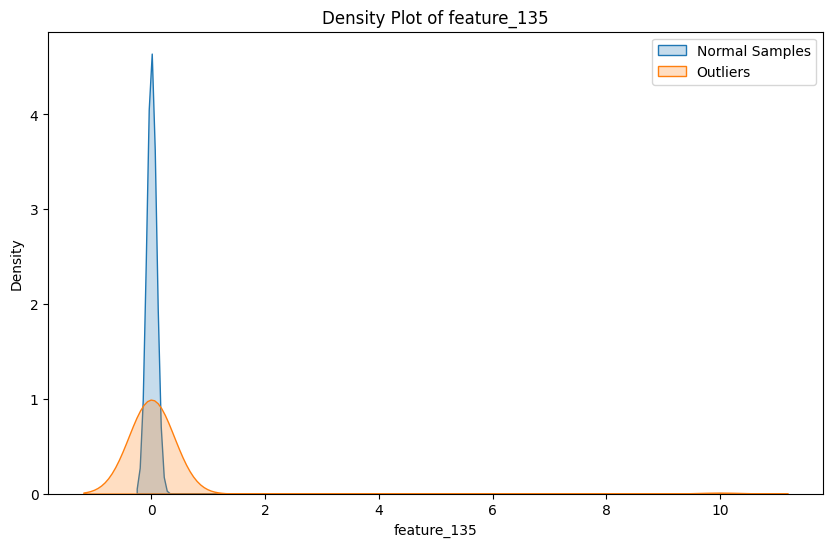

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


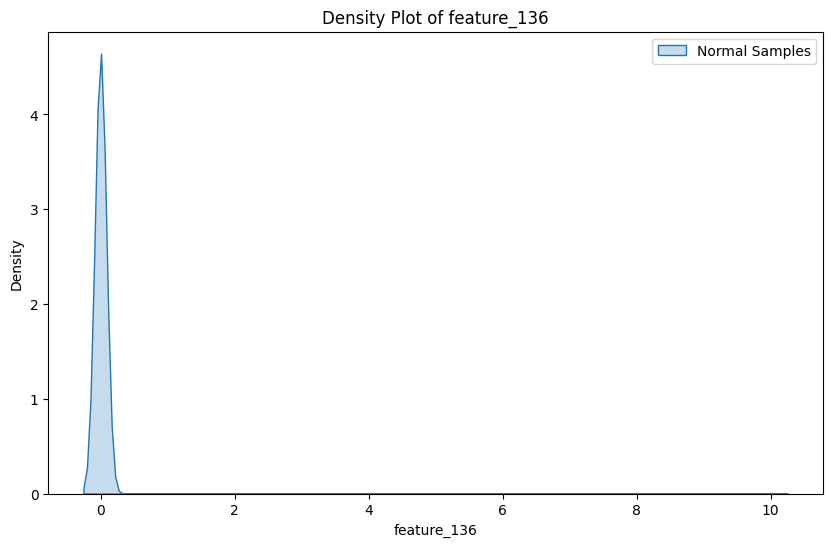

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


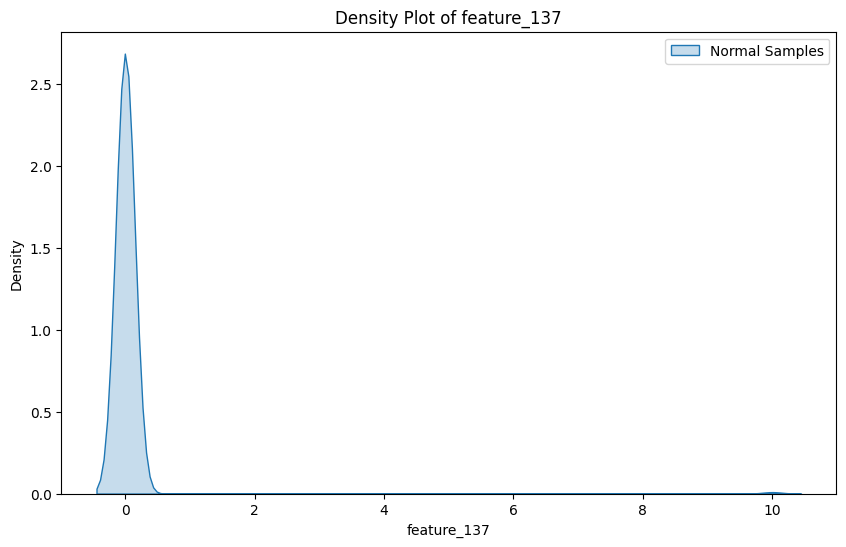

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


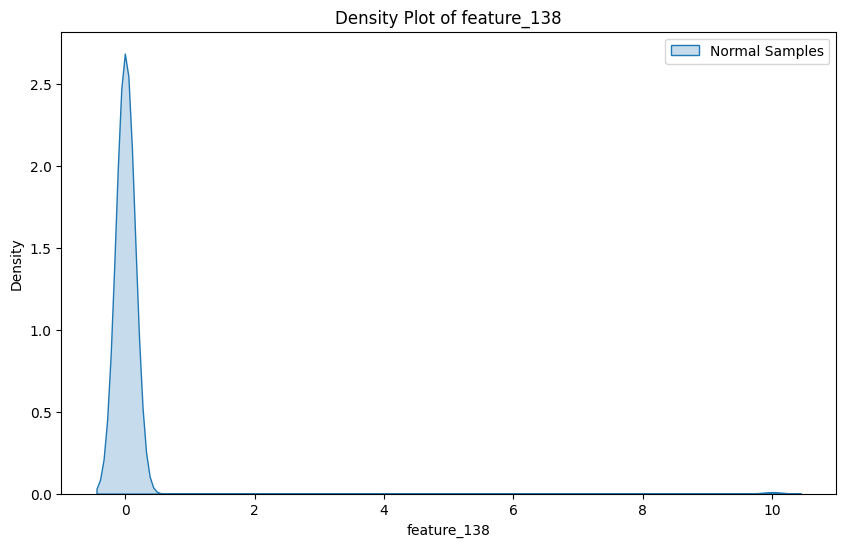

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


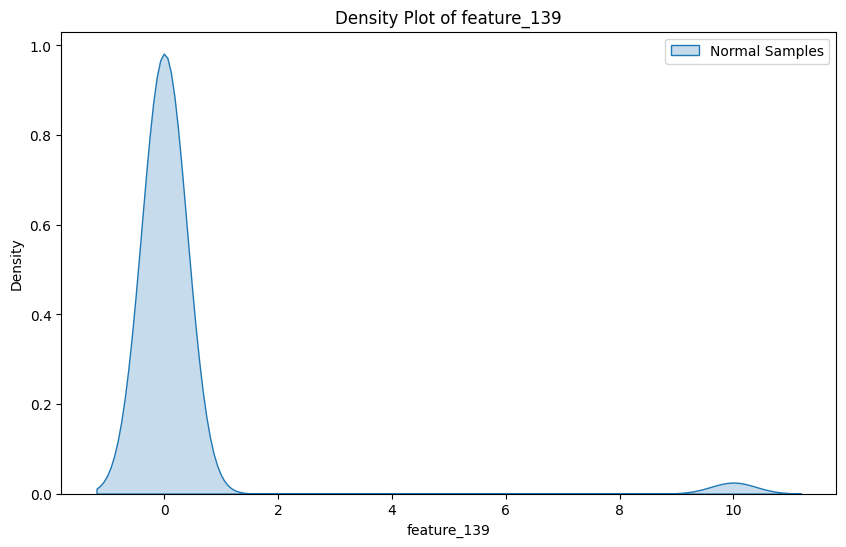

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


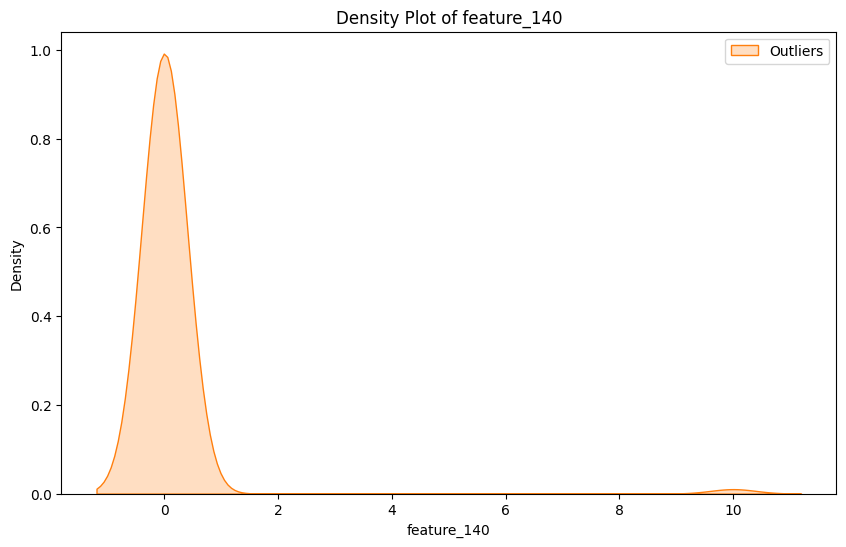

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


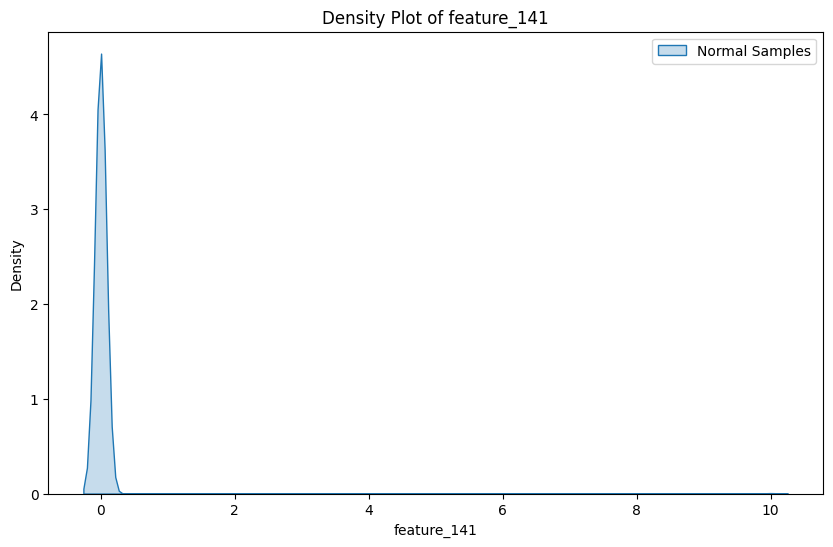

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


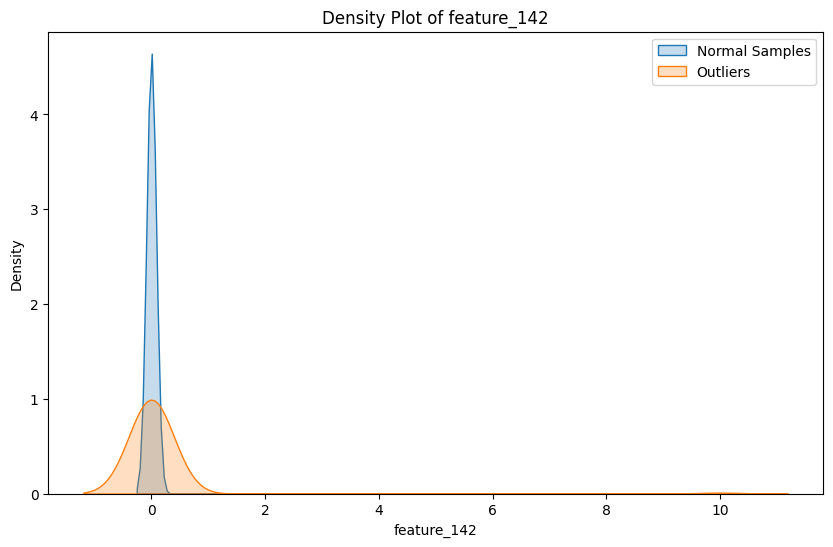

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


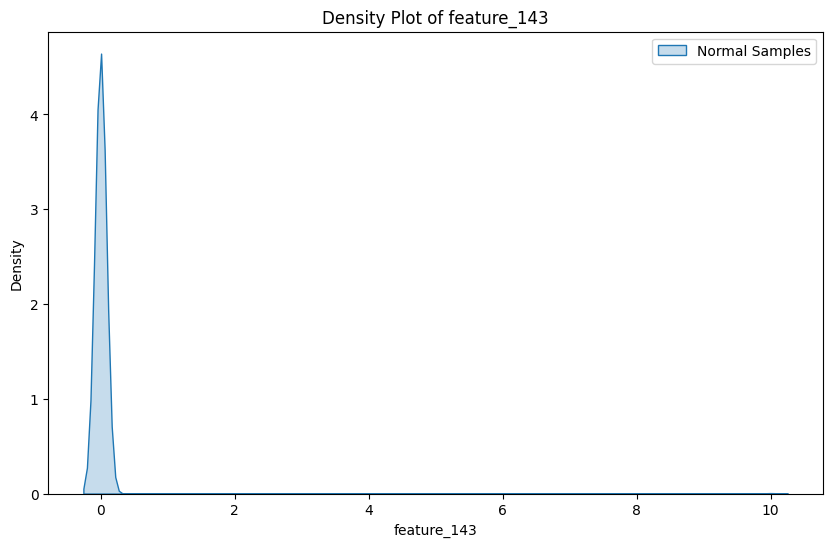

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


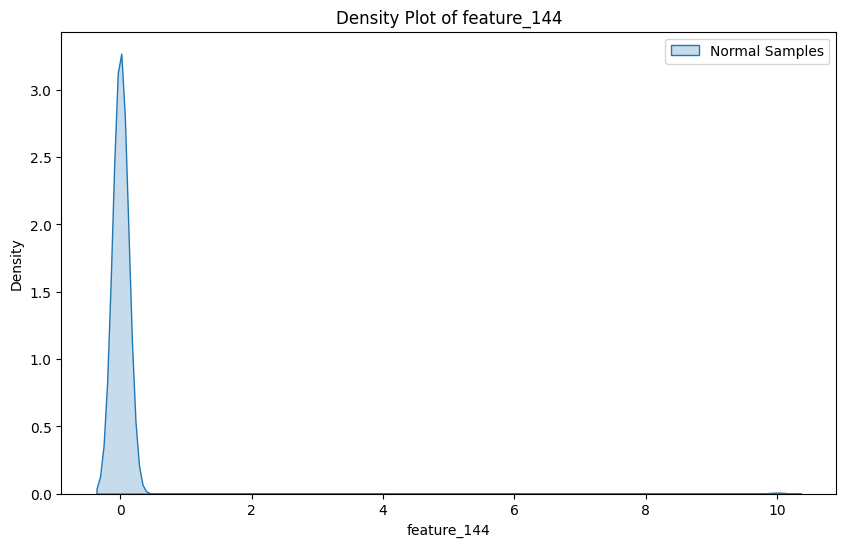

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


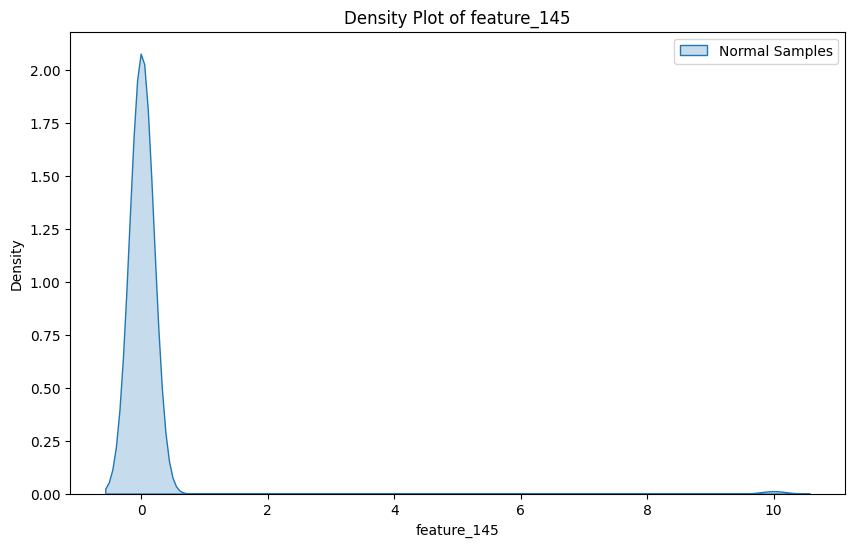

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


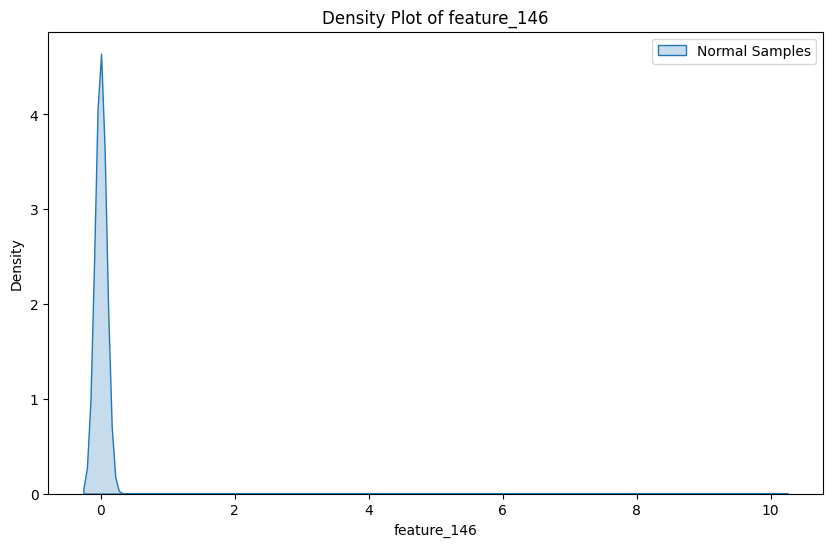

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


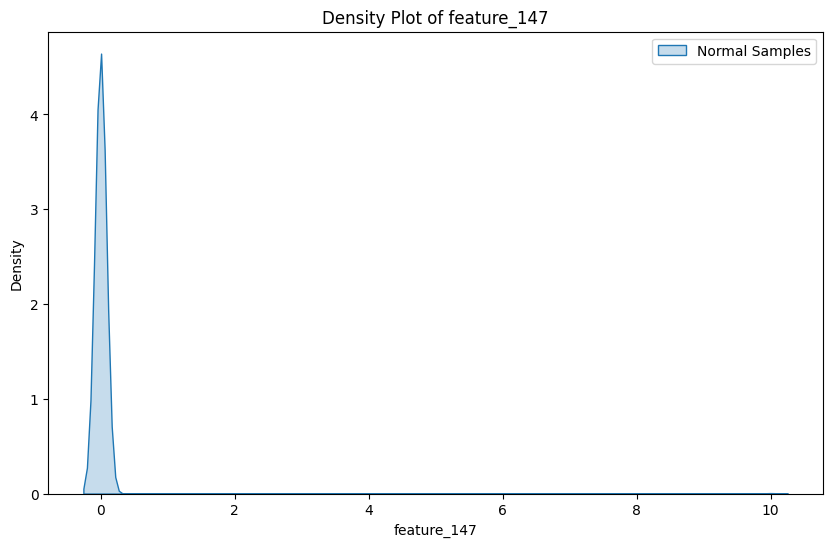

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


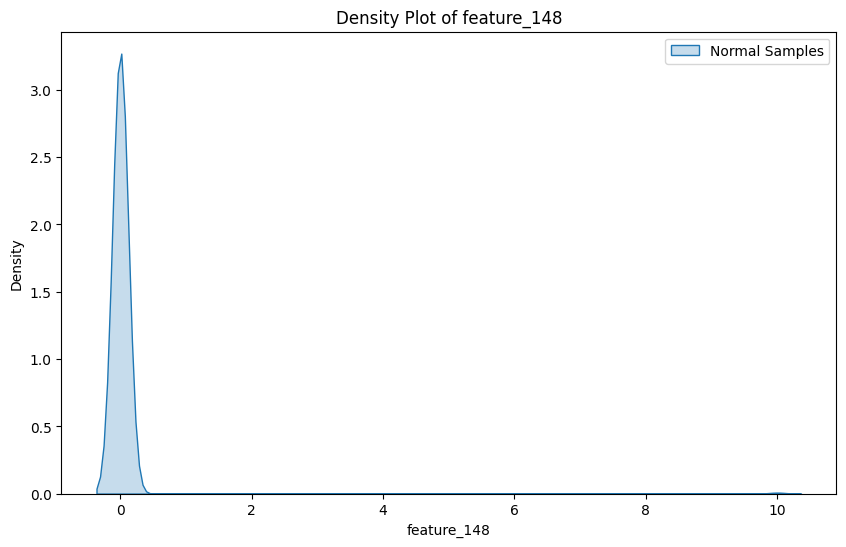

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


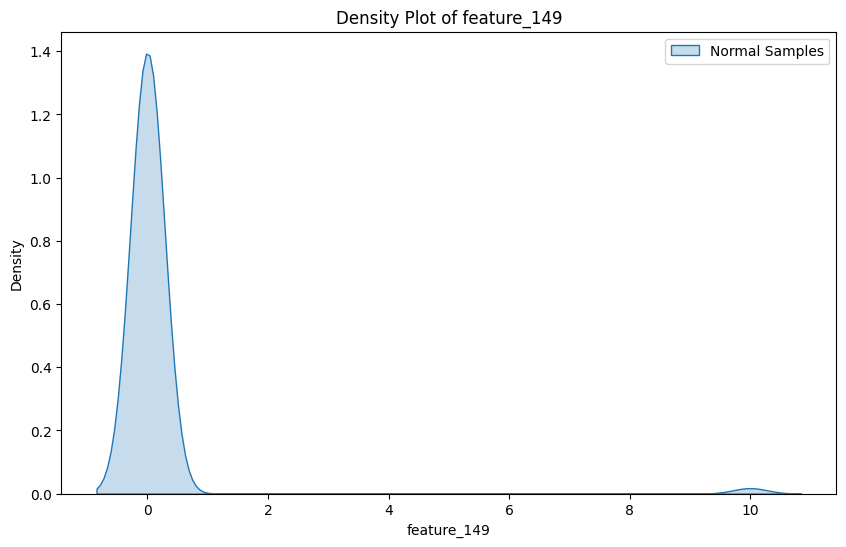

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


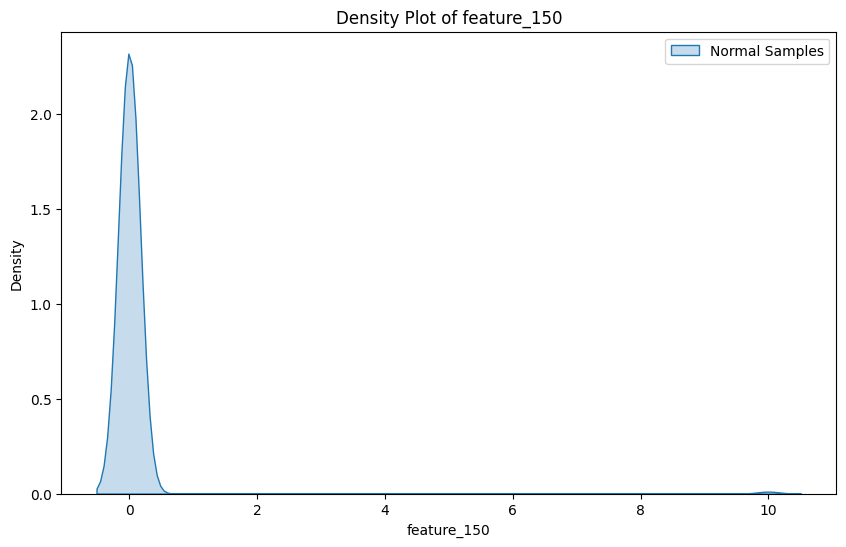

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


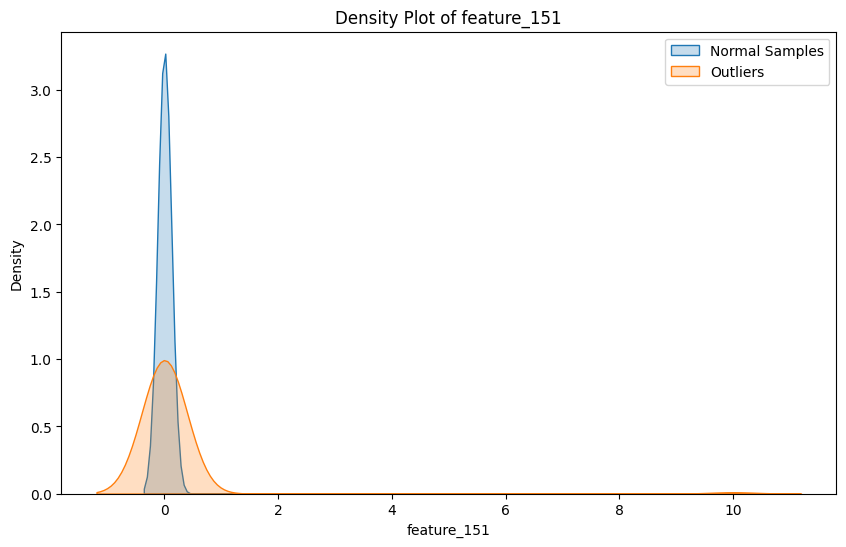

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


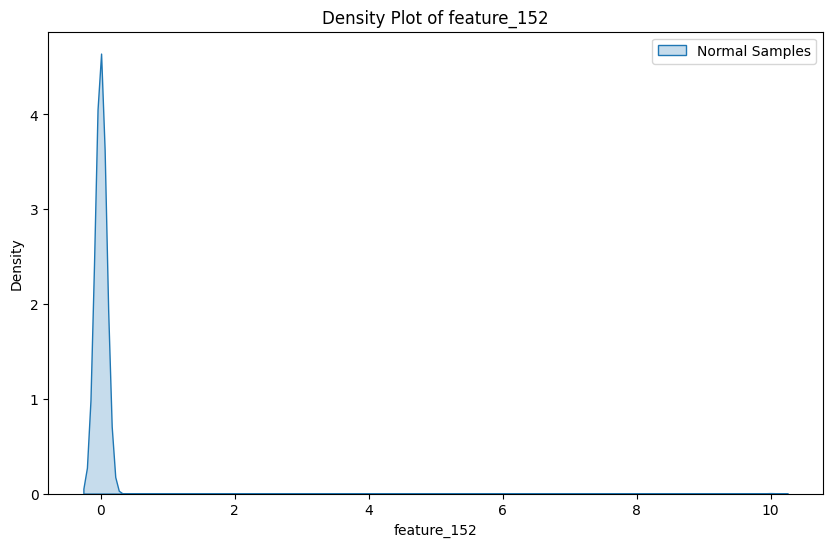

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


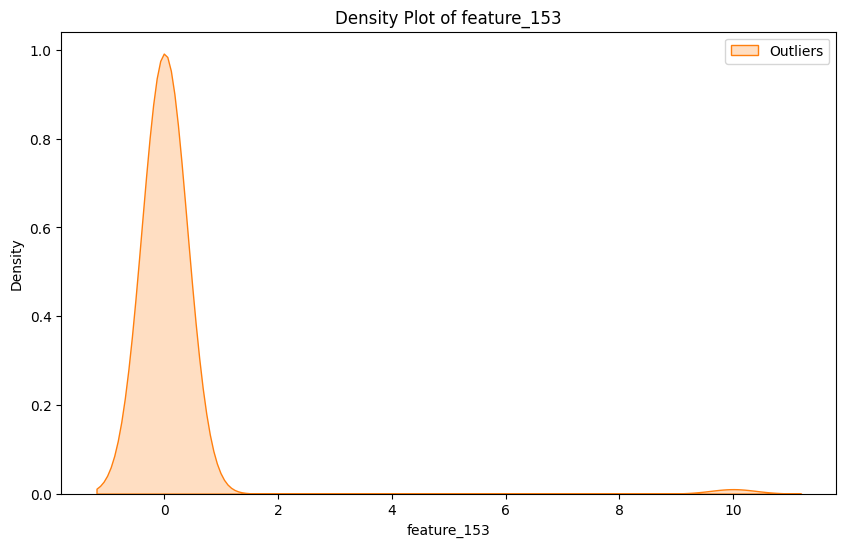

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


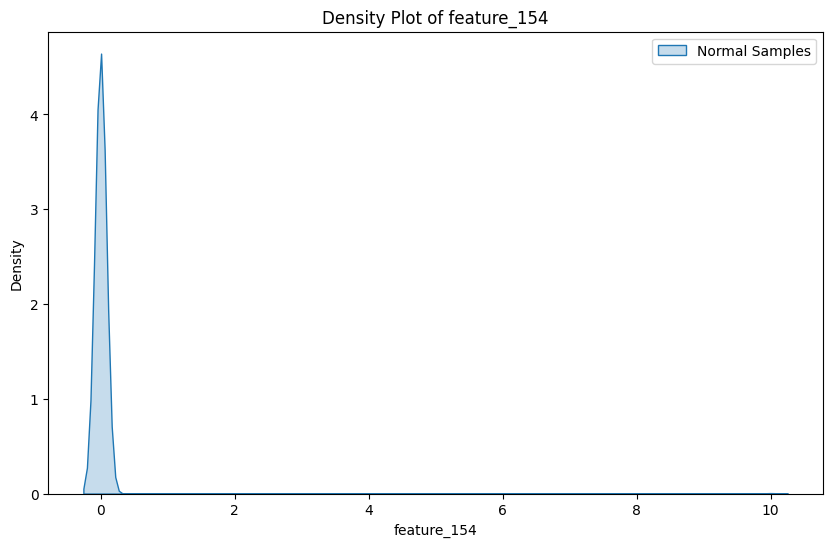

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


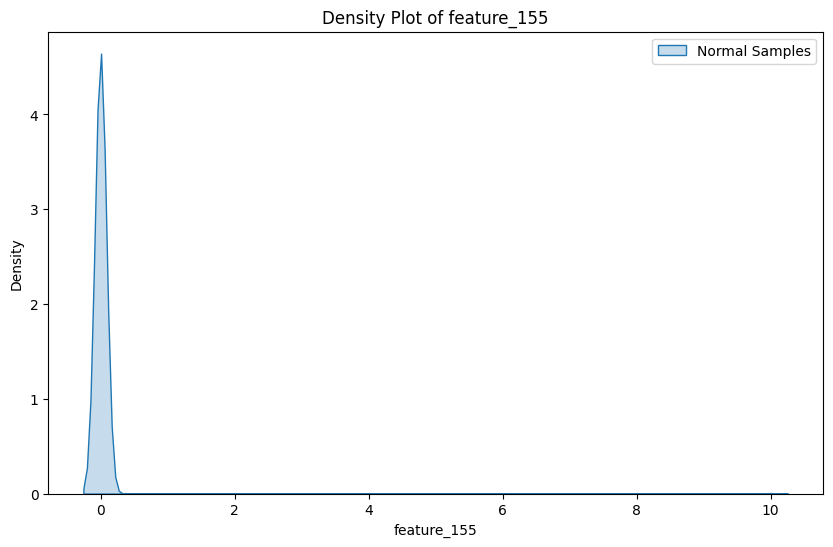

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


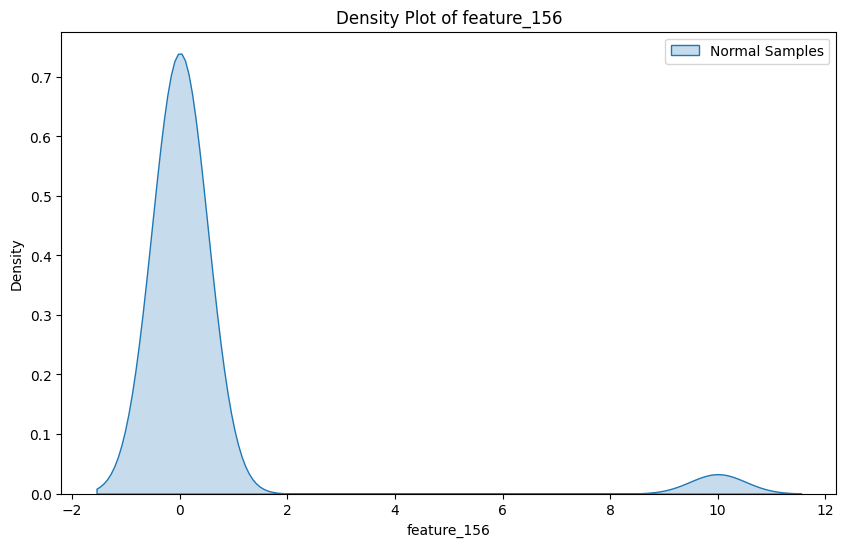

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


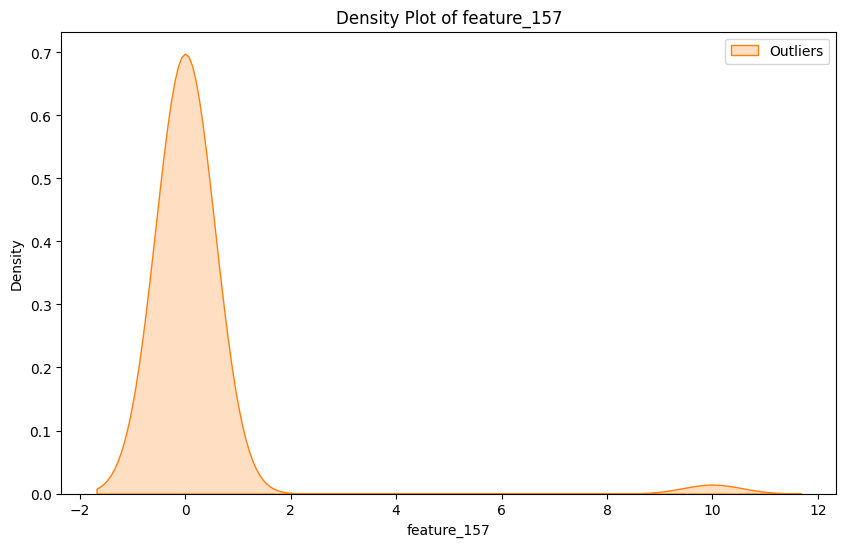

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


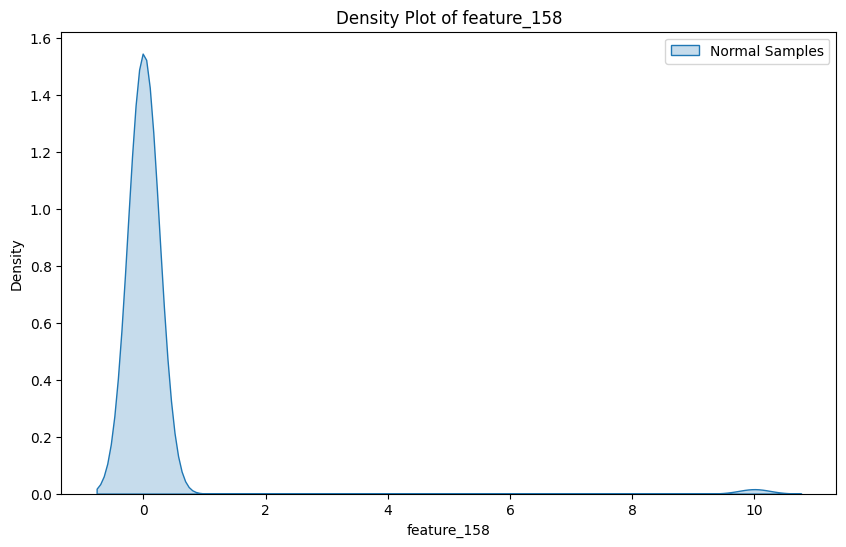

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


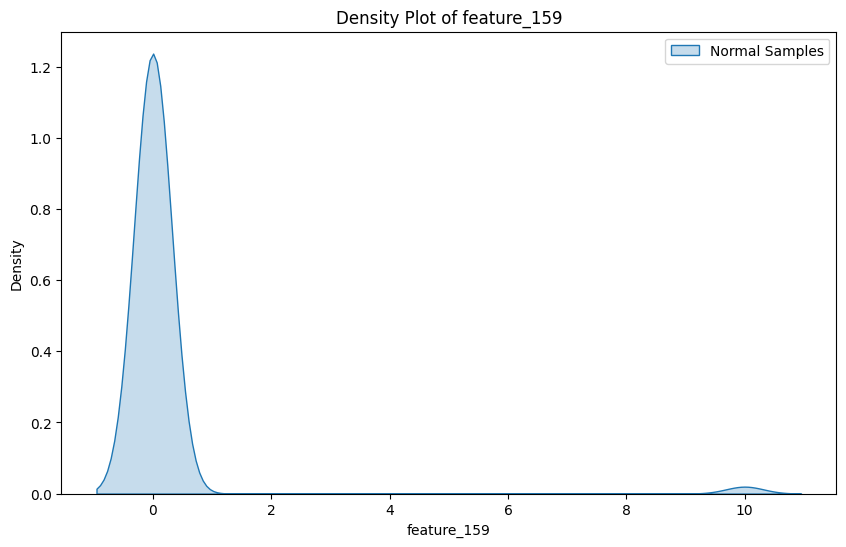

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


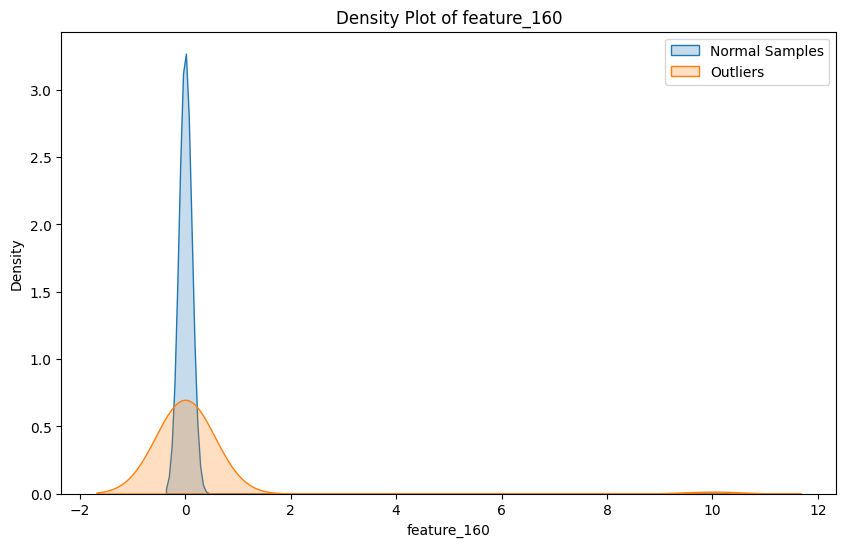

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


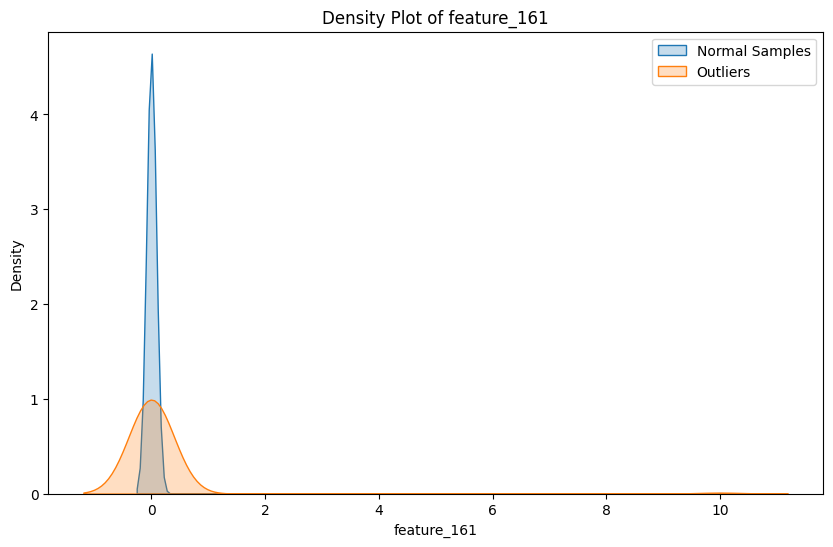

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


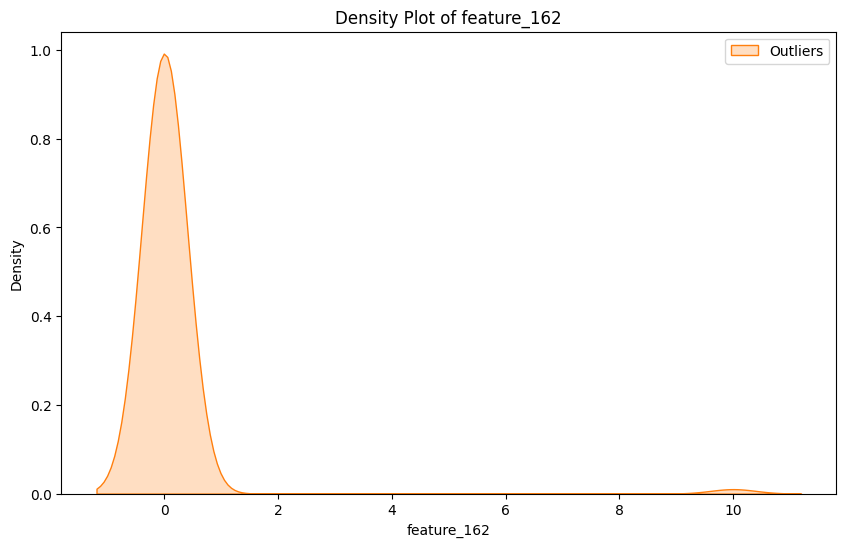

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


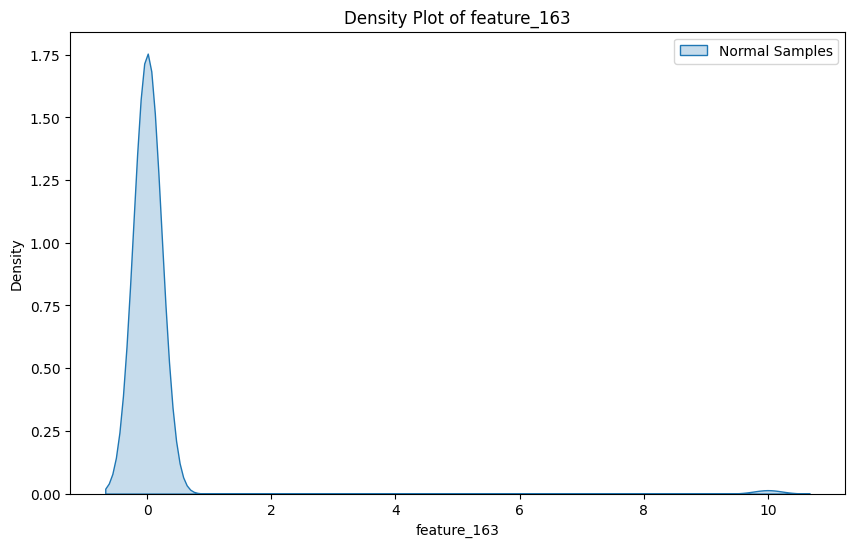

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


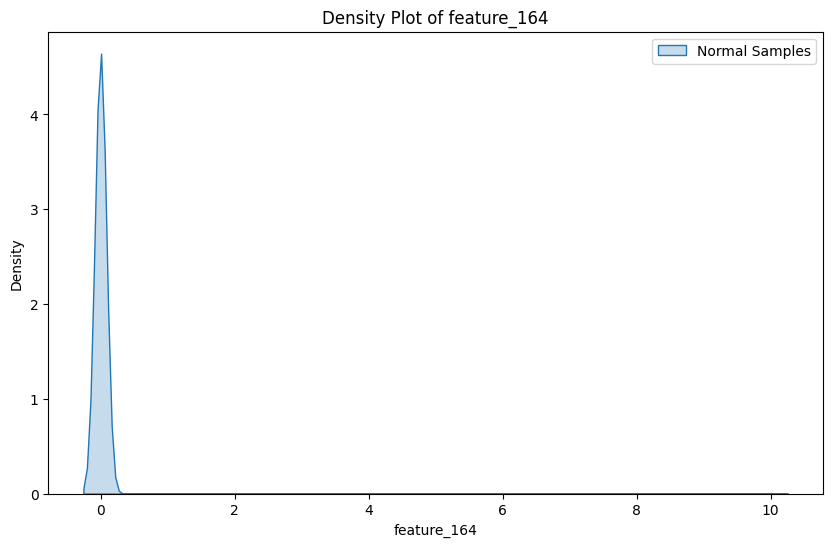

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


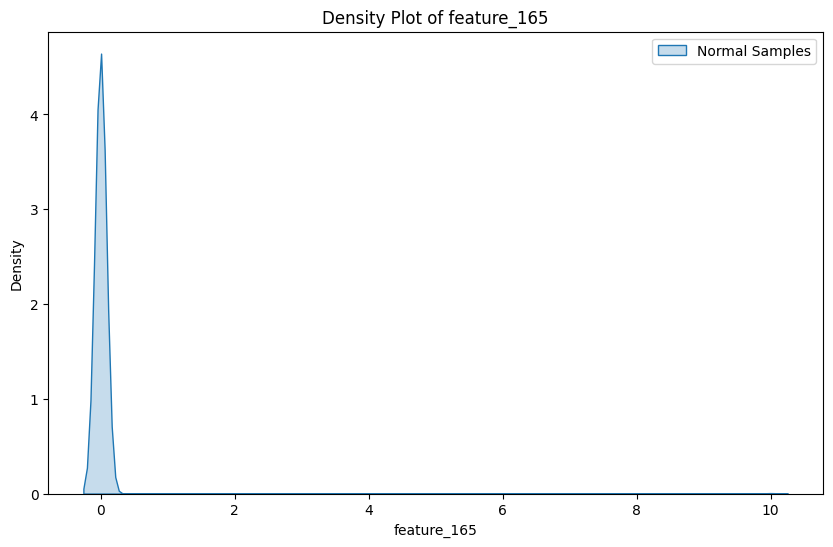

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


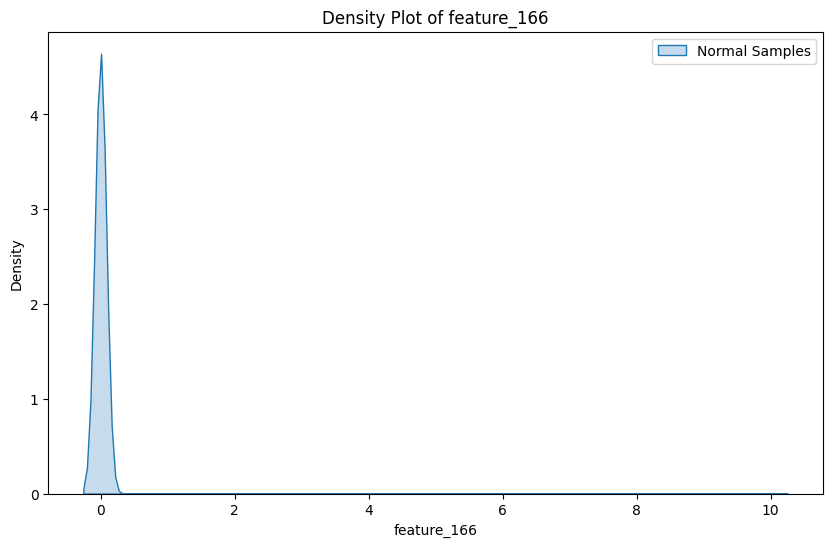

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


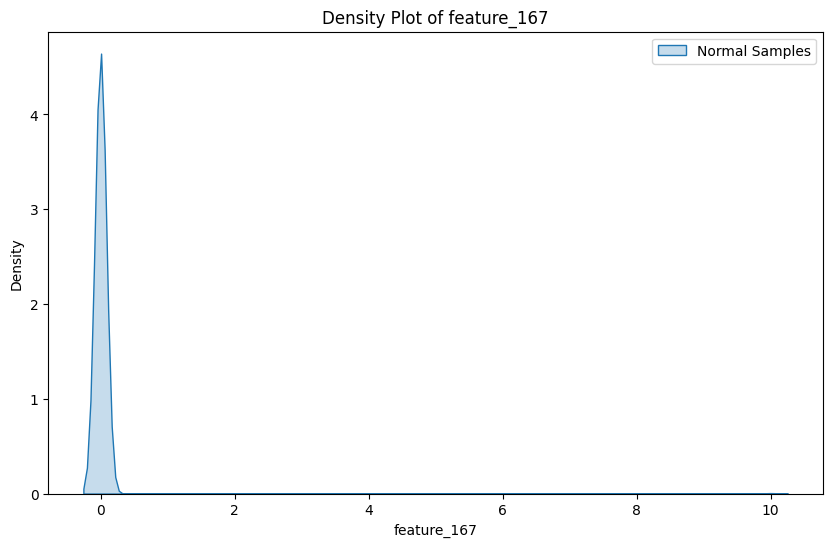

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


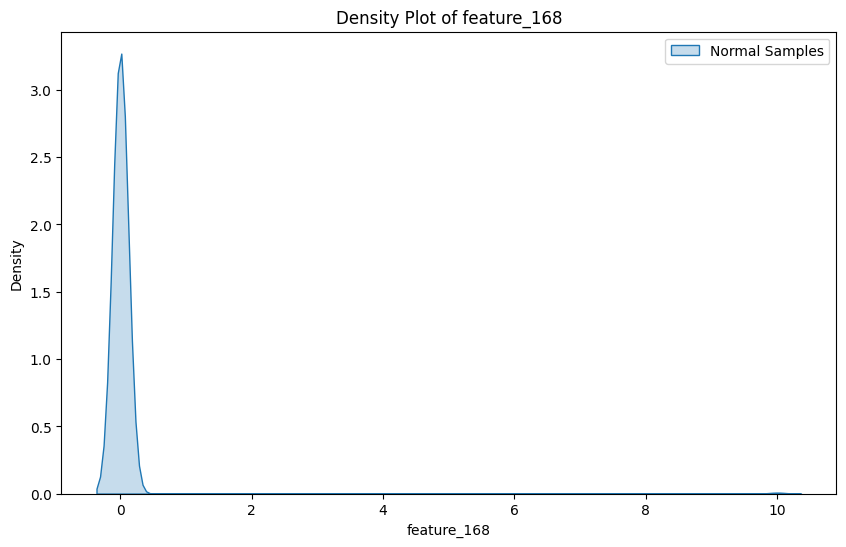

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


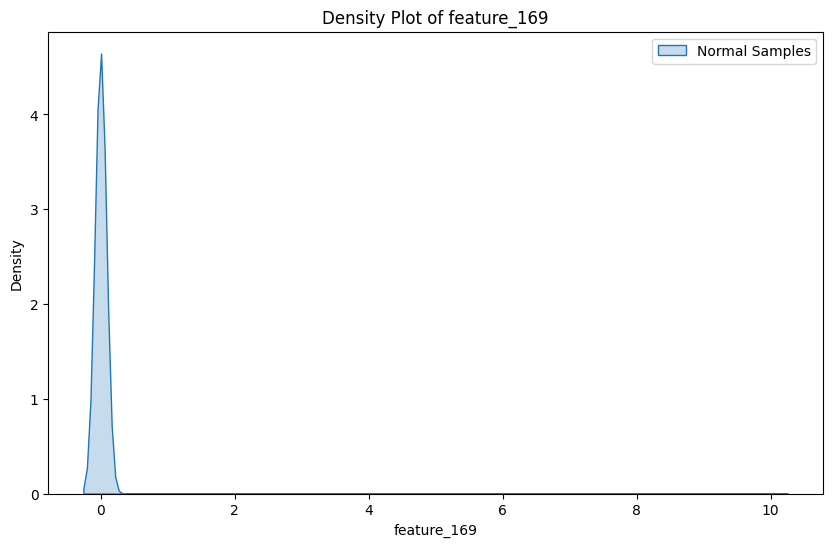

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


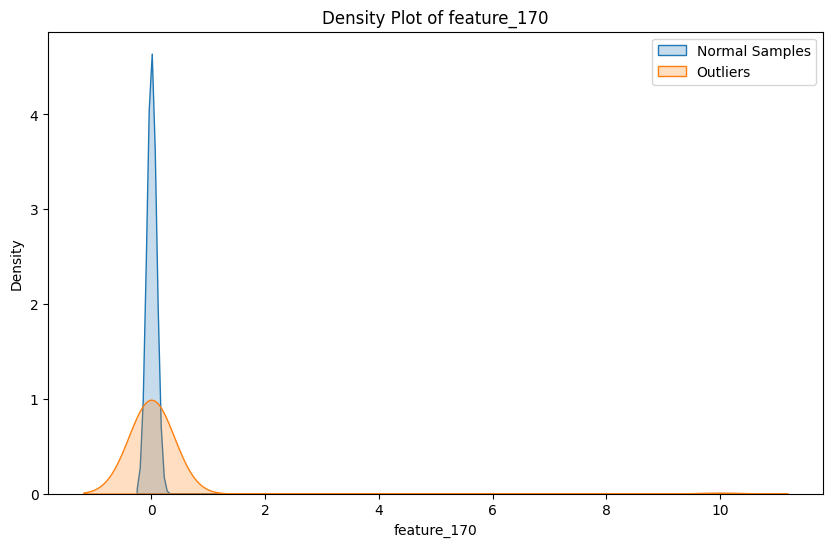

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


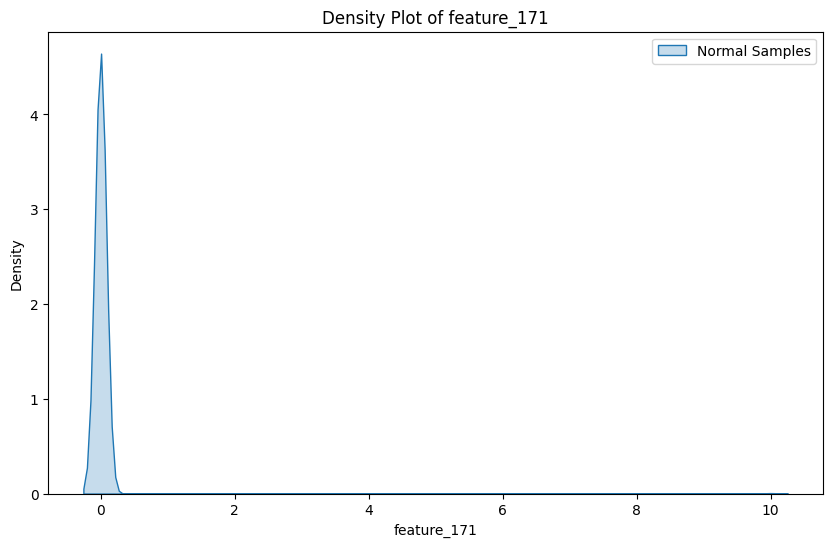

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


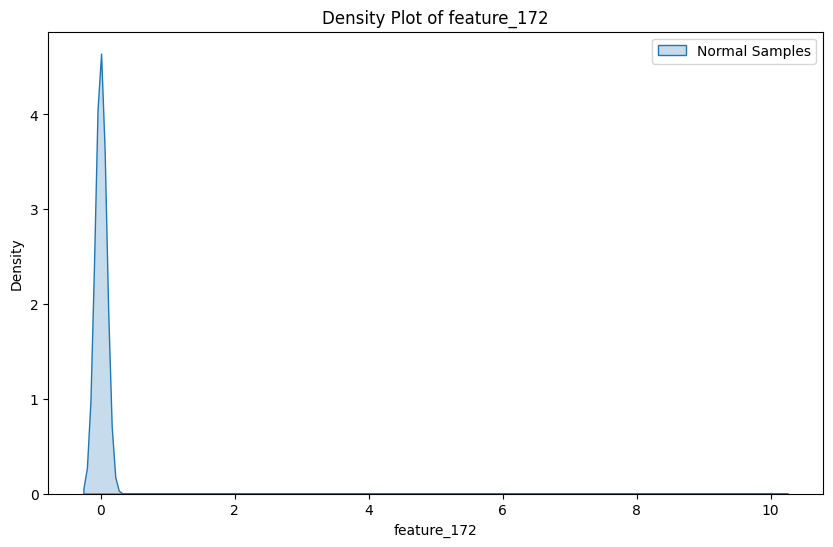

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


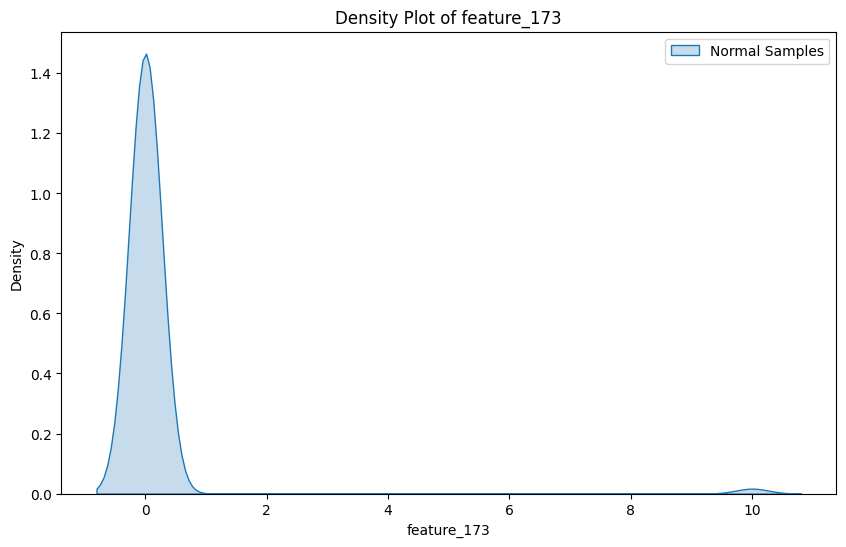

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


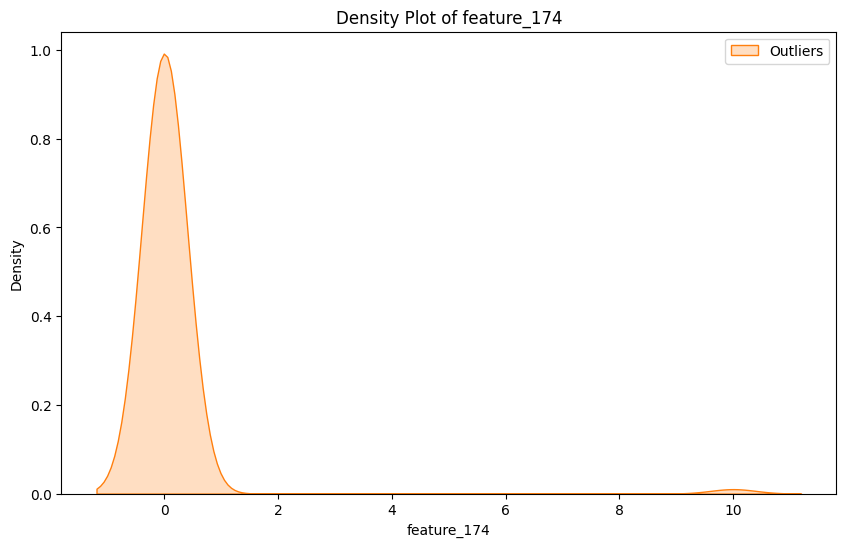

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


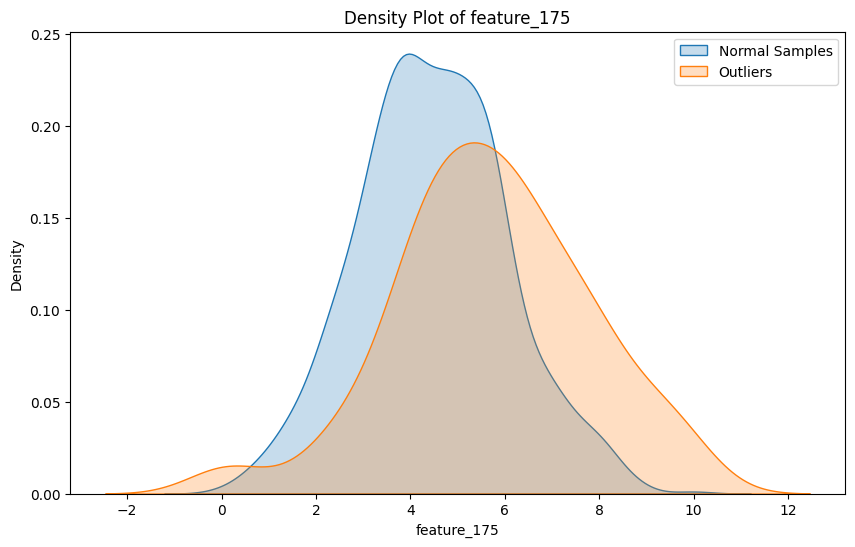

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


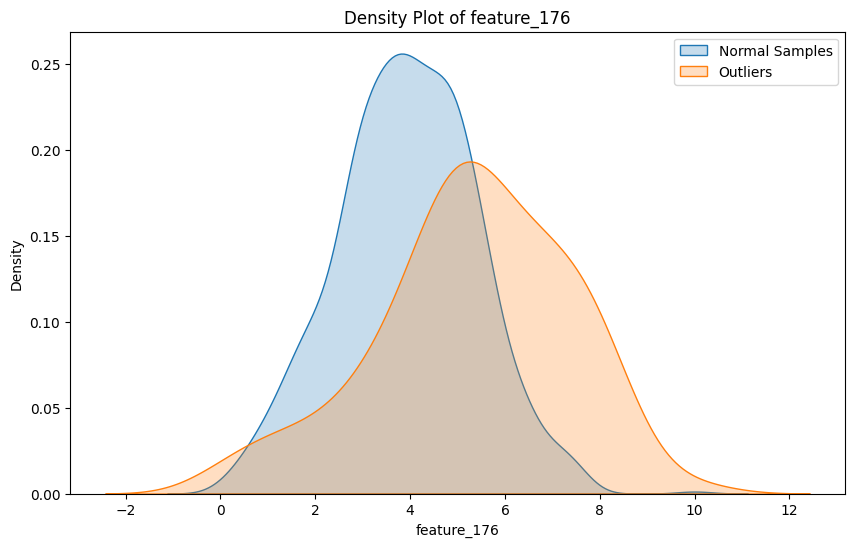

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


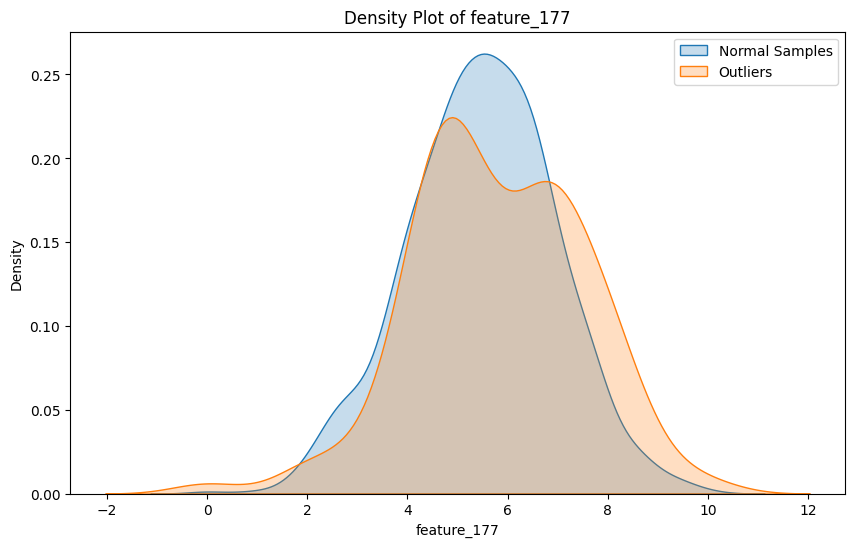

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


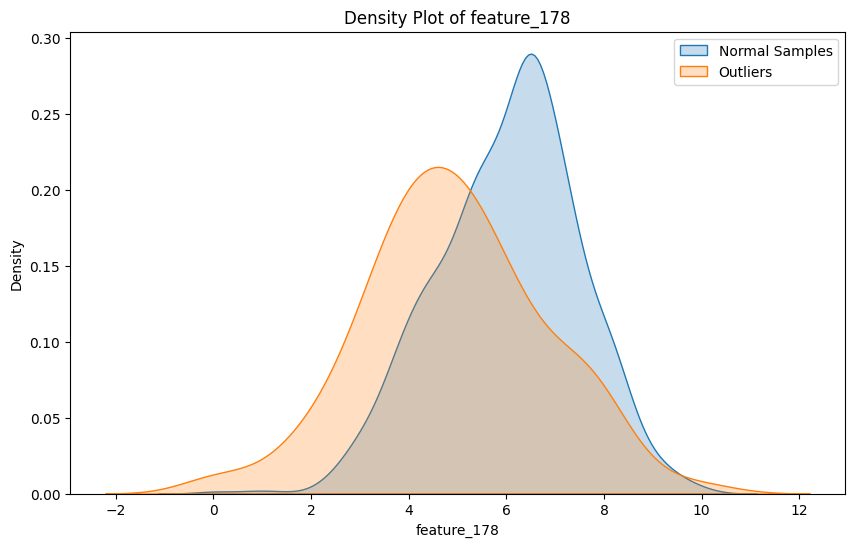

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


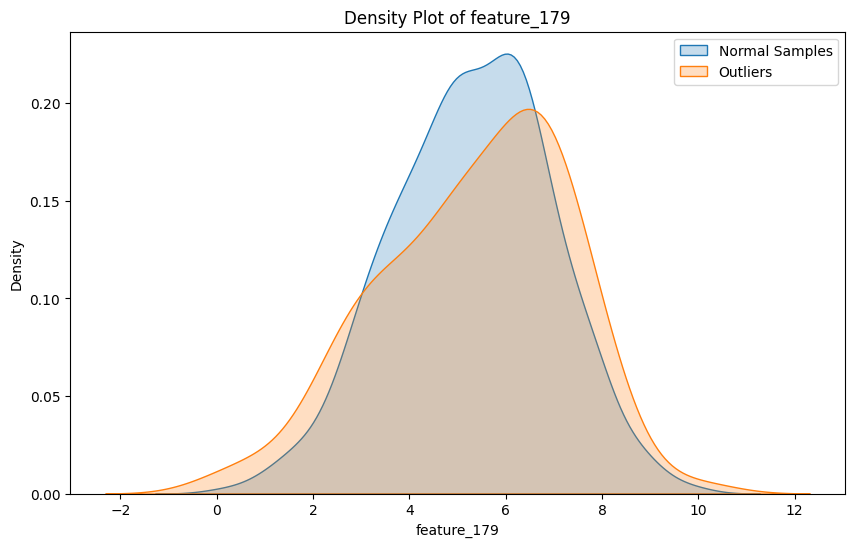

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


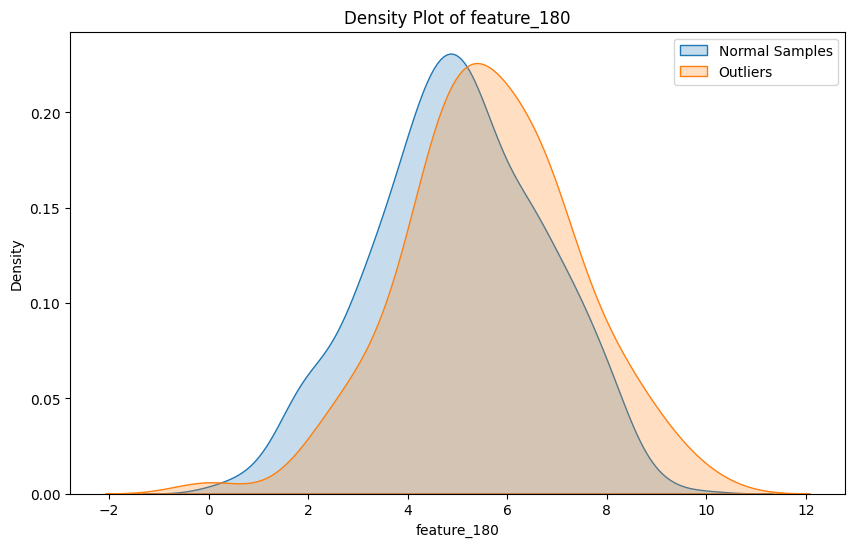

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


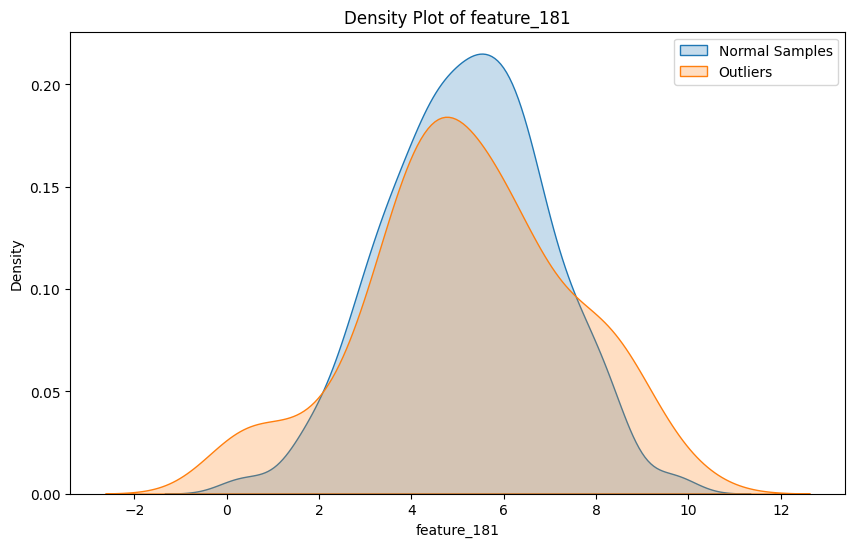

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


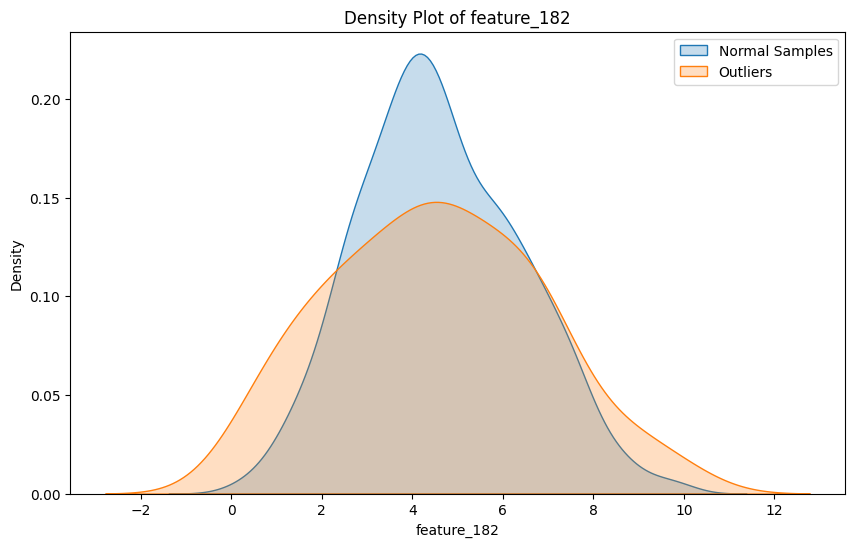

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


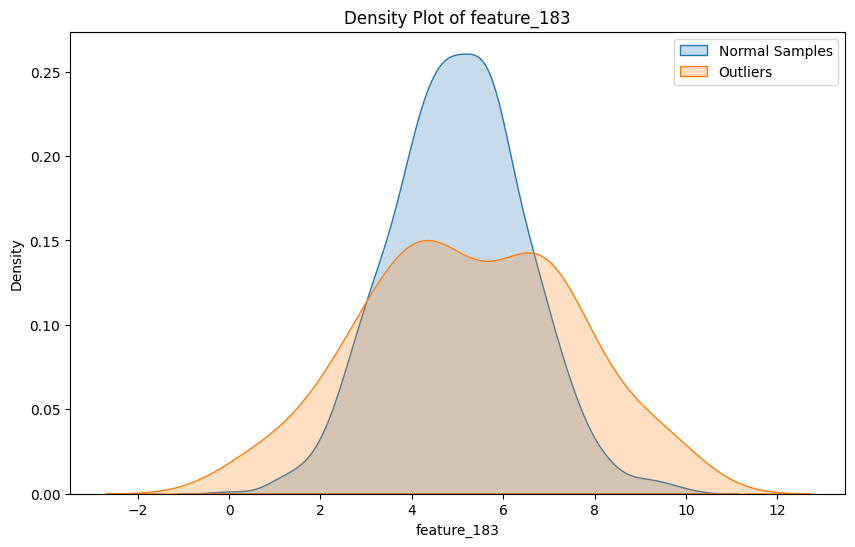

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


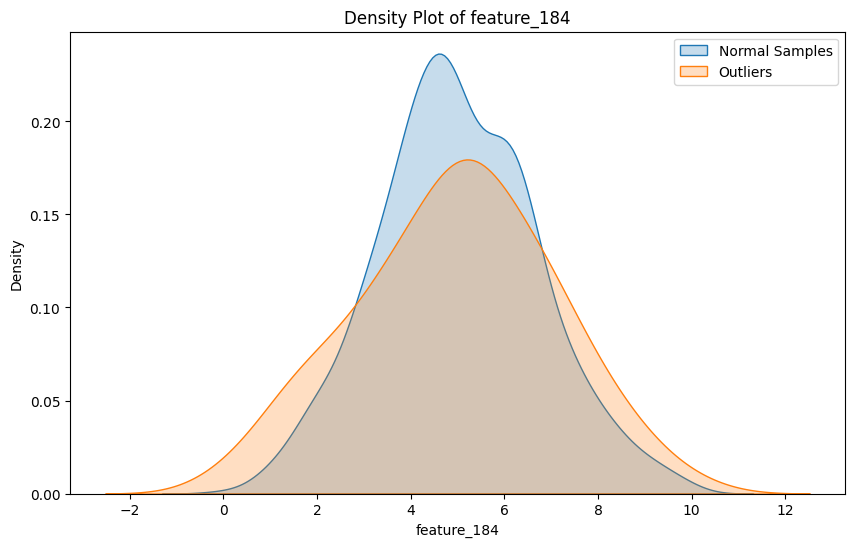

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


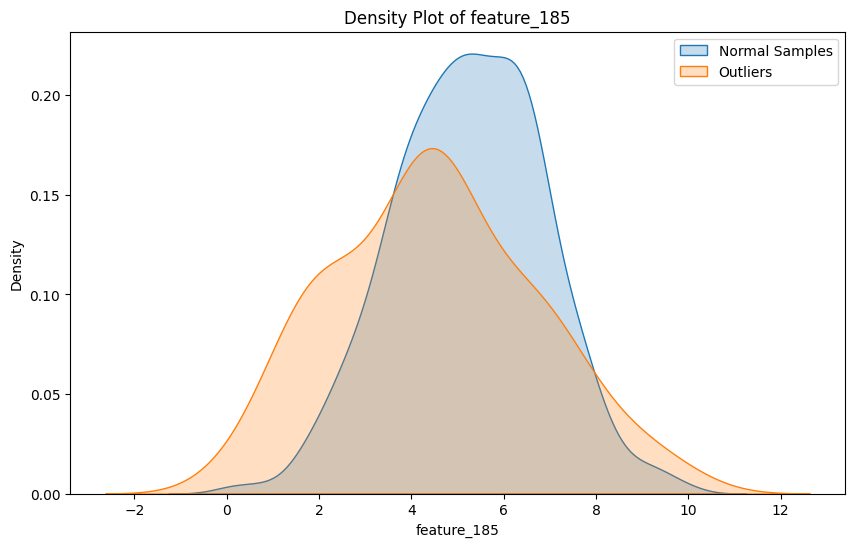

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


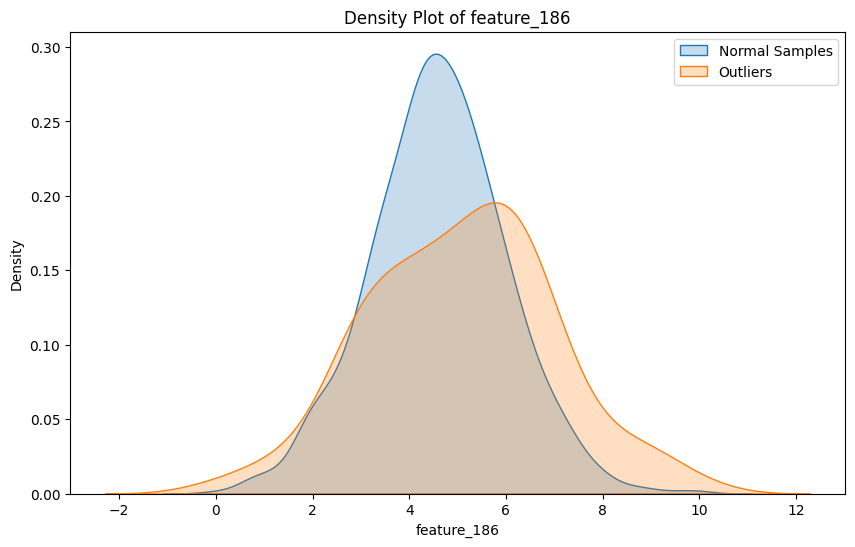

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


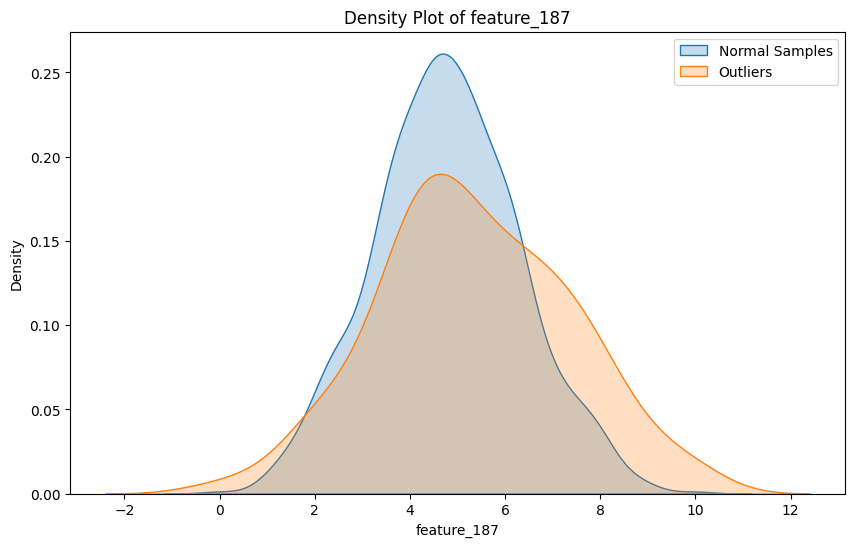

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


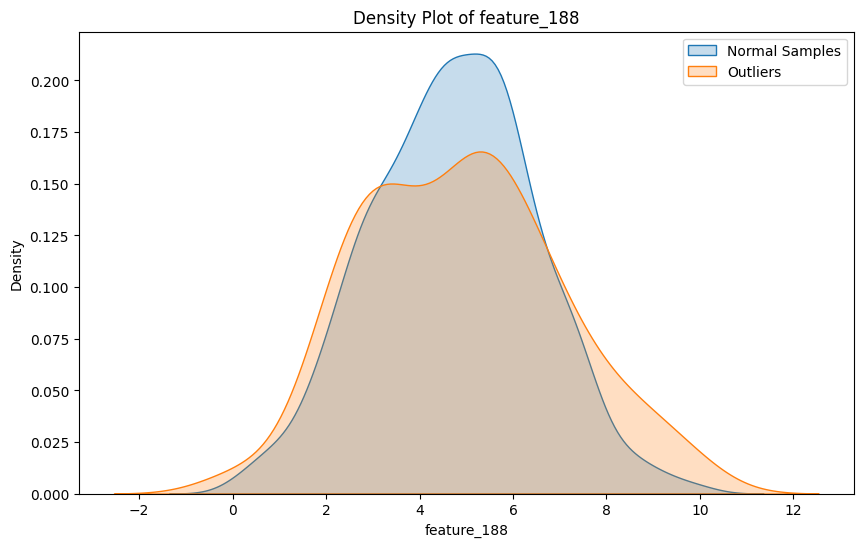

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


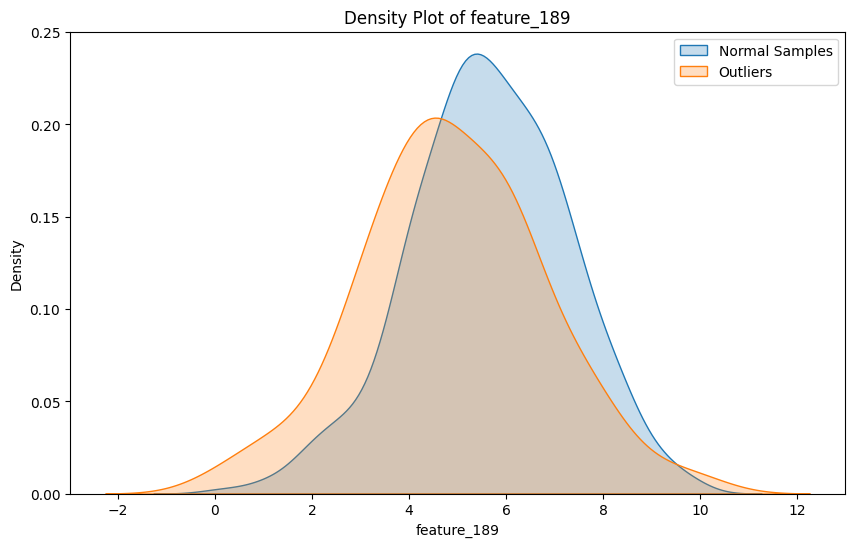

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


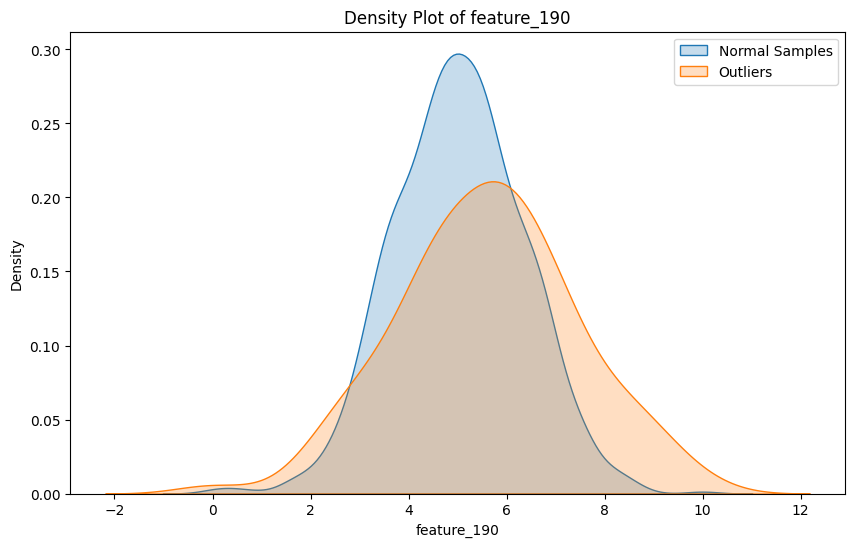

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


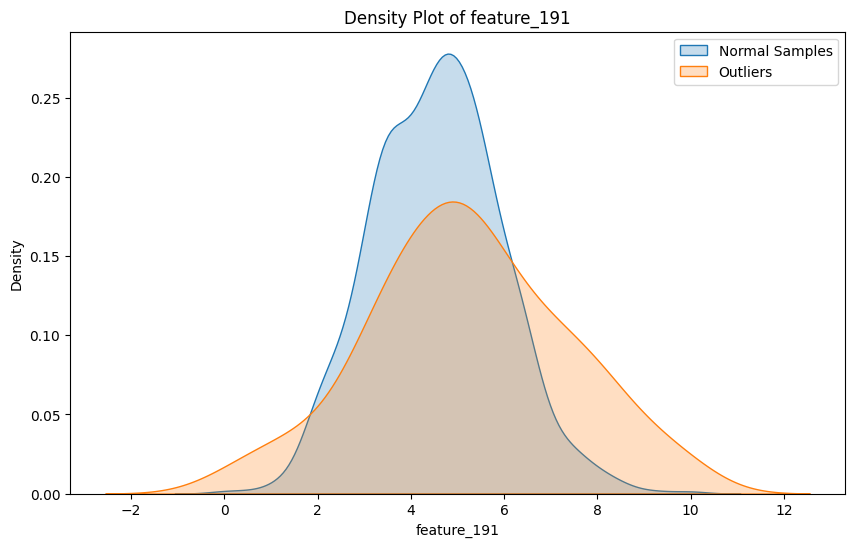

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


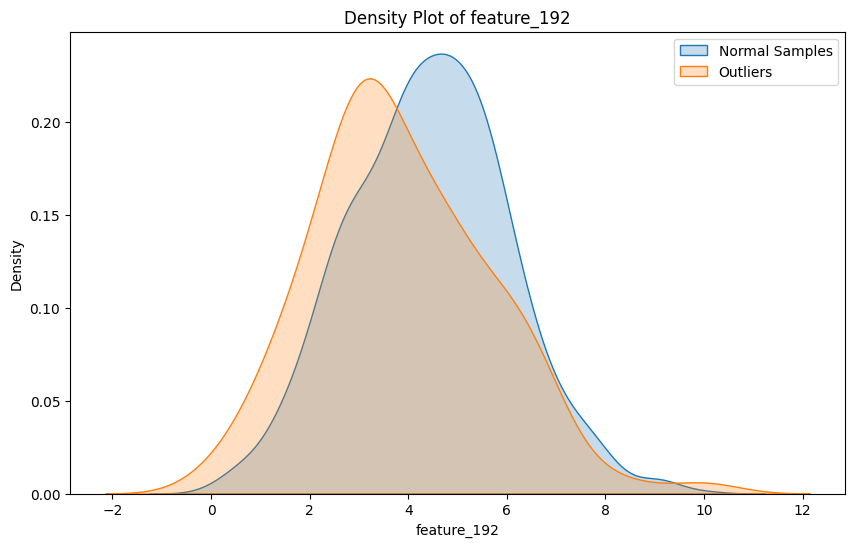

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


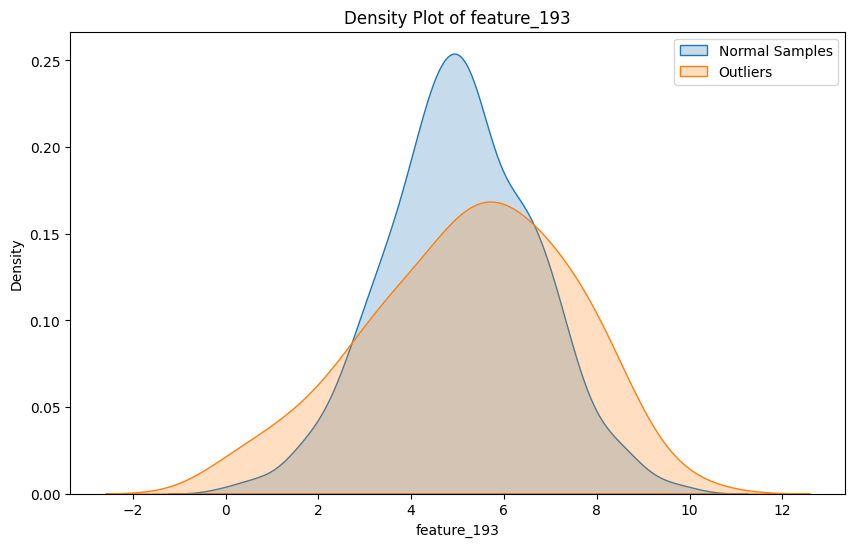

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


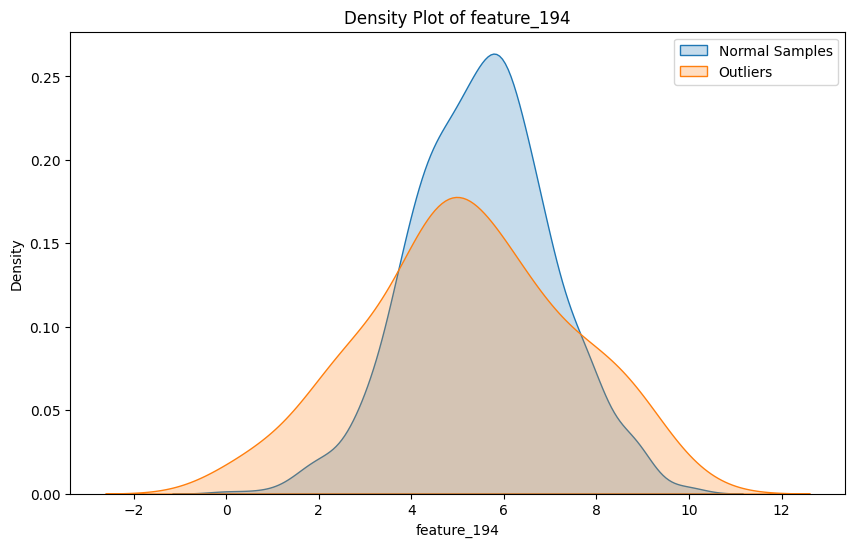

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


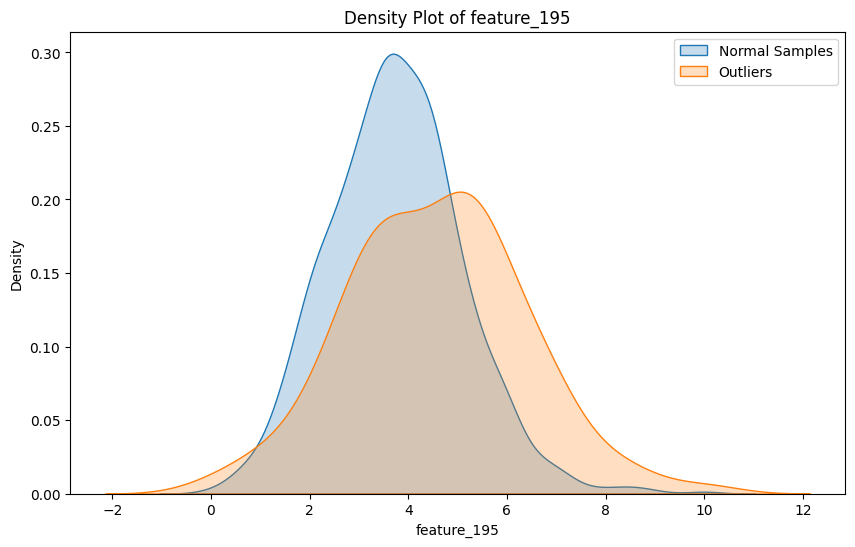

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


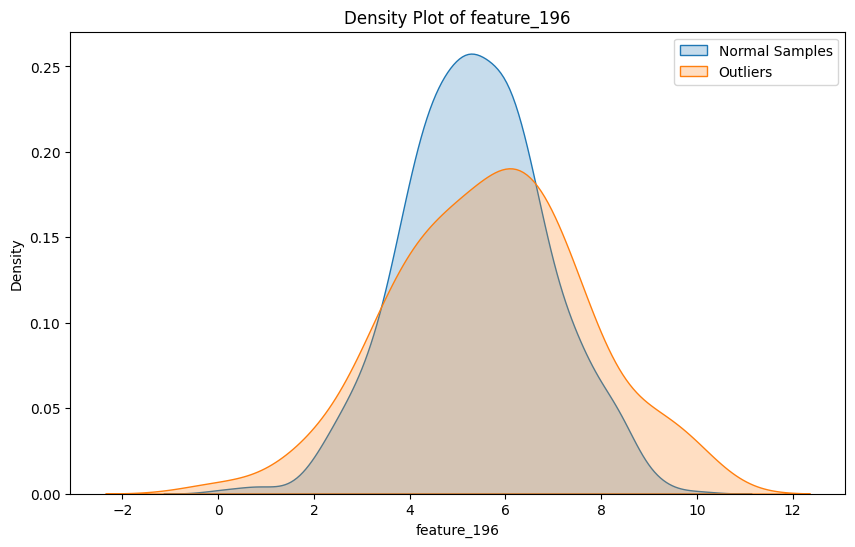

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


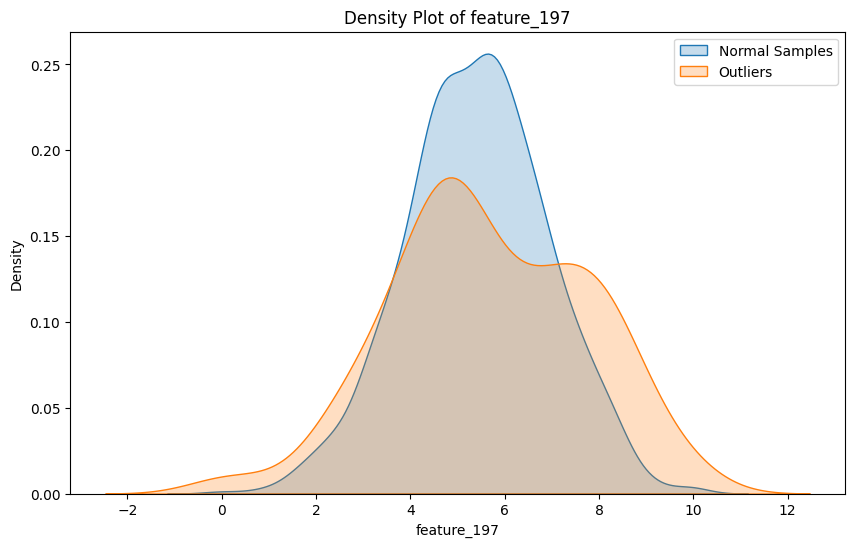

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


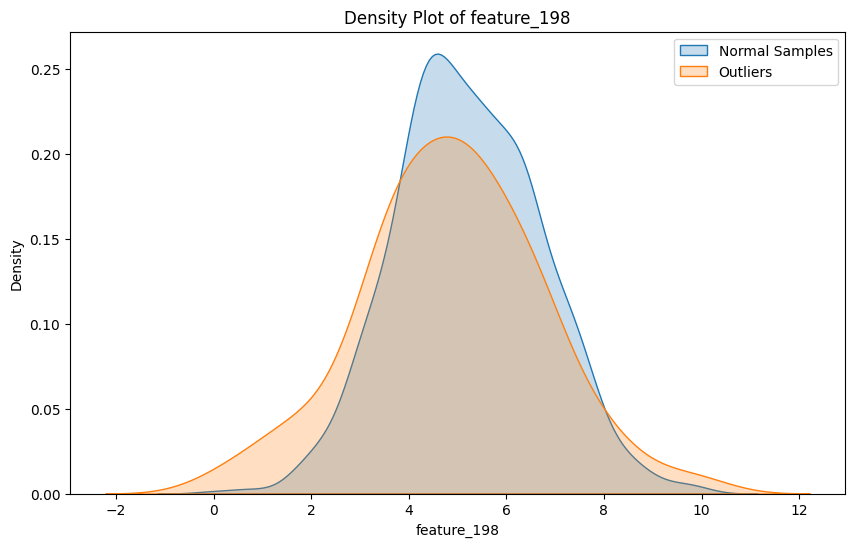

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


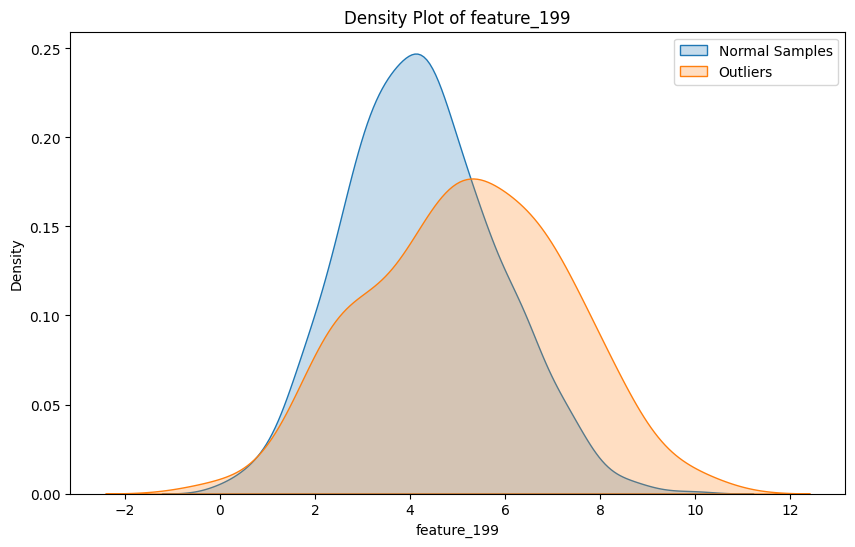

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


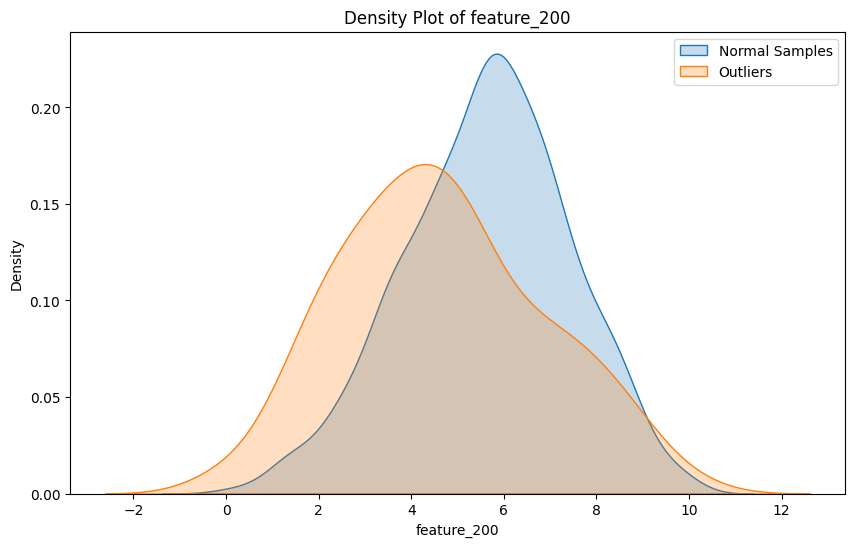

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


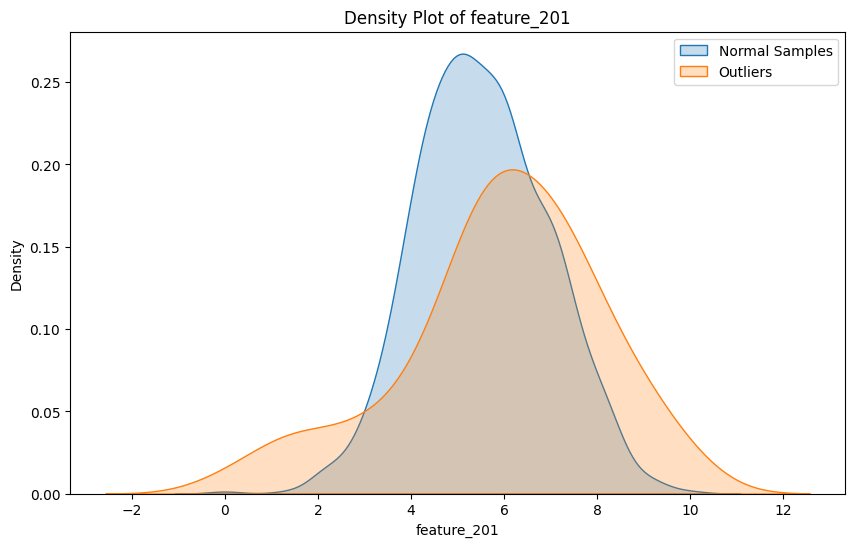

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


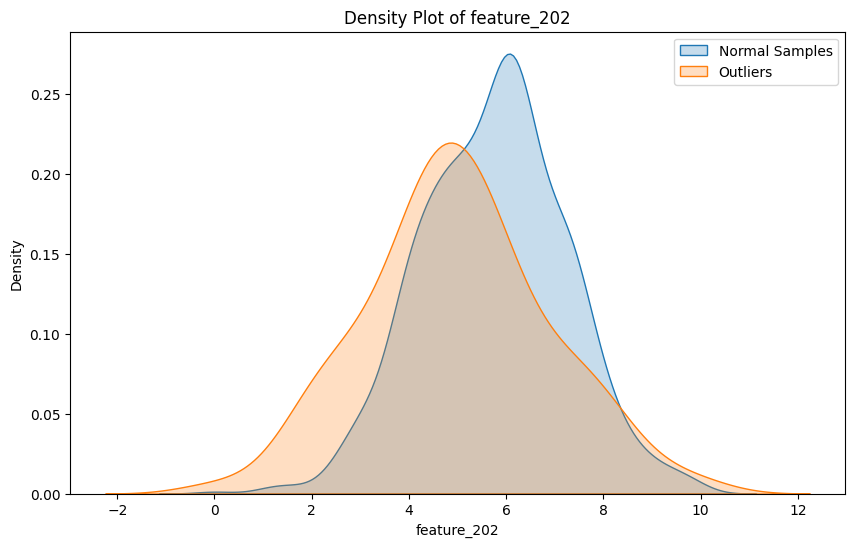

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


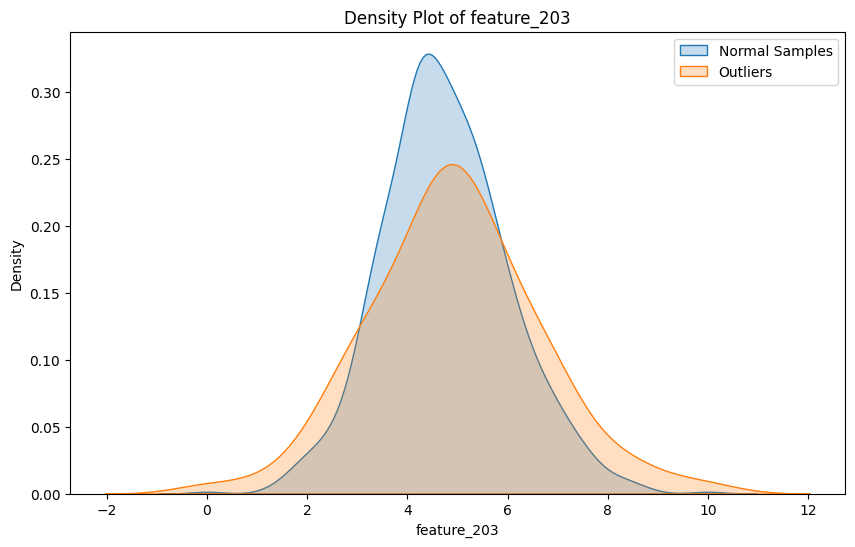

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


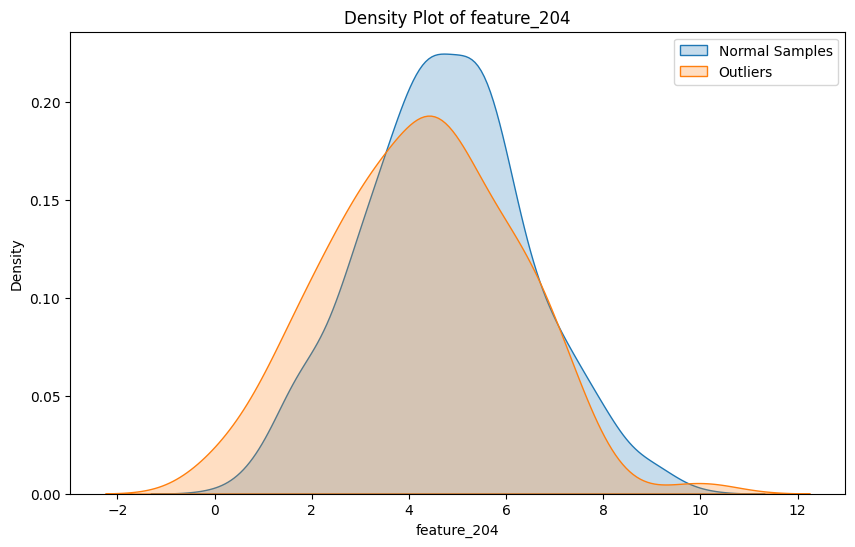

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


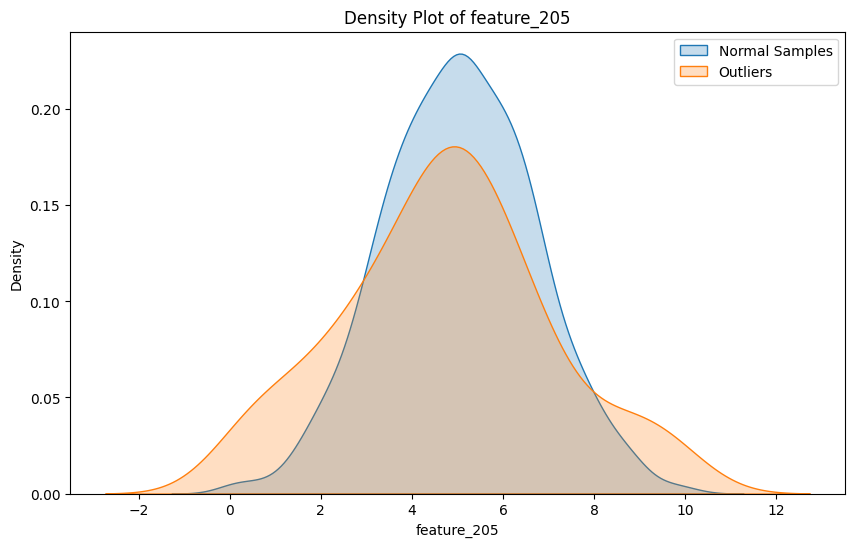

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


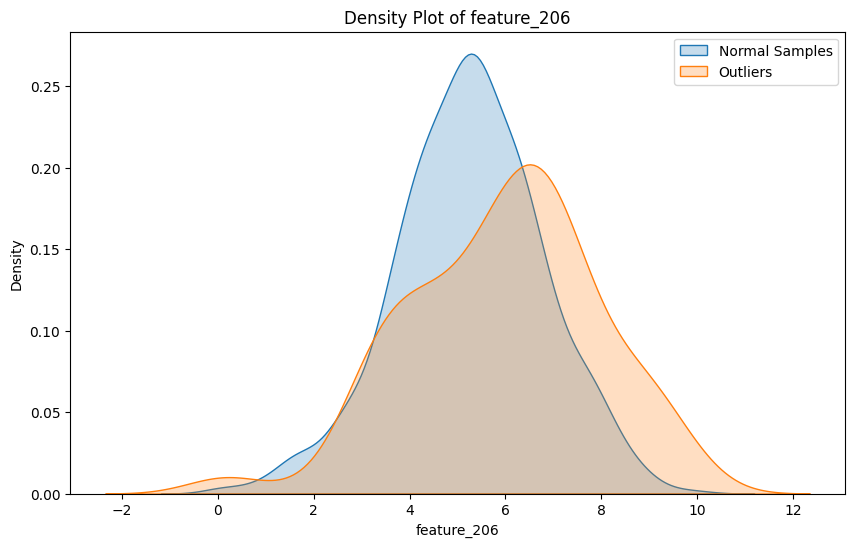

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


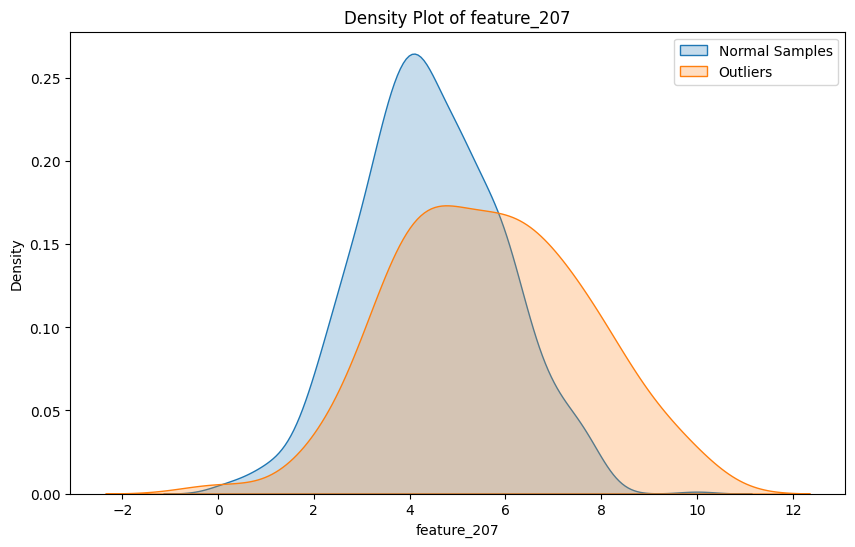

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


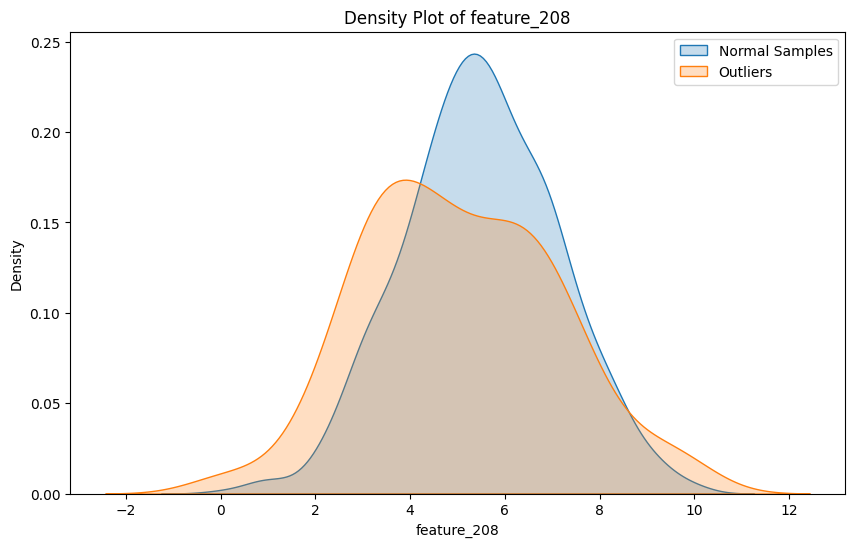

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


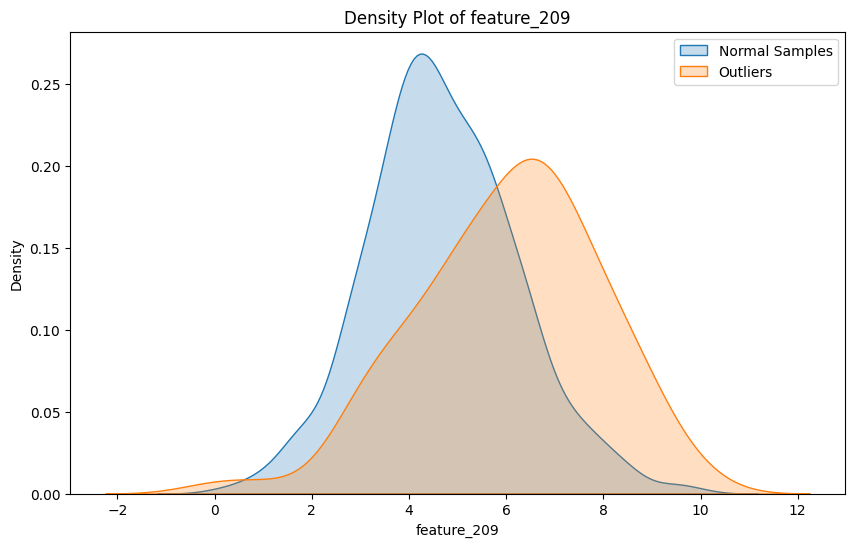

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


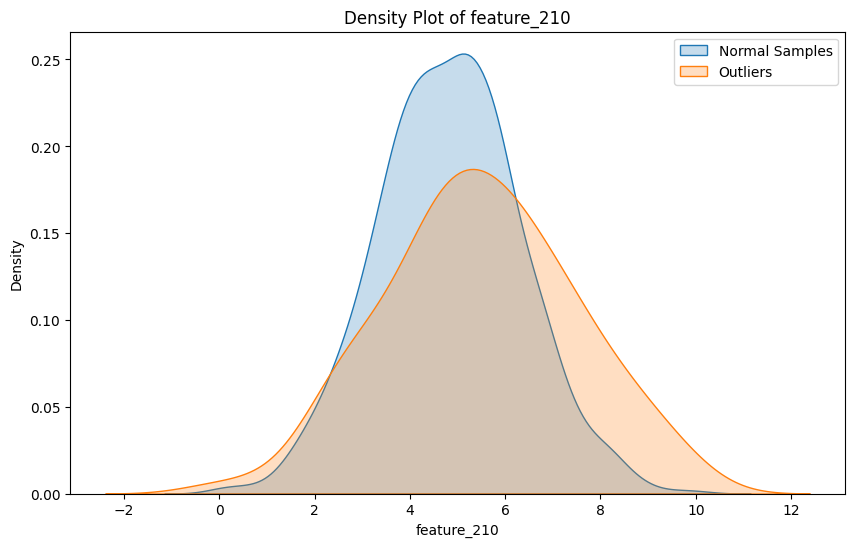

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


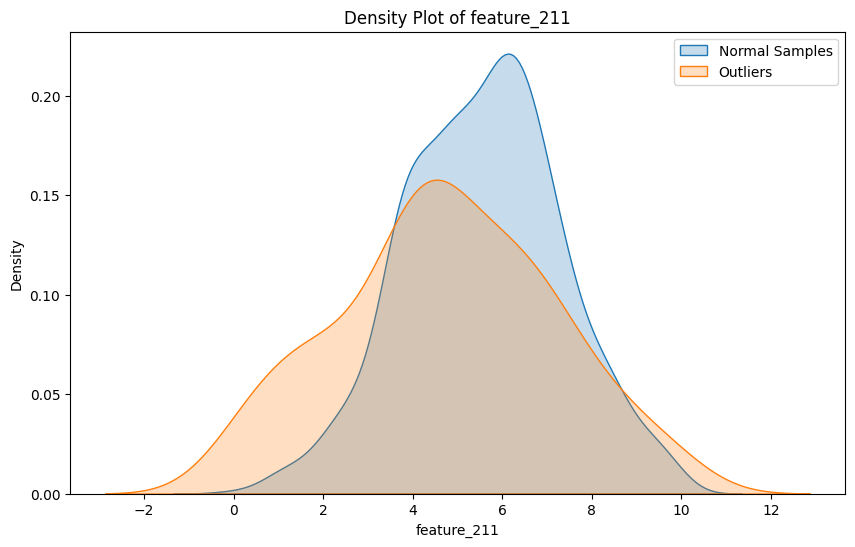

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


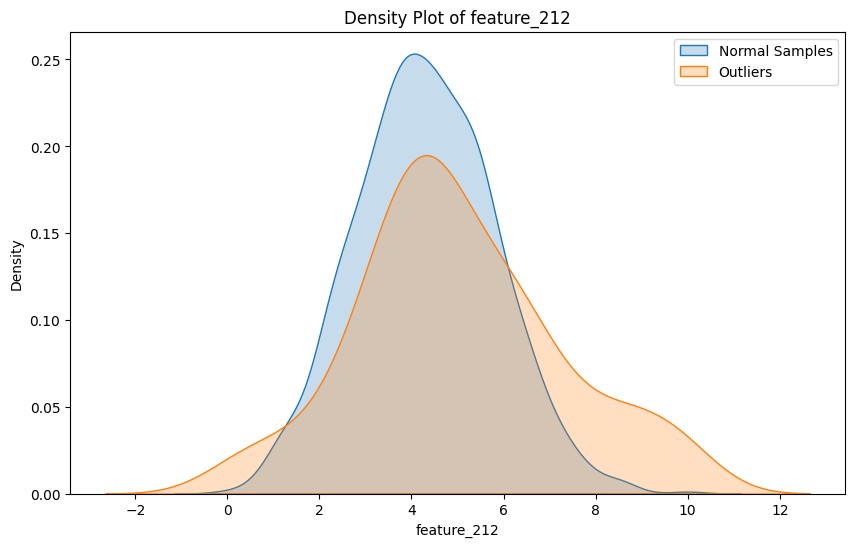

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


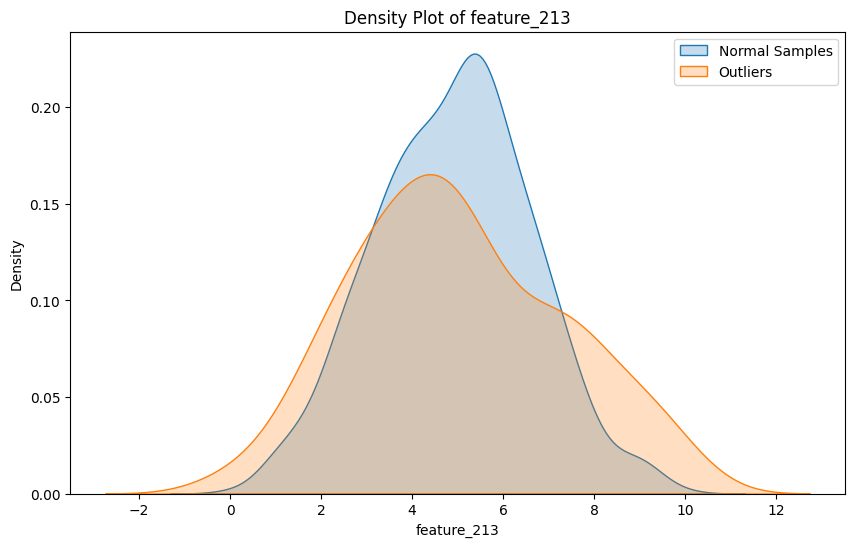

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


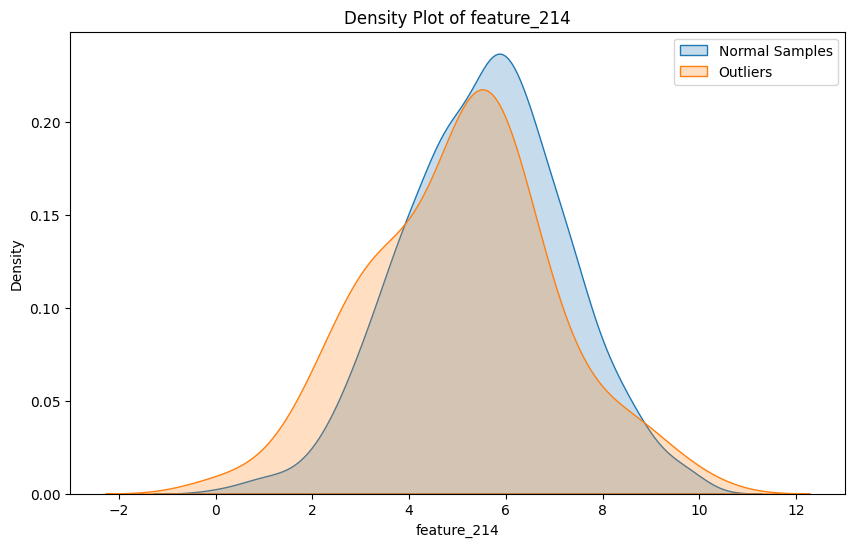

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


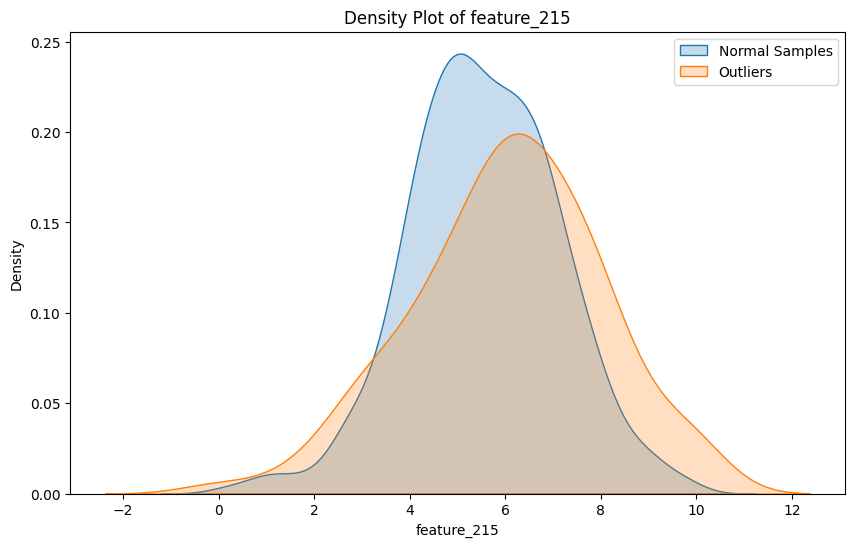

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


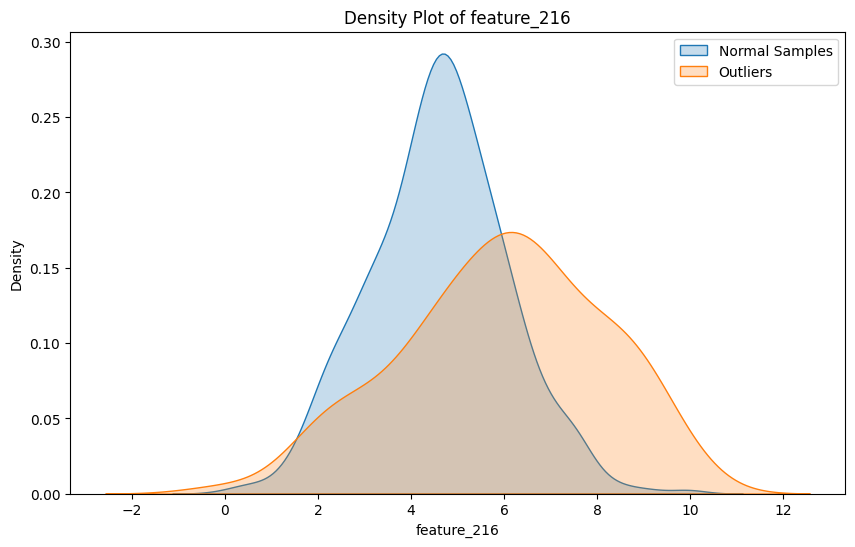

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


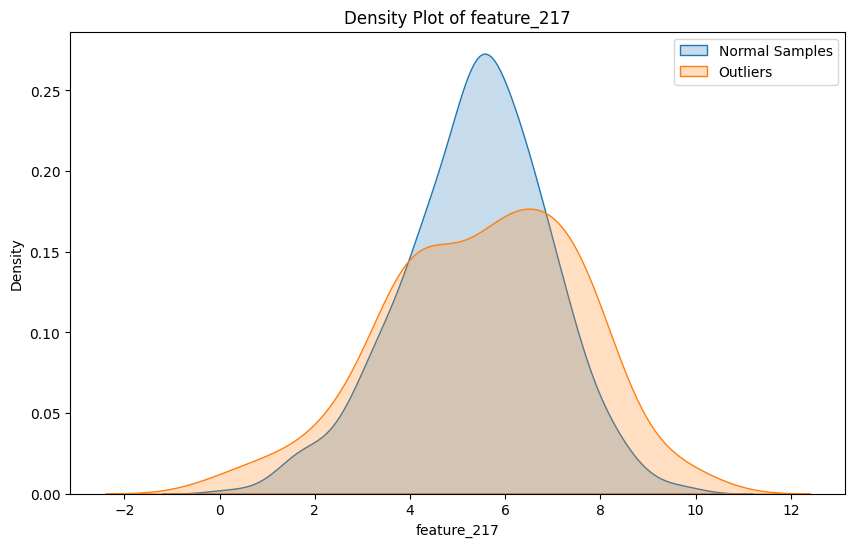

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


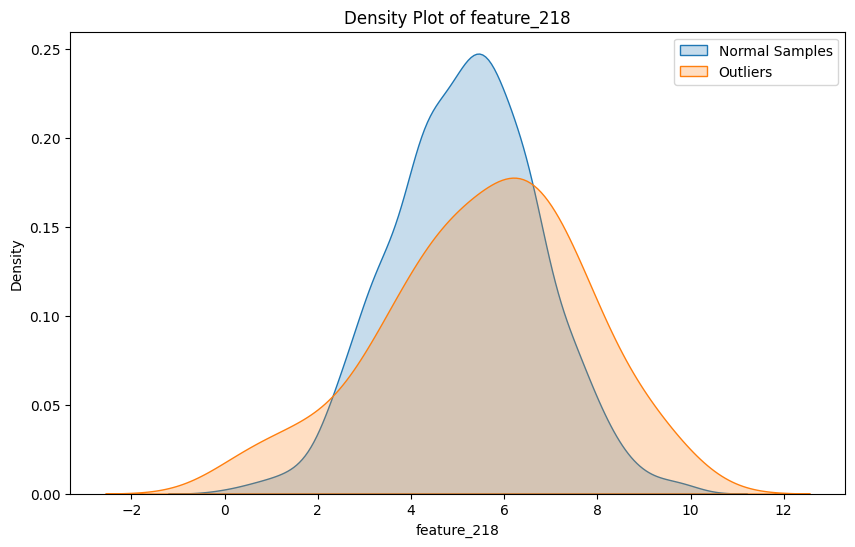

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


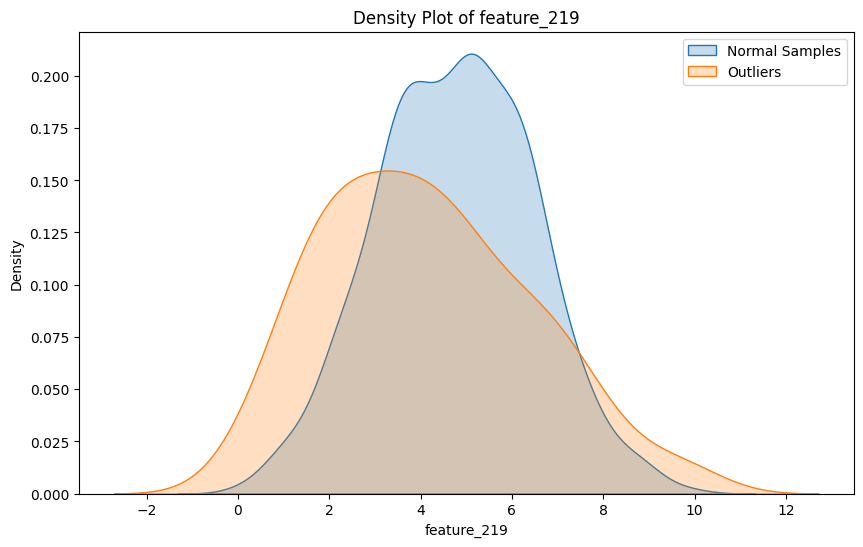

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


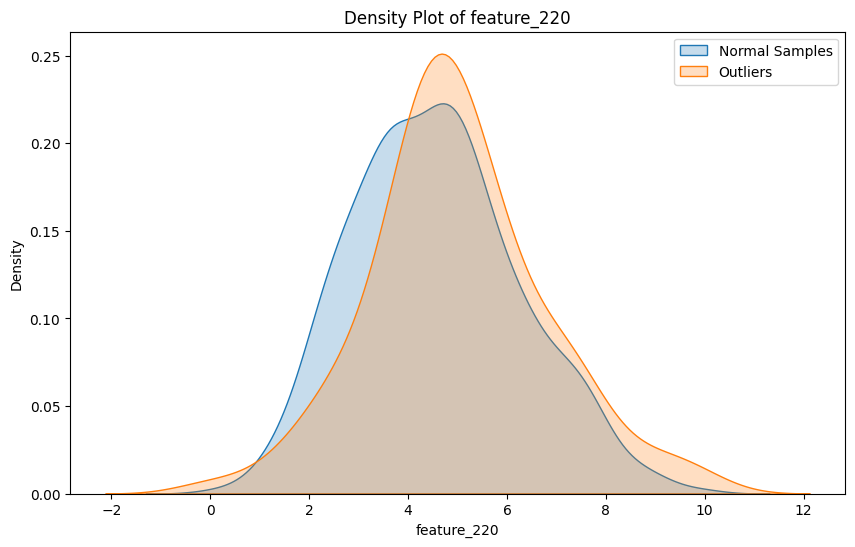

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


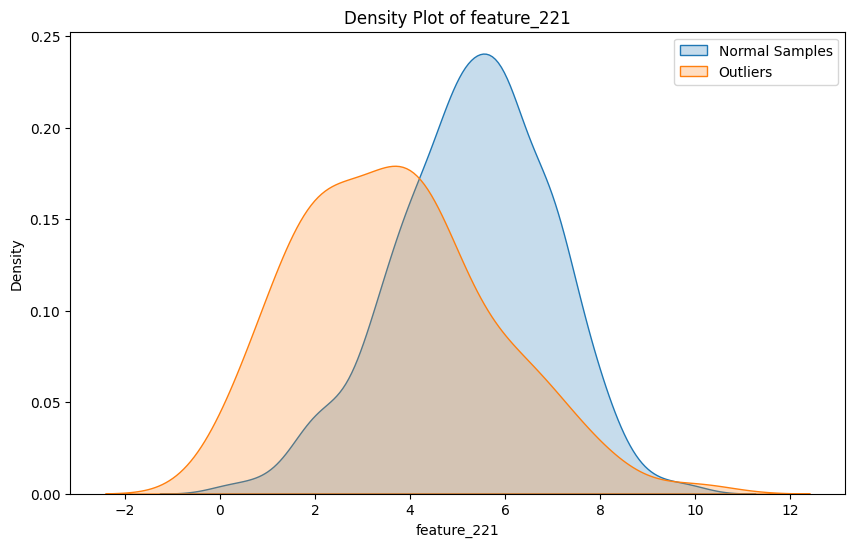

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


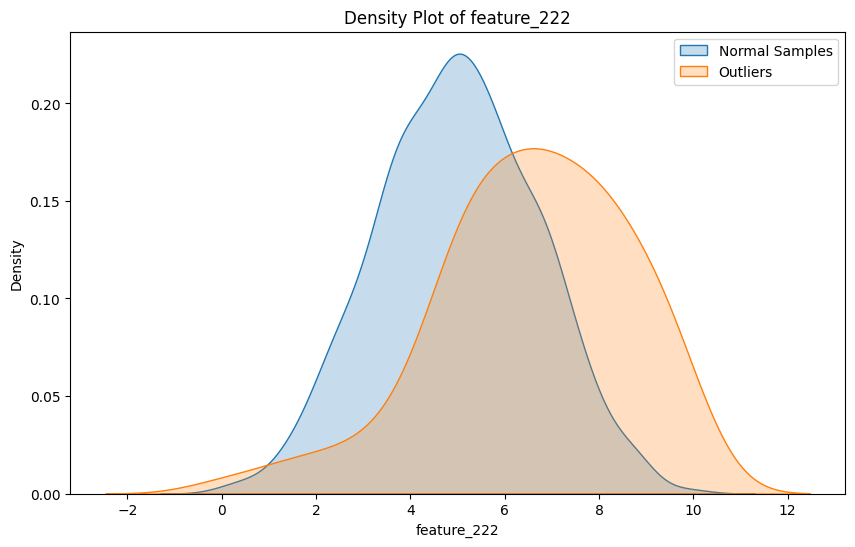

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


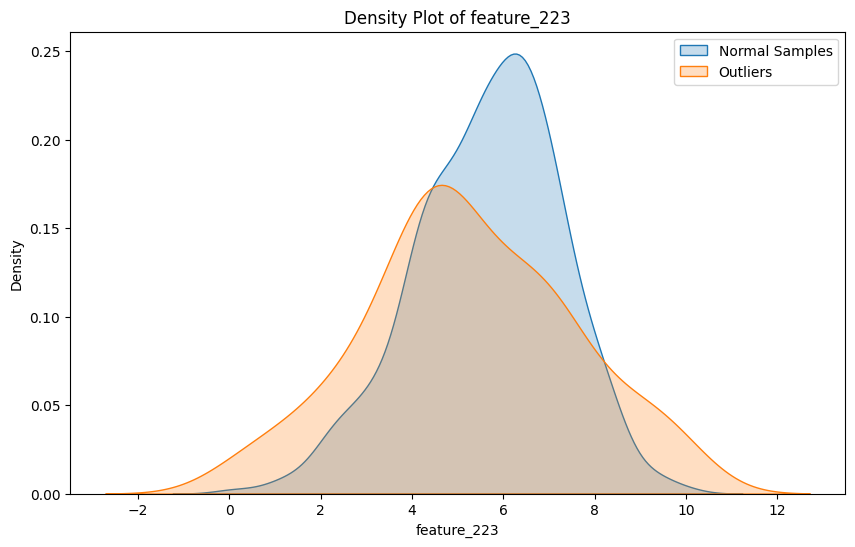

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


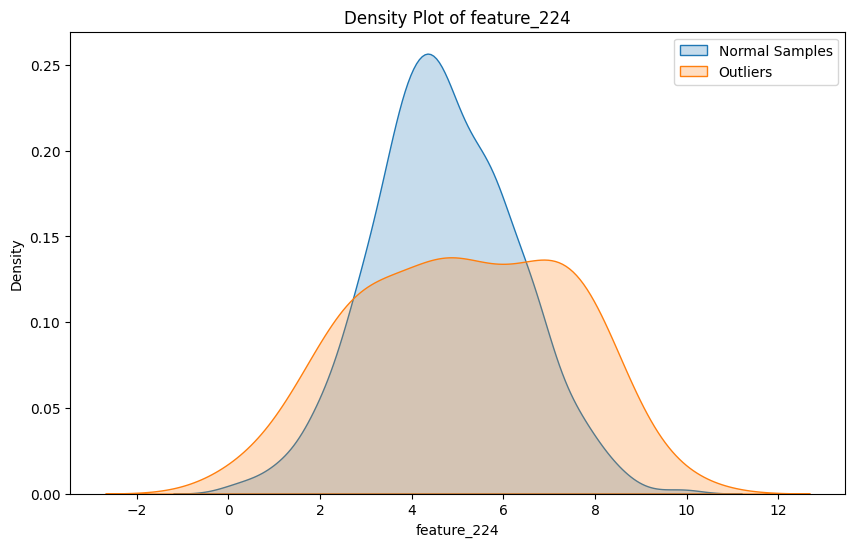

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


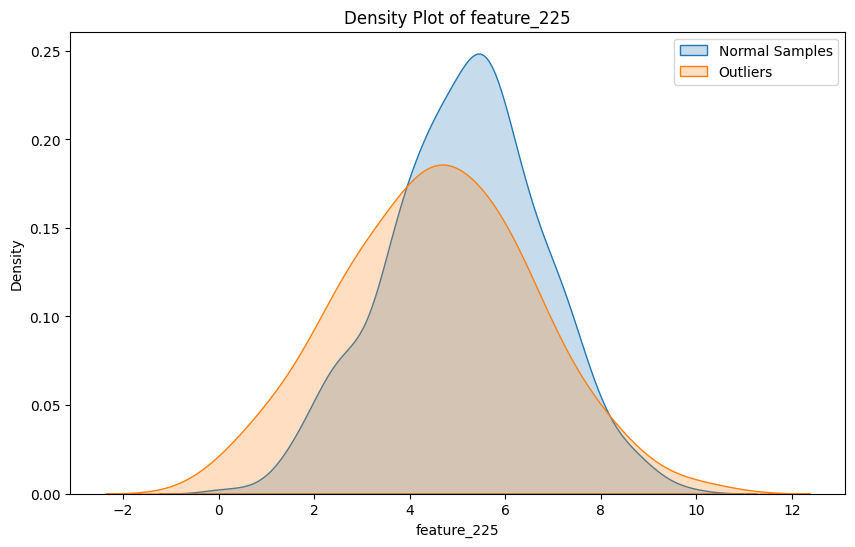

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


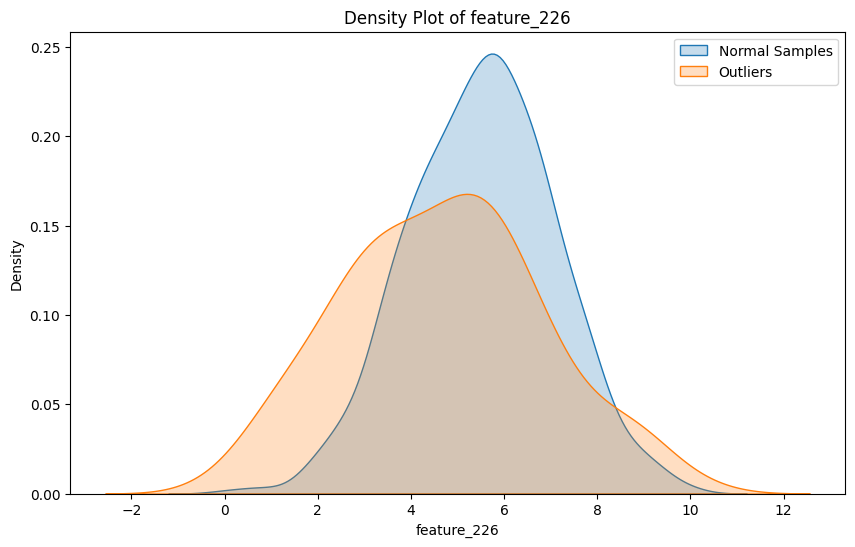

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


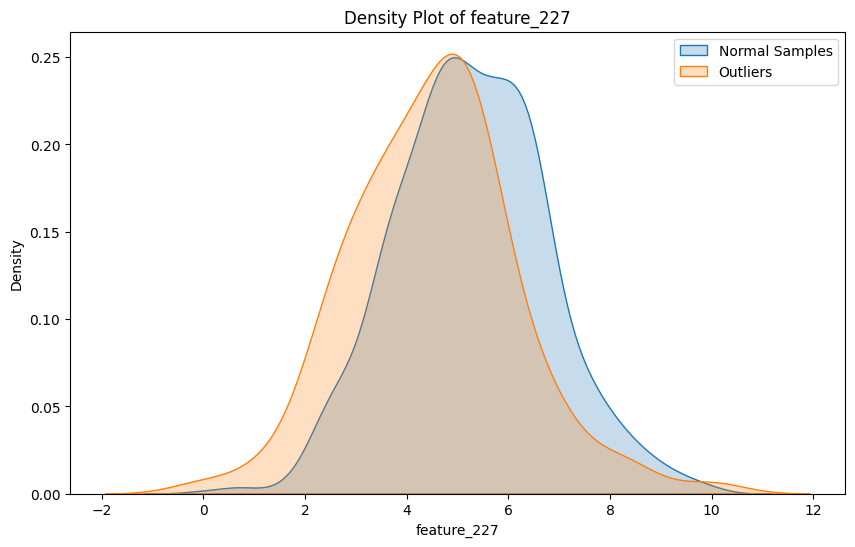

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


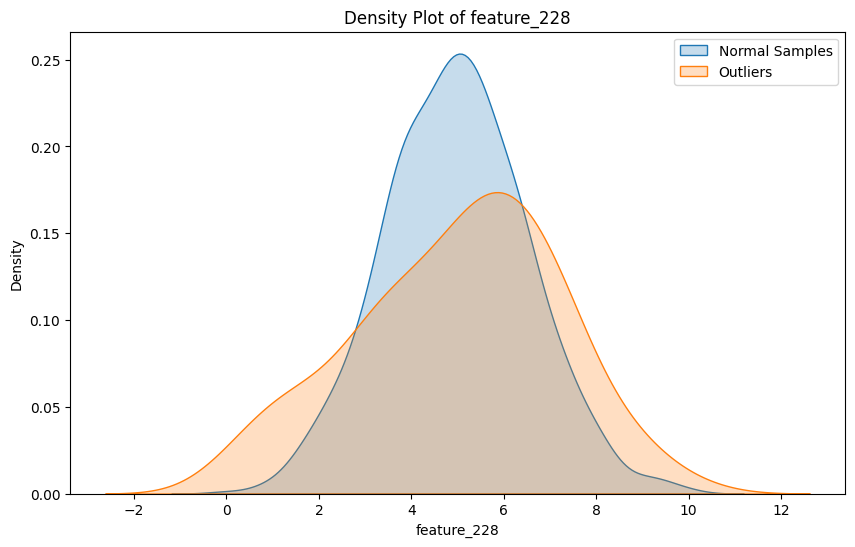

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


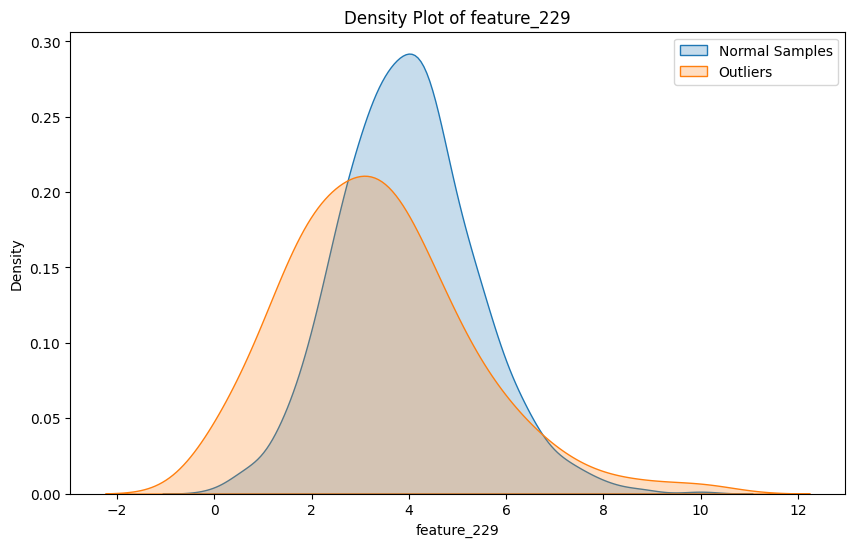

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


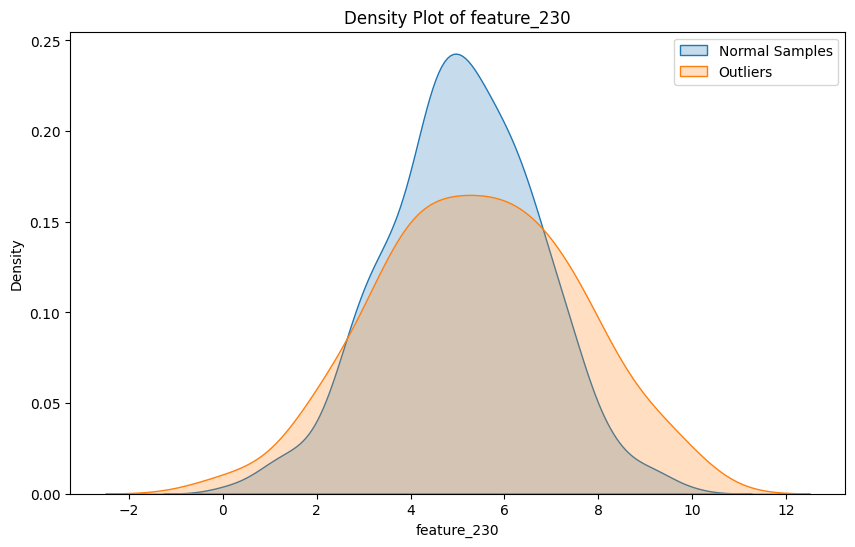

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


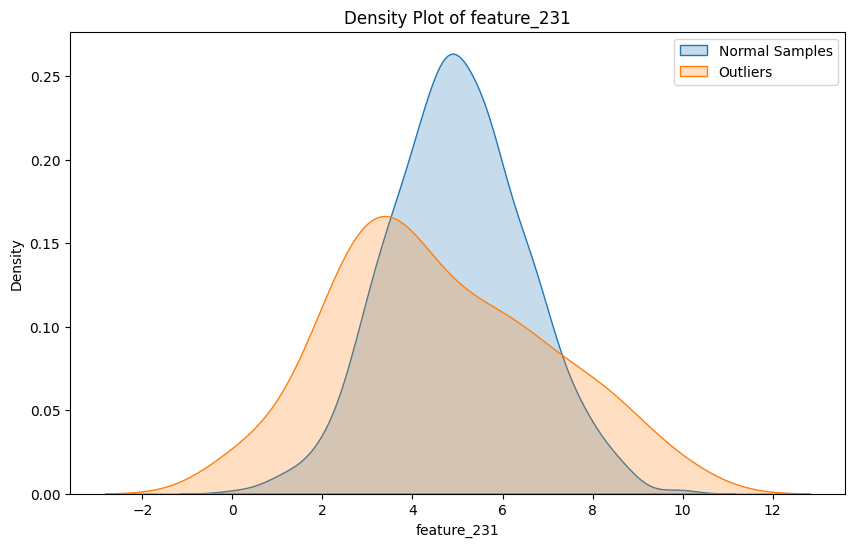

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


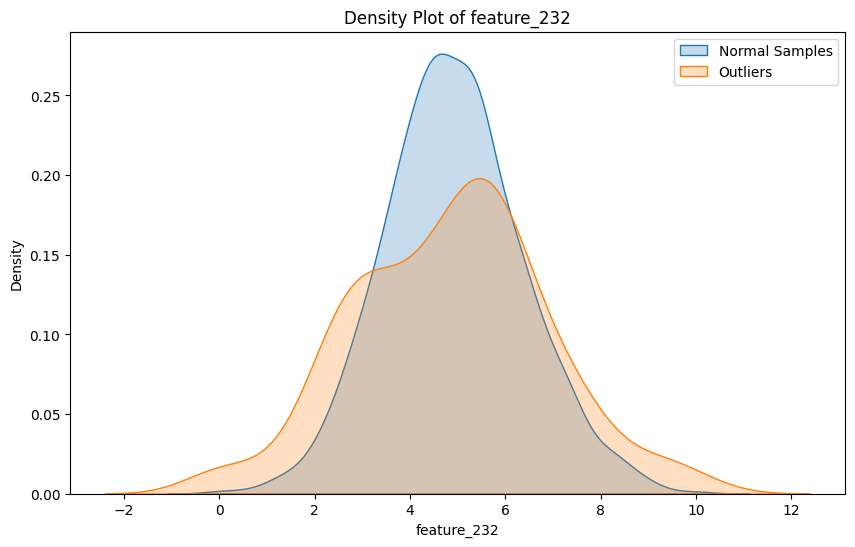

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


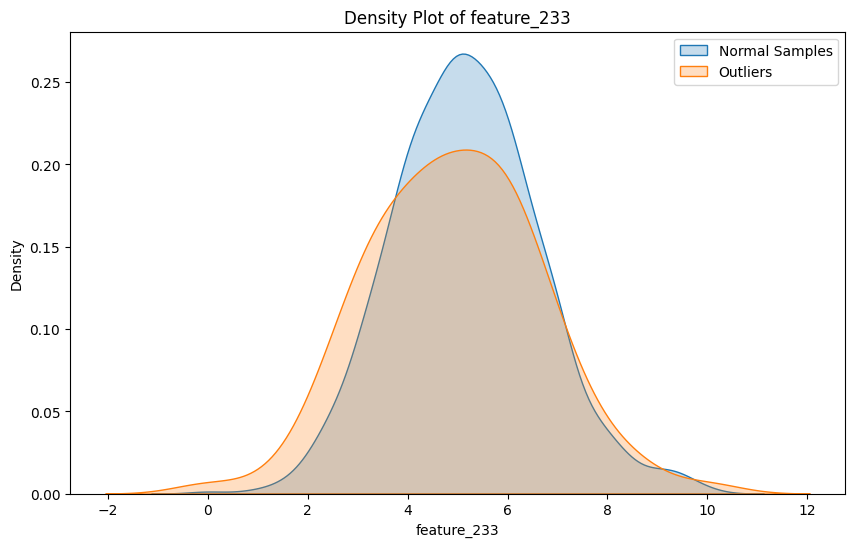

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


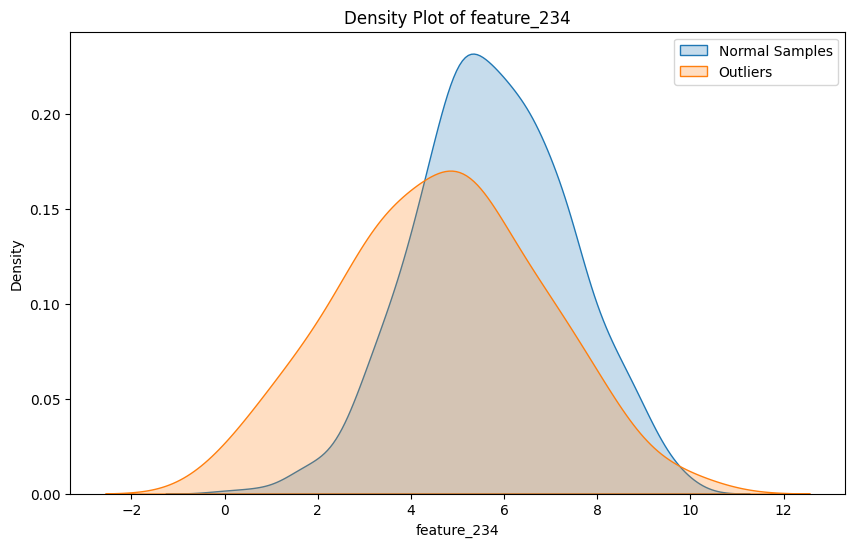

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


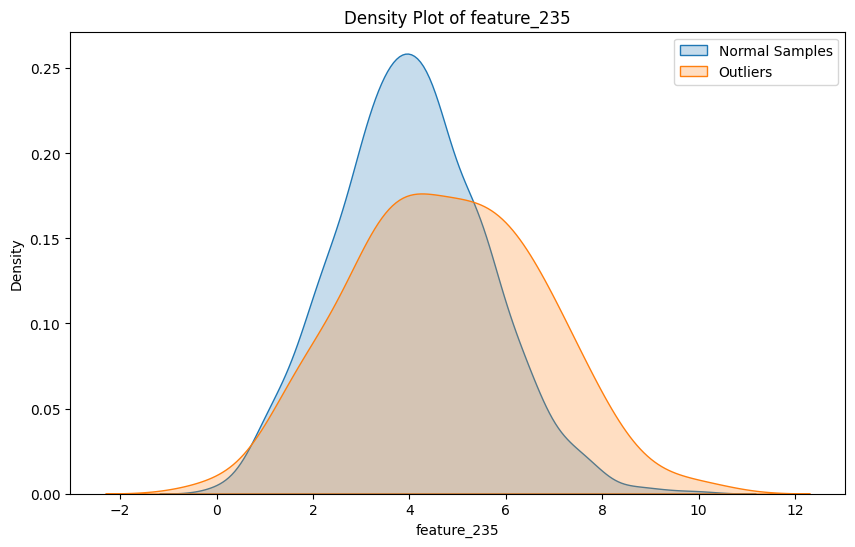

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


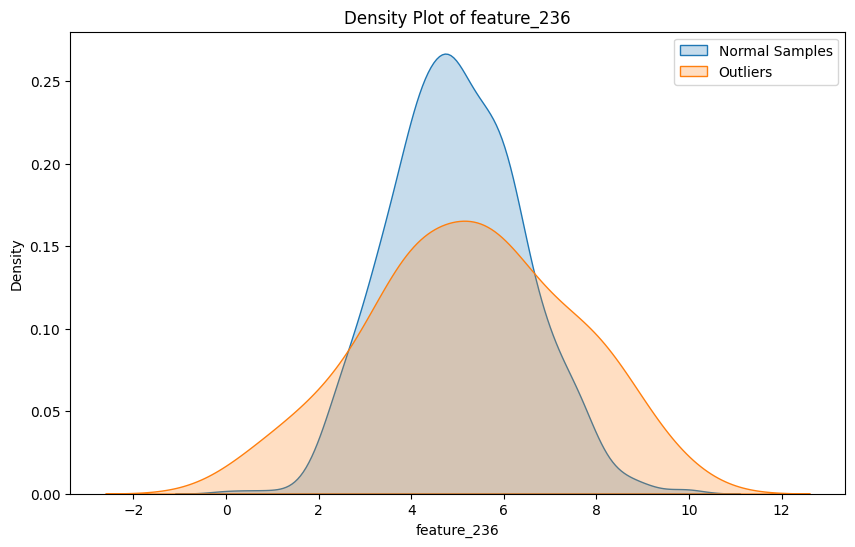

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


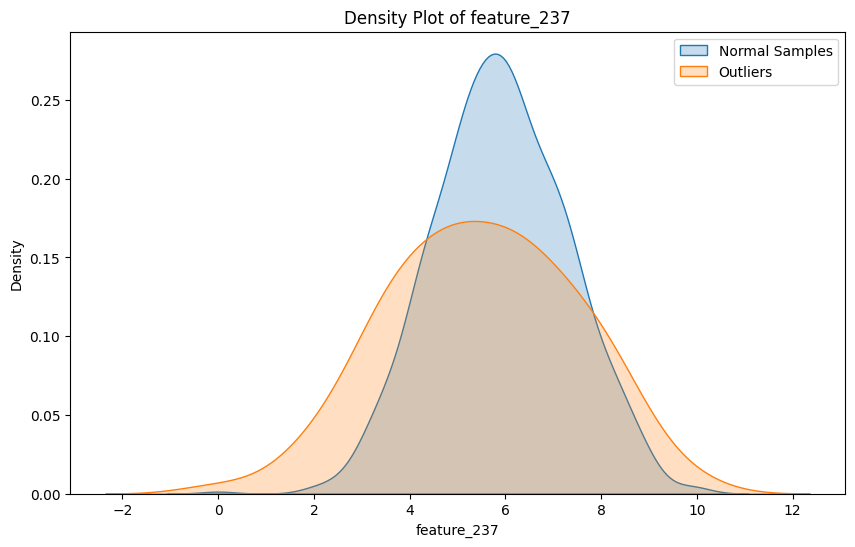

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


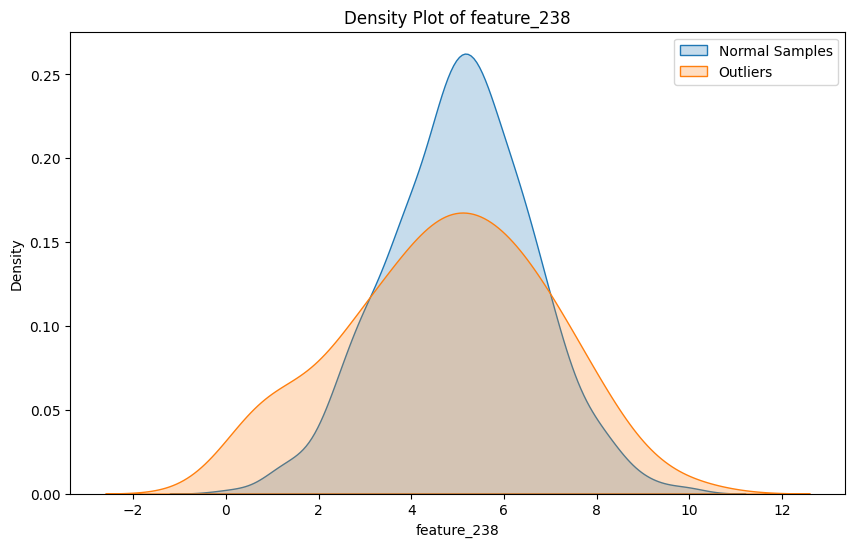

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


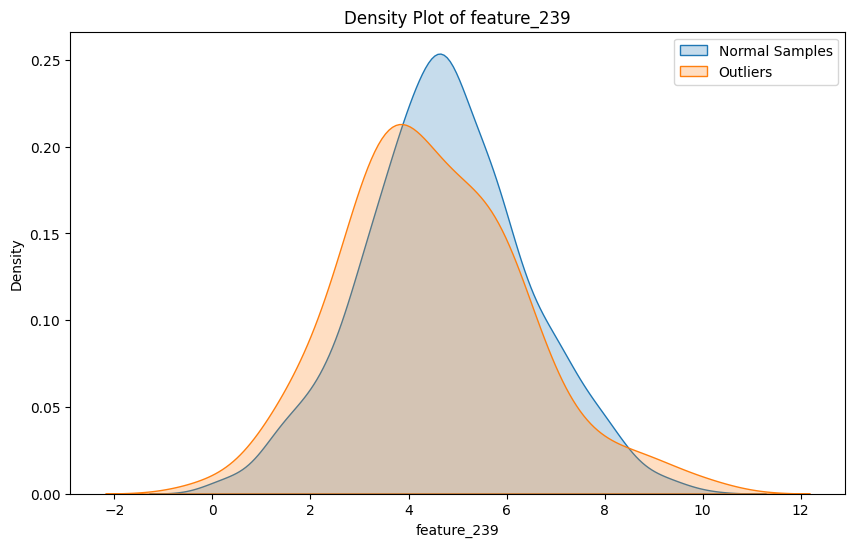

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


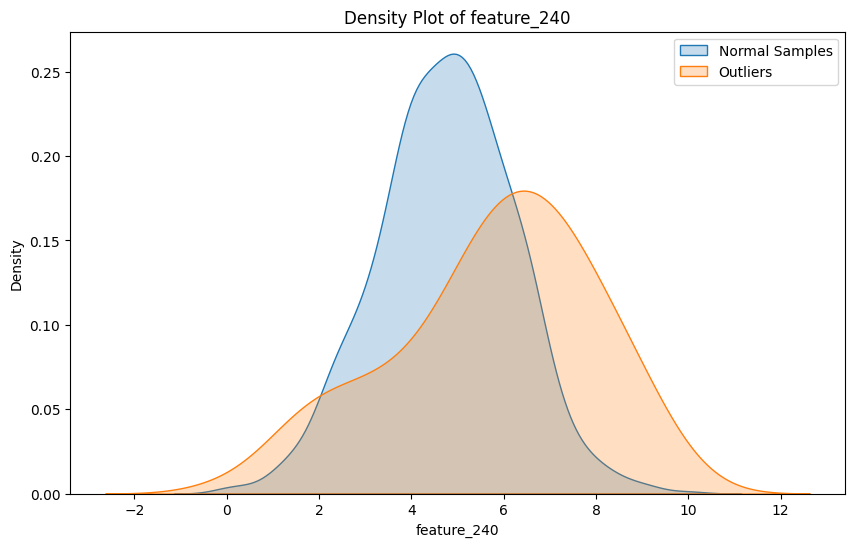

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


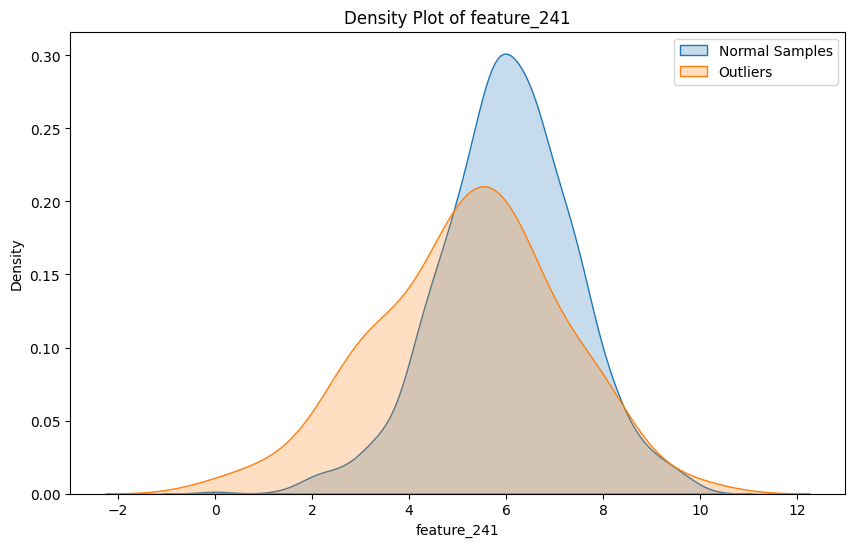

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


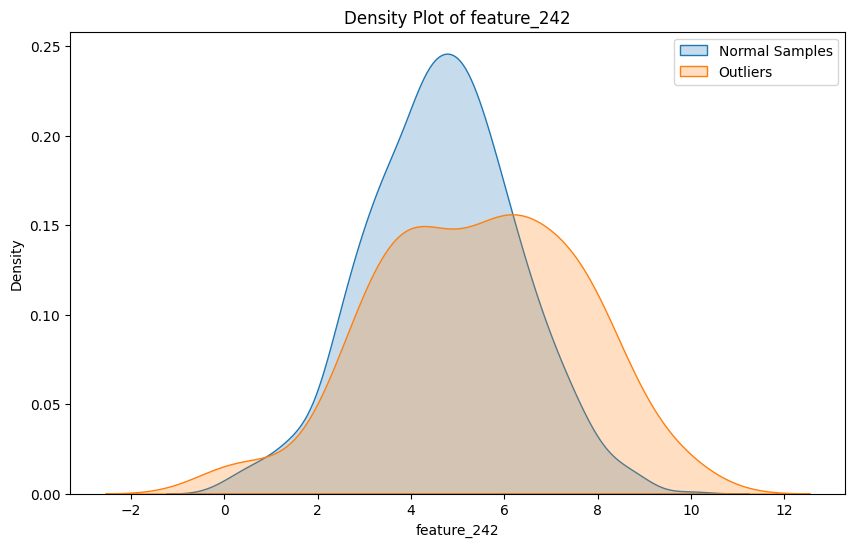

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


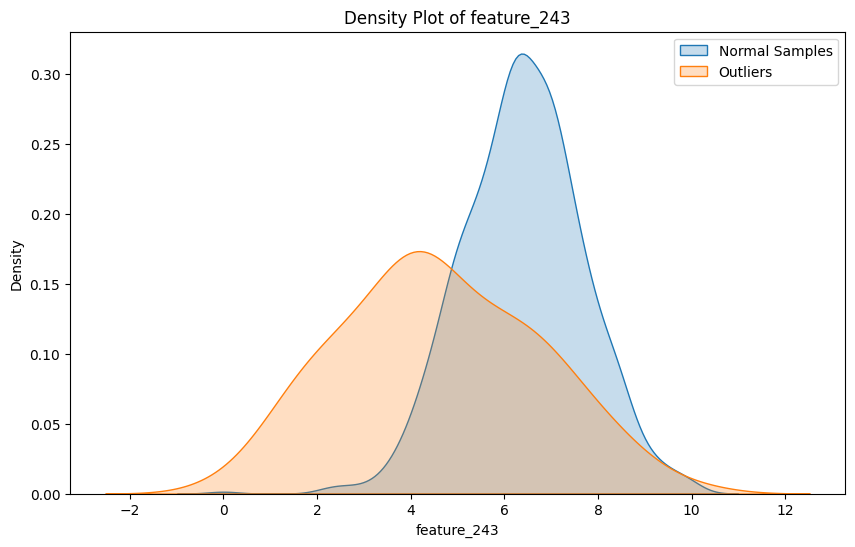

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


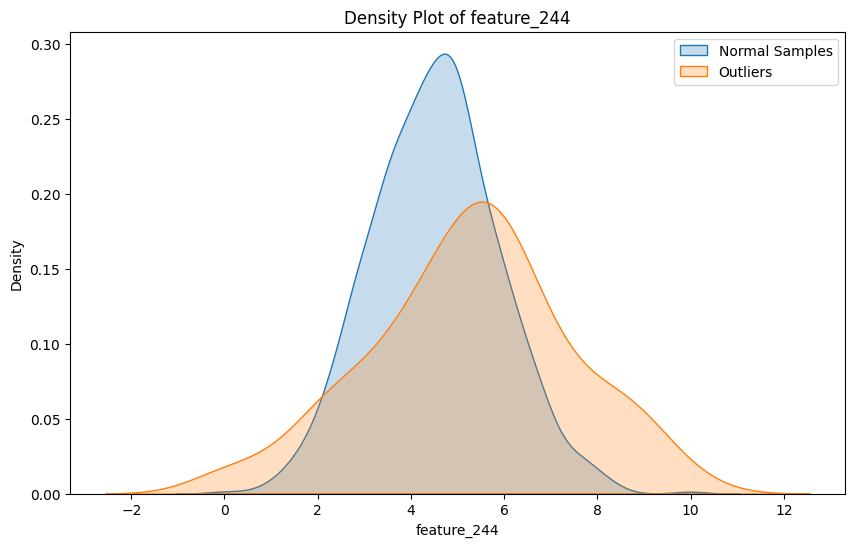

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


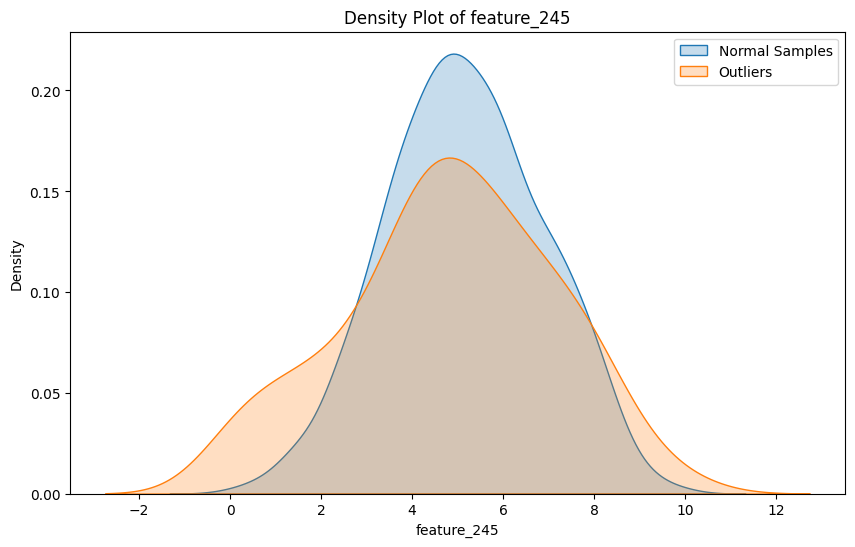

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


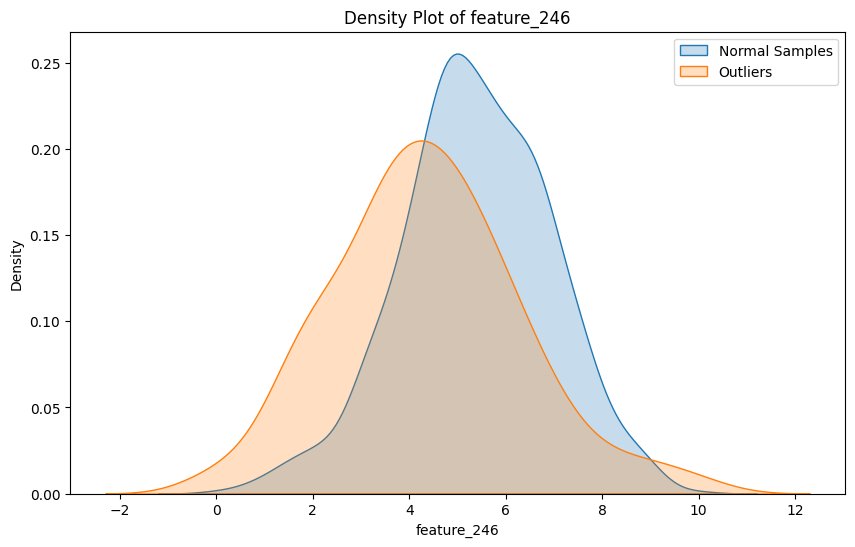

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


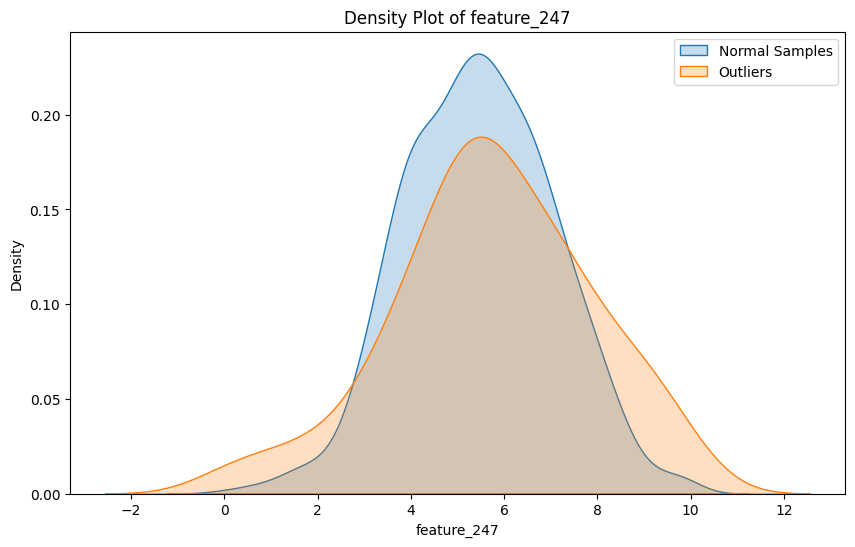

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


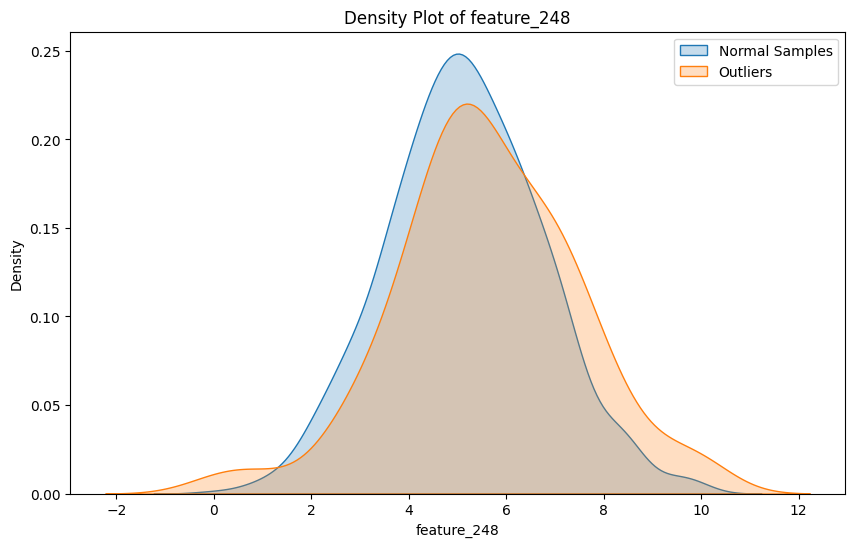

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


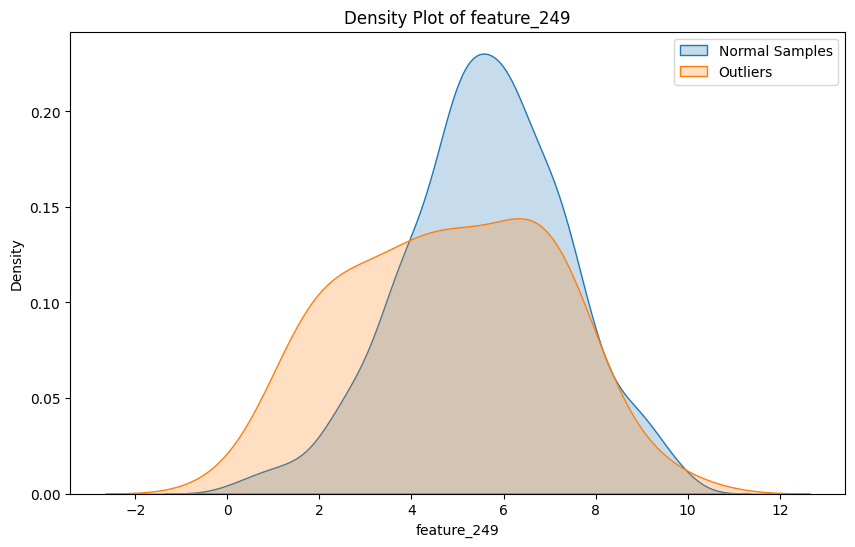

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


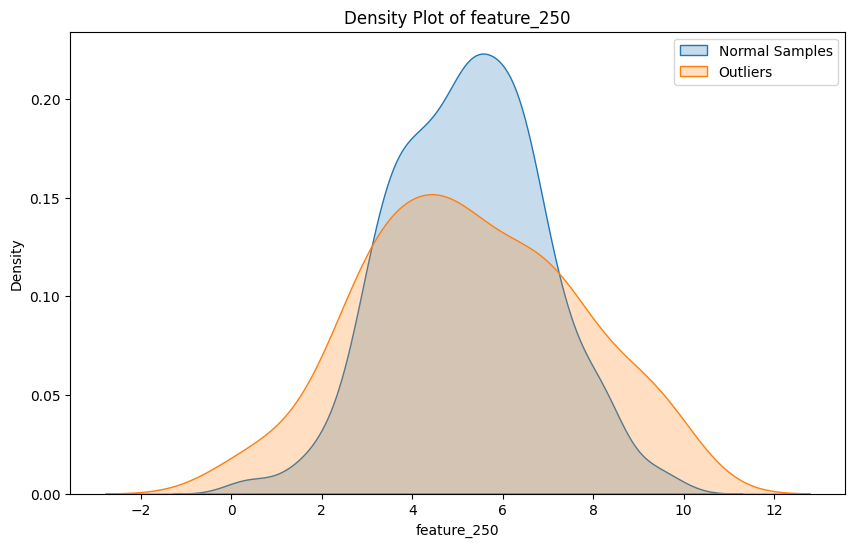

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


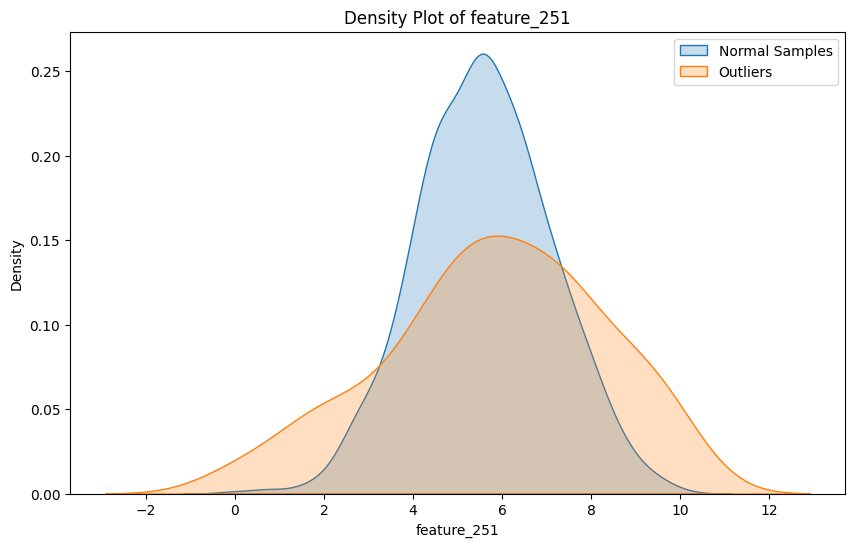

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


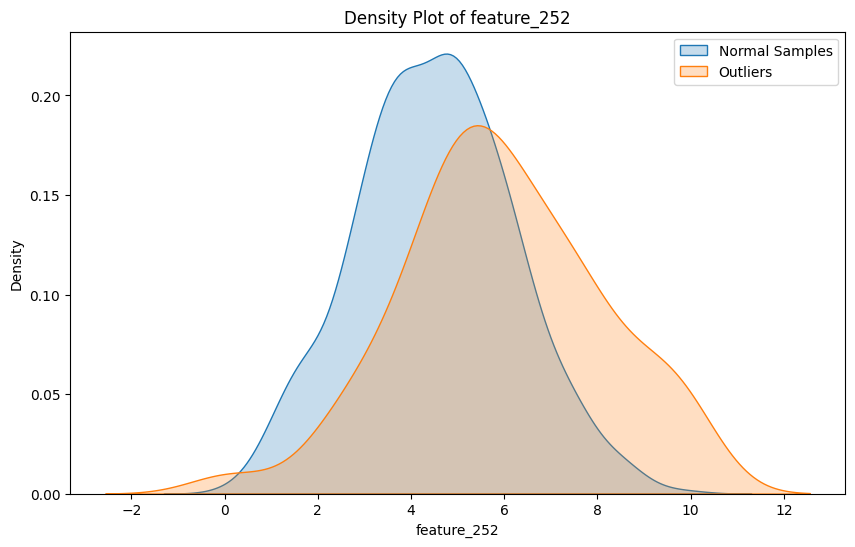

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


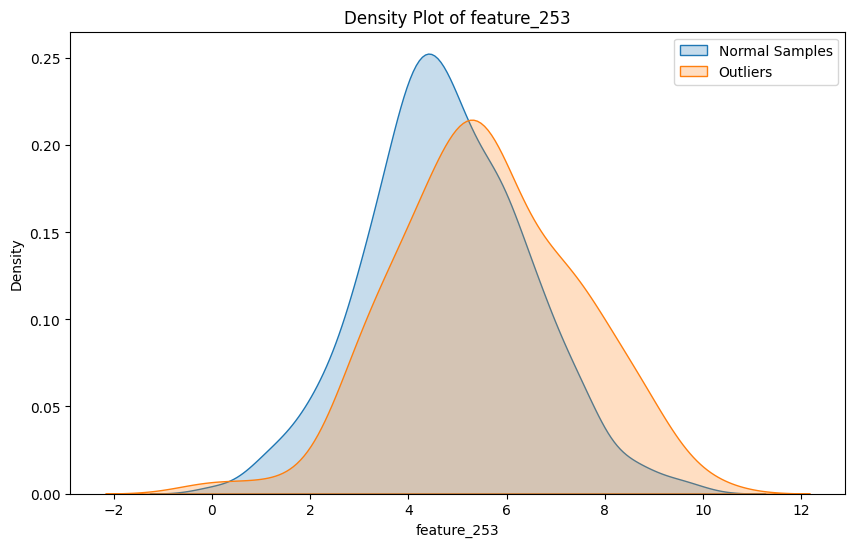

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


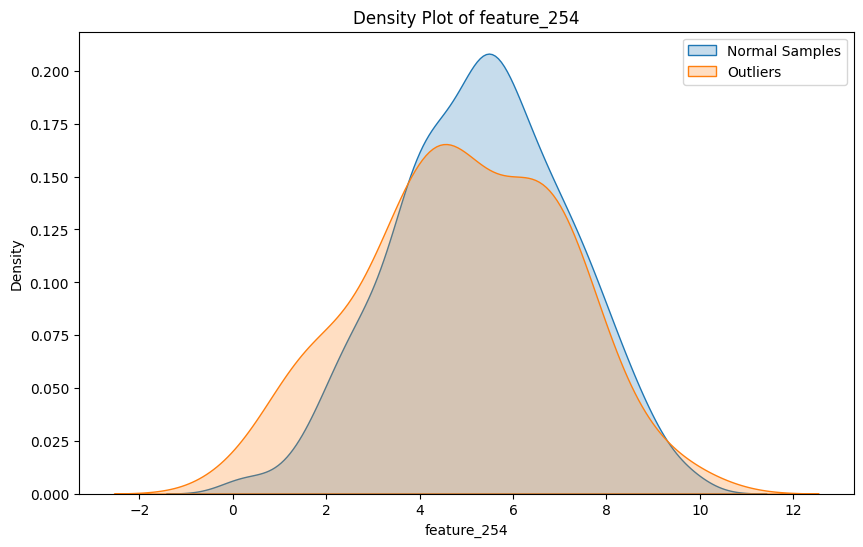

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


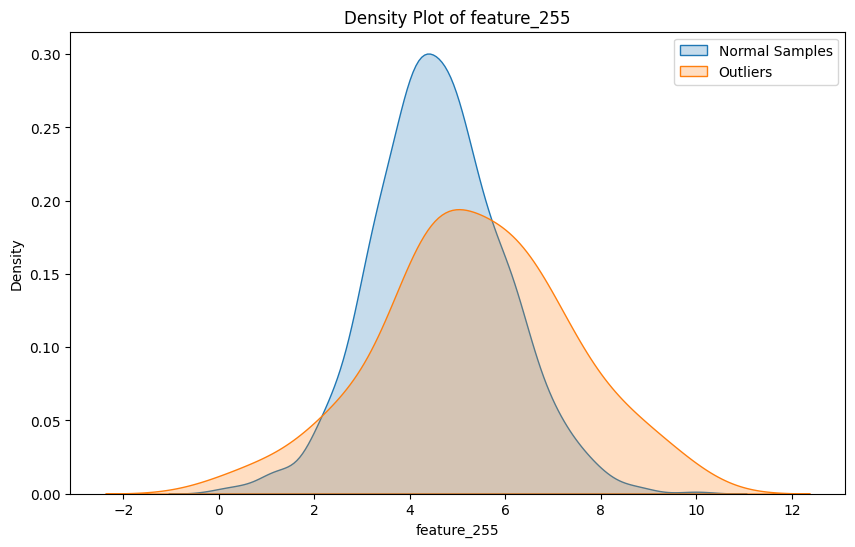

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


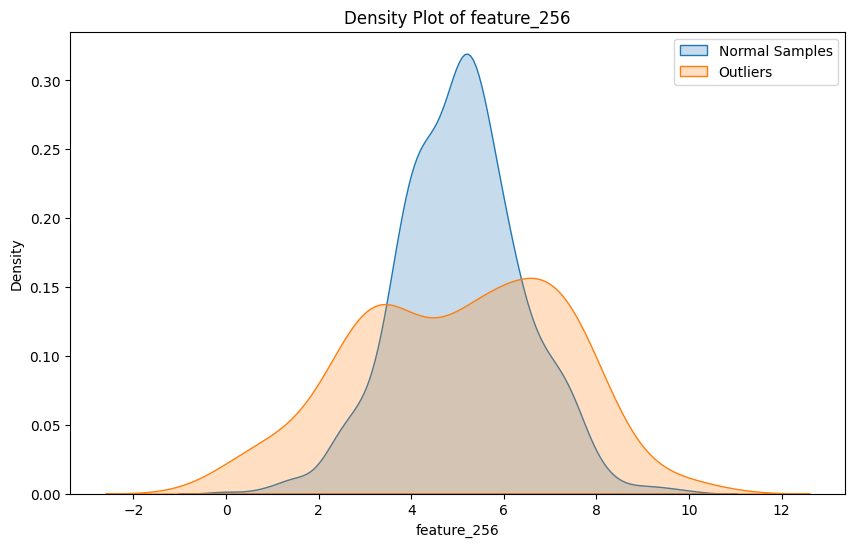

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


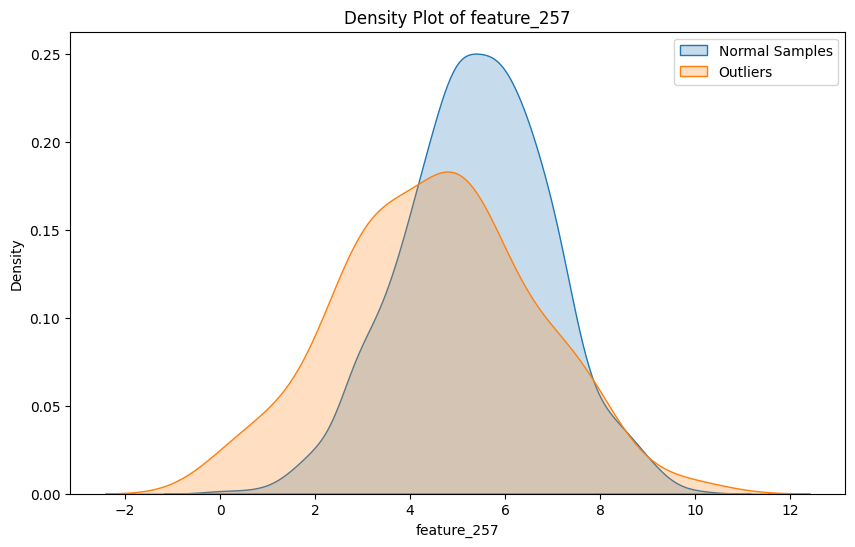

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


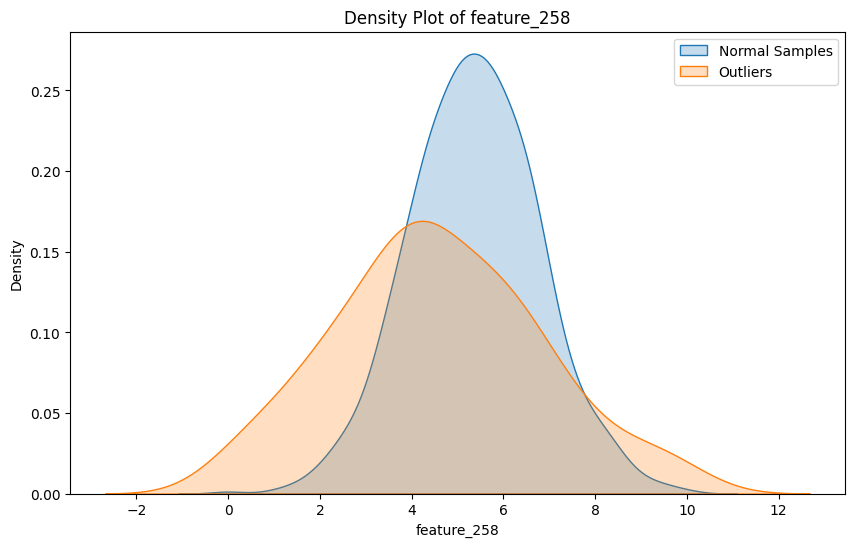

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


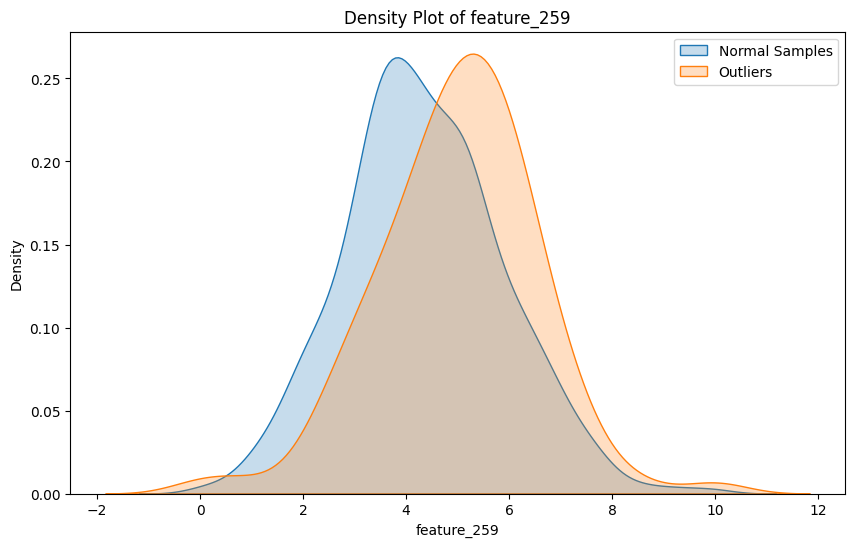

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


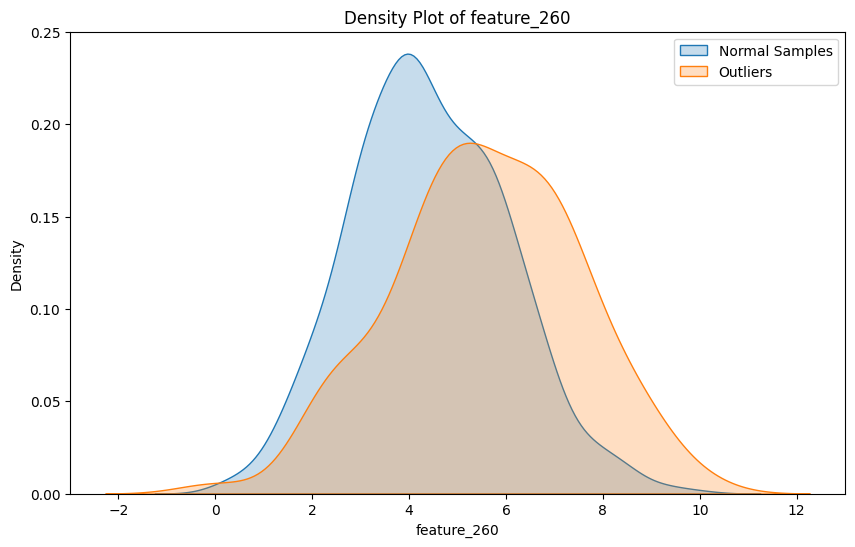

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


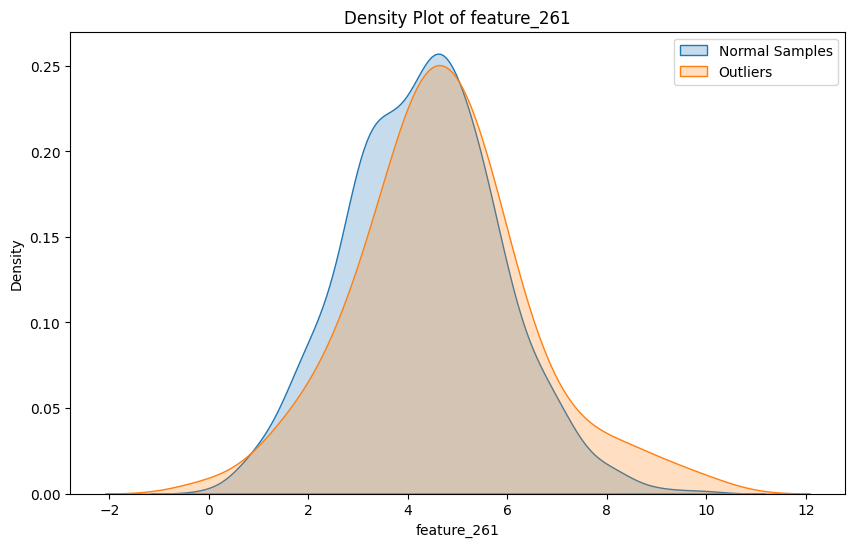

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


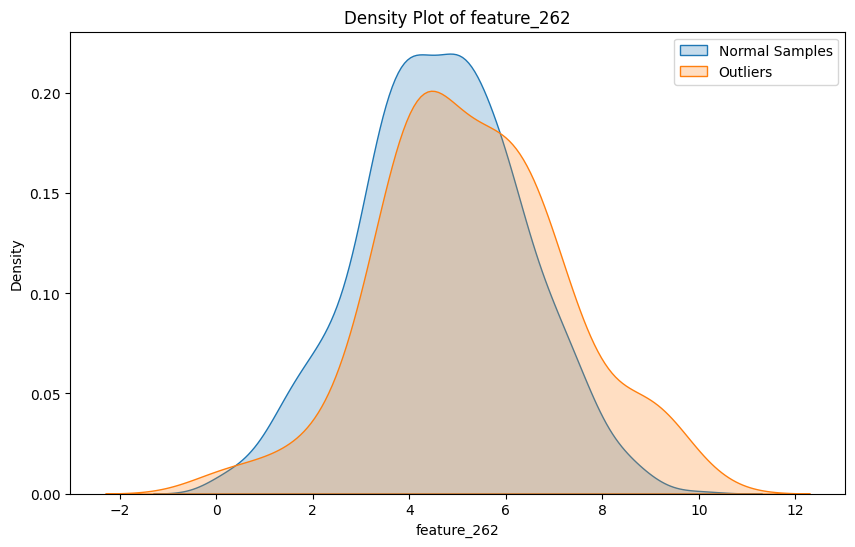

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


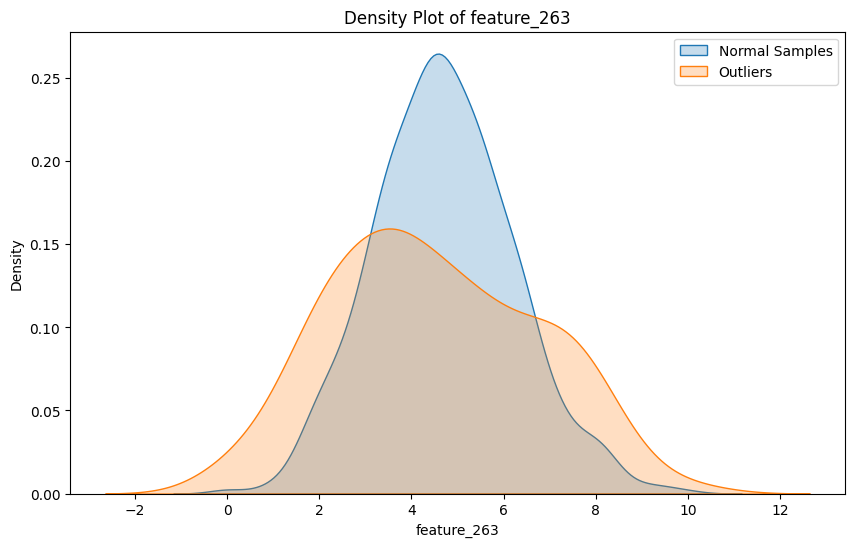

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


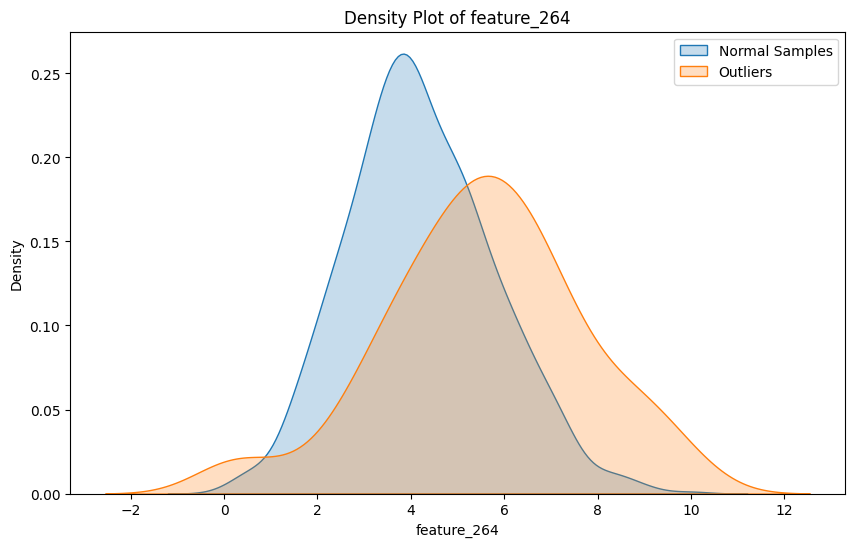

C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
C:\Users\alexi\AppData\Local\Temp\ipykernel_22204\490267149.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)


KeyboardInterrupt: 

In [ ]:
import seaborn as sns

def plot_density(normal_samples, outlier_samples, columns):
    for column in columns:
        plt.figure(figsize=(10, 6))
        sns.kdeplot(normal_samples[column], label='Normal Samples', shade=True)
        sns.kdeplot(outlier_samples[column], label='Outliers', shade=True)
        plt.title(f'Density Plot of {column}')
        plt.xlabel(column)
        plt.ylabel('Density')
        plt.legend(loc='upper right')
        plt.show()

# Usage
plot_density(normal_samples, outlier_samples, combined_df.columns)
